# **Mortgage Bank Loan E2E Analysis**

Mortgage Bank Loan Analytics with ARIMA and Machine Learning Mortgage Loans Analytics Banks can now use mortgage loan analytics using Data Science techniques. The system can provide detail information of the mortgage loans and the mortgage loan markets. It is a powerful tool for mortgage brokers to seek counterparties and generate trading interests and is useful for the CFOs to conduct what-ifs scenarios on the balance sheets.

Loan file template requires below details: 
- Loan ID: to identify the special loan 
- Loan Type: to indicate the loan if fixed rate, or balloon loan , or ARM, or AMP (alternative mortgage product).
- Balance: 
- Loan program type: to indicate conforming loan, FHA/VA loan, Jumbo loan or sub-prime loan 
- Current coupon rate: 
- Amortization type: the original amortization term 
- Maturity: the maturity loan (the remaining term of the loan) 
- FICO Score: the updated fico score 
- LTV: the current loan to value ratio 
- Loan Size: the loan amount of the loan 
- Loan origination location (City & Zip) 
- Unit Types (Types of property)

In [1]:
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
import os                             # Library to do things on the filesystem
import pandas as pd                   # Super cool general purpose data handling library
import matplotlib.pyplot as plt       # Standard plotting library
import seaborn as sns
import numpy as np                    # General purpose math library
from IPython.display import display   # A notebook function to display more complex data (like tables)
import scipy.stats as stats

In [3]:
import numpy as np
from scipy.stats import kurtosis
from scipy.stats import skew

In [4]:
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', header=0, encoding='cp1252')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2501 entries, 0 to 2500
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   First Name              2501 non-null   object 
 1   Last Name               2501 non-null   object 
 2   City                    2501 non-null   object 
 3   State                   2501 non-null   object 
 4   Zip                     2501 non-null   int64  
 5   Loan Amount             2501 non-null   float64
 6   Estimated Value         2501 non-null   int64  
 7   Loan Purpose            2501 non-null   object 
 8   Qualification FICO      2501 non-null   int64  
 9   Is Primary Wage Earner  2501 non-null   bool   
 10  Income Type             2501 non-null   object 
 11  Asset Docs              2501 non-null   object 
 12  Occupancy               1846 non-null   object 
 13  Unit Type               2501 non-null   object 
 14  Loan Type               2501 non-null   

In [5]:
data.shape

(2501, 24)

In [6]:
# Print the 5th and 95th percentiles
data.quantile([0.05, 0.95])


,Zip,Loan Amount,Estimated Value,Qualification FICO,Is Primary Wage Earner,Fix,ARM,CLTV,LoanInMonth
0.05,7083.0,150000.0,205275.0,636.0,0.0,0.0,0.0,0.0,3.0
0.95,11756.0,840000.0,1400000.0,803.0,1.0,1.0,1.0,96.0,56.0


In [7]:
data['Loan Amount'].quantile([0.05, 0.95])

0.05    150000.0
0.95    840000.0
Name: Loan Amount, dtype: float64

In [8]:
data['Loan Amount'].quantile([0.1, 0.90])

0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64

In [9]:
St=['CT', 'FL', 'NJ', 'NY', 'PA']
print(St)

['CT', 'FL', 'NJ', 'NY', 'PA']


In [10]:
#DataFrame subsets by State
ct_data = data[data['State'].isin(['CT'])]
fl_data = data[data['State'].isin(['FL'])]
ny_data = data[data['State'].isin(['NY'])]
nj_data = data[data['State'].isin(['NJ'])]
pa_data = data[data['State'].isin(['PA'])]

In [11]:
#Selecting data per column
filtered_columns =('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'unit_type_code', 'Loan Type')
ct_lo_amount = ct_data.reindex(columns=filtered_columns)
fl_lo_amount = fl_data.reindex(columns=filtered_columns)
nj_lo_amount = nj_data.reindex(columns=filtered_columns)
ny_lo_amount = ny_data.reindex(columns=filtered_columns)
pa_lo_amount = pa_data.reindex(columns=filtered_columns)

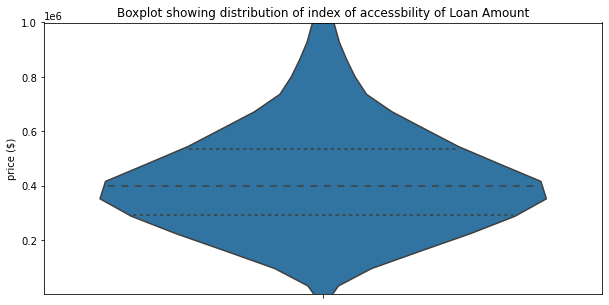

In [12]:
#creating boxplot to see the distribution median and outliers
plt.figure(figsize=(10,5))
sns.violinplot(y=data['Loan Amount'],inner="quartile")
plt.title("Boxplot showing distribution of index of accessbility of Loan Amount")
plt.ylim(0.1,1000000)
plt.ylabel('price ($)')
plt.show()

We can see that mid 50% loan amount between USD 340,000 &  USD 570,000

# Mortgage interest rates

Mortgage interest rates have a significant impact on the amount of mortgage applications. If the interest rates are low, the mortgages are relatively cheaper for the borrower as they have to pay less interest, which leads to an increased amount of mortgage applications. A high mortgage interest rate means the mortgage borrower pays a high amount of interest to the lender, which makes the mortgage less attractive for the borrower. Interest rate changes have a significant impact on mortgage applications, as was seen in November of last year, where a sudden increase in interest rates led to a large peak in mortgage applications. The main difference between the mortgages offered by these types of companies lies in the mortgage interest rates. Even a small difference in mortgage interest rates can often save or cost the borrower a vast amount of money, due to the large sum of a mortgage.

In general, there are two types of mortgage interest rate: variable rates (ARM) and fixed rates. Variable interest rates are generally lower than fixed interest rates, but can change every month. Fixed interest rates are slightly higher, but are fixed for a certain period of time. A fixed interest rate is generally preferred when the mortgage interest rates are expected to rise, or when the borrower wants to know its monthly expenses upfront. A variable interest rate (ARM) is preferred when interest rates are expected to decrease. If a financial institution has a significantly higher interest rate than its competitors, it will generally receive fewer mortgage applications as the independent mortgage advisors will forward its customers to a different mortgage lender.

Financial institutions sometimes increase their interest rates during the summer months, and at the end of the year, as there is less personnel available to handle the requests due to vacations and holidays. With less personnel available they can handle less mortgage requests, so in order to keep the processing time the same they choose to reduce the input, by increasing the interest rates. Financial institutions may also specifically keep interest rates low for mortgages with a certain fixed interest period. Interest rate changes are not always directly influenced by changes in the cost of lending, but can have numerous reasons.


## Load US 10-Years Treasury Data

In [13]:
US10Y = pd.read_csv('../input/mortgage-bank-loan/US10Y.csv', header=0, index_col='DATE', encoding='cp1252')
US10Y.head()

,RATE
DATE,
10/14/2014,2.21
10/15/2014,2.15
10/16/2014,2.17
10/17/2014,2.22
10/20/2014,2.2


In [14]:
US10Y.RATE.value_counts()

.       46
2.33    21
2.27    20
2.32    19
2.24    19
        ..
2.58     1
2.64     1
3.24     1
1.38     1
3.21     1
Name: RATE, Length: 169, dtype: int64

In [15]:
US10Y.replace(".", value=np.nan, inplace=True)
US10Y= US10Y.replace(to_replace=-1, value=np.nan)
US10Y.RATE.value_counts()

2.33    21
2.27    20
2.32    19
2.24    19
2.36    18
        ..
3.21     1
3.24     1
1.38     1
1.48     1
1.4      1
Name: RATE, Length: 168, dtype: int64

In [16]:
US10Y= US10Y.fillna(method='ffill')
US10Y= US10Y[['RATE']].astype('float64')
US10Y.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1098 entries, 10/14/2014 to 12/27/2018
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RATE    1098 non-null   float64
dtypes: float64(1)
memory usage: 17.2+ KB


In [17]:
US10Y.describe()

,RATE
count,1098.000000
mean,2.302286
std,0.423337
min,1.370000
25%,2.030000
50%,2.270000
75%,2.507500
max,3.240000


In [18]:
US10Y.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1098 entries, 10/14/2014 to 12/27/2018
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RATE    1098 non-null   float64
dtypes: float64(1)
memory usage: 17.2+ KB


In [19]:
type(US10Y)

pandas.core.frame.DataFrame

In [20]:
total_missing_rate=US10Y.isnull().sum() #Checking for missing values
total_missing_rate

RATE    0
dtype: int64

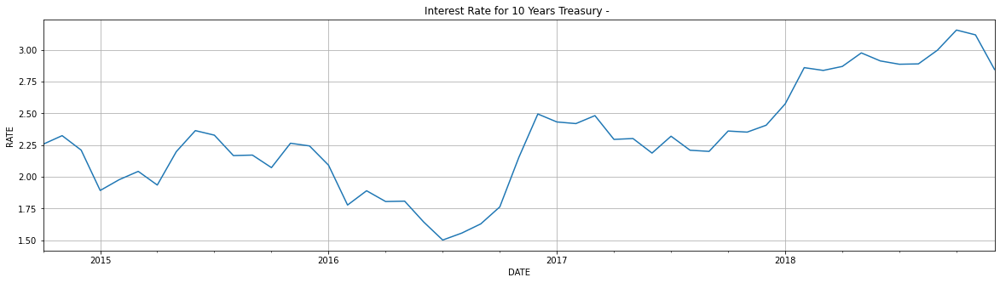

In [21]:
US10Y.index = pd.to_datetime(US10Y.index)
ax=monthly_rate_data=US10Y.resample('M').mean().plot(title="Interest Rate for 10 Years Treasury - ",figsize=(20,5))
plt.ylabel('RATE')
ax.get_legend().remove()
plt.grid()

# Display Monthly US Treasury 10 Years Interest Rate

Generally, when US 10 Years Treasury Rate fluctuates, that leads lenders to adjust their internal bank rates accordingly. Also interest rates for consumers varies on several risk factors, such as DTI (Debt to Income Ratio), FICO Scores, Recent derogatory events on their credit history, stable job history, W2 or 1099, Stated Income, Profit or Loss Statements, Student Loans, Auto Payments, Credit utilization, Property types, number of households, rental history, etc.

Interest Rate is currently historical low. In the short run rate may go ups and down but in the long run rate will go up. As housing price goes up, interest rate will go up to control the housing price.

In [22]:
import os                             # Library to do things on the filesystem
import pandas as pd                   # Super cool general purpose data handling library
import matplotlib.pyplot as plt       # Standard plotting library
import seaborn as sns
import numpy as np                    # General purpose math library
from IPython.display import display   # A notebook function to display more complex data (like tables)
import scipy.stats as stats  

In [23]:
loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()

,Loan Amount,Created Date
0,506250.0,10/14/2014
1,206250.0,10/14/2014
2,648700.0,10/14/2014
3,412750.0,10/14/2014
4,522588.0,10/14/2014


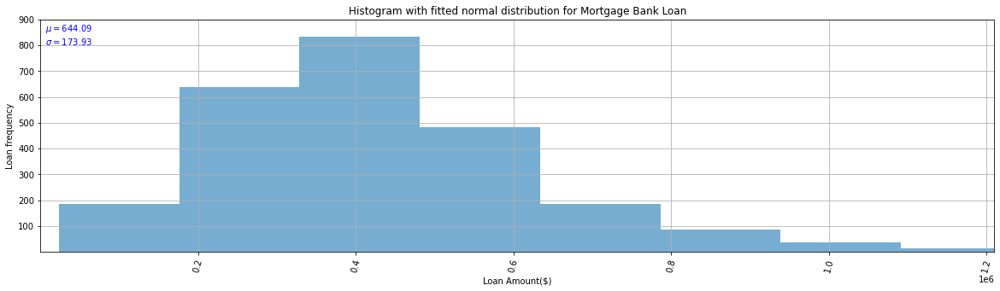

In [24]:
'''
We can create a histogram with 20 bins to show the distribution of purchasing patterns.'''

loan_patterns_plot = loan_patterns['Loan Amount'].hist(alpha=0.6, bins=40, grid=True,figsize=(20,5))

loan_patterns_plot = loan_patterns['Loan Amount'].apply(np.sqrt)

param = stats.norm.fit(loan_patterns_plot) 
x = np.linspace(0, 100000, 1250000)      # Linear spacing of 100 elements between 0 and 20.
pdf_fitted = stats.norm.pdf(x, *param)    # Use the fitted paramters to 
loan_patterns_plot.plot.hist(alpha=0.6, bins=40, grid=True, density=True, legend=None,figsize=(20,5))
# Fit a normal distribution to the data
# Plot the histogram again
# Plot some fancy text to show us what the paramters of the distribution are (mean and standard deviation)
plt.text(x=np.min(loan_patterns_plot), y=800, s=r"  $\mu=%0.2f$" % param[0] + "\n" 
         + r"  $\sigma=%0.2f$" % param[1], color='b')

# Plot a line of the fitted distribution over the top
# Standard plot stuff
plt.xticks(rotation=75)
plt.ylim((1,900))
plt.xlim((1,1210000))
plt.xlabel("Loan Amount($)")
plt.ylabel("Loan frequency")
plt.title("Histogram with fitted normal distribution for Mortgage Bank Loan")

# Density Plot with Rug Plot

plt.show()


In [25]:
print( 'excess kurtosis of normal distribution (should be 0): {}'.format(round((kurtosis(loan_patterns_plot)),2)))
print( 'skewness of normal distribution (should be 0):        {}'.format(round((skew(loan_patterns_plot)),2)))

excess kurtosis of normal distribution (should be 0): 10.2
skewness of normal distribution (should be 0):        1.62


In [26]:
print("mean : ", round(np.mean(loan_patterns_plot),2))
print("var  : ", round(np.var(loan_patterns_plot),2))
print("skew : ",round(skew(loan_patterns_plot),2))
print("kurt : ",round(kurtosis(loan_patterns_plot),2))

mean :  644.09
var  :  30252.44
skew :  1.62
kurt :  10.2


Now, we will compare Monthly Revenue, Monthly Closed Loan Number and Active Mortgage Loan Originators. We will count number of MLO actively closing loans on any given month.

In [27]:
loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()

,Loan Amount,Created Date
0,506250.0,10/14/2014
1,206250.0,10/14/2014
2,648700.0,10/14/2014
3,412750.0,10/14/2014
4,522588.0,10/14/2014


In [28]:
mlo_num=data[['Loan Officer Name']]
mlo_num['date'] = pd.DatetimeIndex(data['Created Date'])
mlo_num = mlo_num.set_index('date')
monthly_mlo_num=mlo_num.resample('M').nunique()

monthly_loan_num=data[['LoanInMonth']]
monthly_loan_num.head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,LoanInMonth
0,1
1,2
2,3
3,4
4,5


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


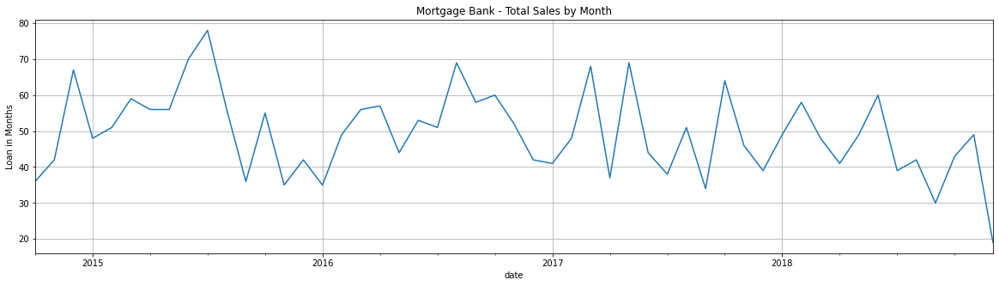

In [29]:
monthly_loan_num['date'] = pd.DatetimeIndex(data['Created Date'])
monthly_loan_num = monthly_loan_num.set_index('date')
monthly_loan_num_data=monthly_loan_num.resample('M').last().plot(title="Mortgage Bank - Total Sales by Month",
                                                                 legend=None,grid=True,figsize=(20,5))
plt.ylabel("Loan in Months")
plt.show()

Summer seems to be high sales seasons for the Mortgage bank. Numbers of loans closed per months varies between 20 & 80.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


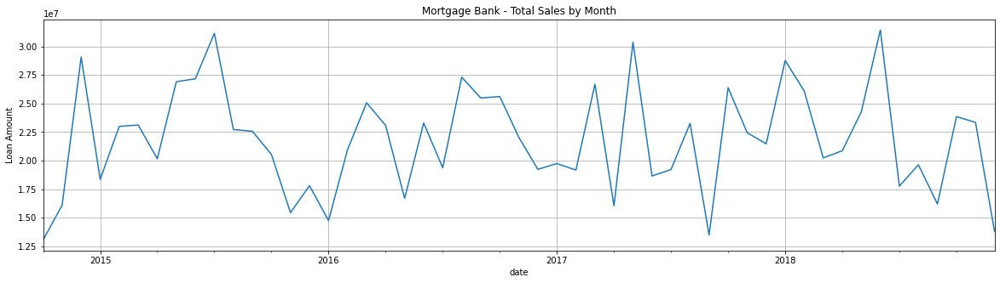

In [30]:
loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
monthly_loan_rev_data=loan_rev_data.resample('M').sum().plot(title="Mortgage Bank - Total Sales by Month",
                                                             legend=None,grid=True,figsize=(20,5))
plt.ylabel("Loan Amount")
plt.show()


Mortgage Bank Monthly Sales Since October 2014. Sales varies between 12M & 33M per months.

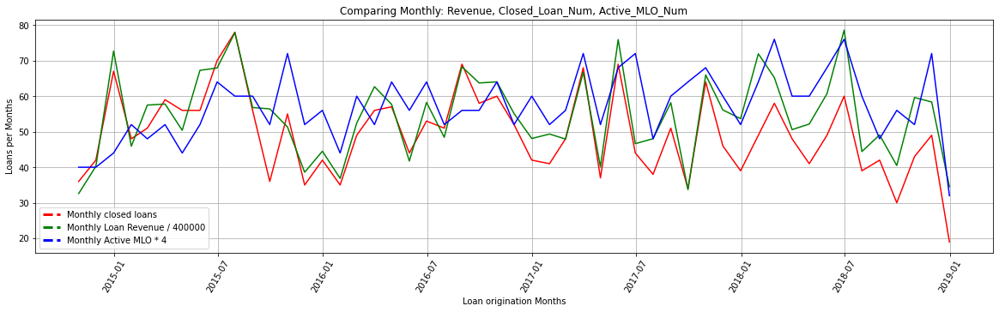

In [31]:
monthly_loan_num_data= monthly_loan_num.resample('M').last()
plt.figure(figsize=(20,5))
plt.xlabel('Loan origination Months')
plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.title('Mortgage Bank Monthly Loan numbers')


from matplotlib.lines import Line2D
colors = ['red', 'green', 'blue']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='--') for c in colors]
labels = ['Monthly closed loans', 'Monthly Loan Revenue / 400000', 'Monthly Active MLO * 4']
plt.plot(monthly_loan_num_data, color='red')
plt.plot(loan_rev_data.resample('M').sum() /400000, color='green')
plt.plot(monthly_mlo_num*4, color='blue')
plt.legend(lines, labels)
plt.title('Comparing Monthly: Revenue, Closed_Loan_Num, Active_MLO_Num')
plt.grid()

As we know that number of producer is essential component in any given business. MLO (Mortgage loan Originator) is core component in Mortgage business. Many MLO works indedendently and interect directly to clients, involve in marketting and grow their business. There could be many MLO in Mortgage Bank, but active MLO generate more reverue for the bank. As number of active MLO goes up, which will directly and positively impact numbers of loan closed per month, eventually mortgage revenue will go up. On the other hand, once number of active MLO goes down, mortgage revenue and number of loan per month goes down as well. By visualizing the graphs, we can see that monthly data of closed loan numbers , monthly revenue and active MLO numbers ber months, all moving at the same direction.

Let’s find out interest rate effect on Monthly Closed Loans and Monthly Revenue.

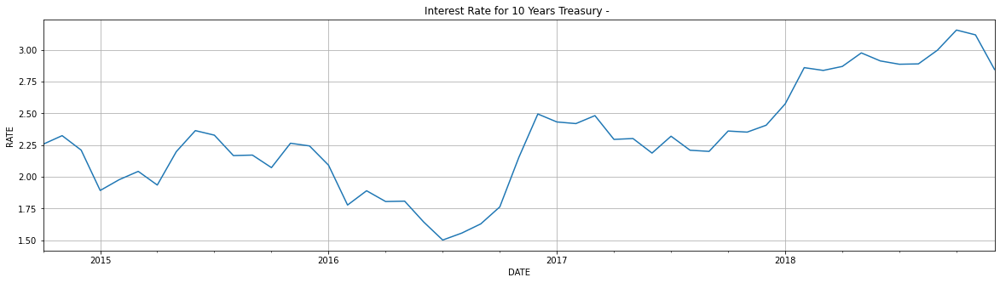

In [32]:
US10Y.index = pd.to_datetime(US10Y.index)
monthly_rate_data=US10Y.resample('M').mean().plot(title="Interest Rate for 10 Years Treasury - ",figsize=(20,5)
                                                  ,legend=None,grid=True)
plt.ylabel('RATE')
plt.show()

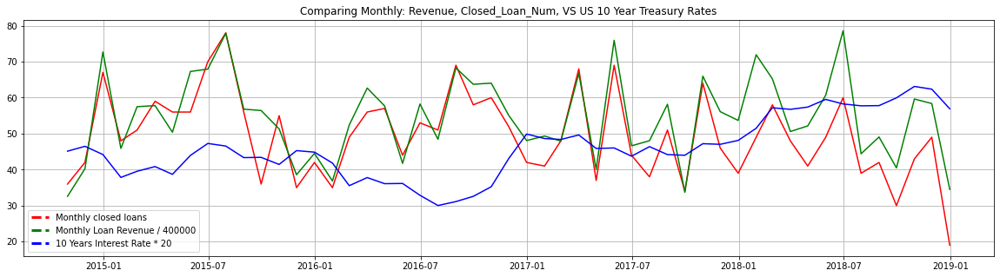

In [33]:
monthly_rate_data=US10Y.resample('M').mean()
from matplotlib.lines import Line2D
plt.figure(figsize=(20,5))
colors = ['red', 'green', 'blue']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='--') for c in colors]
labels = ['Monthly closed loans', 'Monthly Loan Revenue / 400000', '10 Years Interest Rate * 20']

plt.plot(monthly_loan_num_data, color='red')
plt.plot(loan_rev_data.resample('M').sum()/400000, color='green')
plt.plot(monthly_rate_data*20, color='blue')
plt.legend(lines, labels)
plt.title('Comparing Monthly: Revenue, Closed_Loan_Num, VS US 10 Year Treasury Rates')
plt.grid()

We can see the strong positive correlation between Monthly Closed Loans and Monthly Revenue. This graph also suggest that, as interest rates goes down, banks monthly revenue and numbers of loans increases, and when the Rates goes up, both Monthly Closed Loans and Monthly Revenue for the Mortgage bank decline. Pearson correlation coefficient between Monthly Interest & Monthly loans Closed Data is -0.334, which clearly proves that Monthly Interest Rates & Monthly loans Closed Data is negatively correlated.

In [34]:
def pearson_r(x, y):
    """Compute Pearson correlation coefficient between two arrays."""
    # Compute correlation matrix: corr_mat
    corr_mat = scipy.stats.pearsonr()

    # Return entry [0,1]
    return corr_mat[0, 1]

In [35]:
%matplotlib inline 

import numpy as np
import pandas as pd
import scipy
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

fico = data['Qualification FICO']
loan_amount=data['Loan Amount']
cltv_data = data['CLTV']
scipy.stats.pearsonr(cltv_data, fico)
r_loan_amount_fico = scipy.stats.pearsonr(loan_amount, fico)
# Print the result
print('Pearson correlation coefficient between FICO and Loan_Amount: ', r_loan_amount_fico)


Pearson correlation coefficient between FICO and Loan_Amount:  (0.007679913675807382, 0.7010628450632292)


In [36]:
r_cltv_data_fico = scipy.stats.pearsonr(cltv_data, fico)
print('Pearson correlation coefficient between FICO and CLTV: ', r_cltv_data_fico)

Pearson correlation coefficient between FICO and CLTV:  (-0.03706042959216813, 0.06386772845822382)


In [37]:
r_loan_amount_cltv_data = scipy.stats.pearsonr(loan_amount, cltv_data)
print('Pearson correlation coefficient between Loan Amount and CLTV: ', r_loan_amount_cltv_data)

Pearson correlation coefficient between Loan Amount and CLTV:  (-0.0066962503804456975, 0.7378394696407702)


In [38]:
monthly_loan_num=np.array(monthly_loan_num_data,dtype=np.float)
monthly_loan_num=monthly_loan_num.flatten()
monthly_loan_rev=np.array(loan_rev_data.resample('M').sum(),dtype=np.float)
monthly_loan_rev=monthly_loan_rev.flatten()

In [39]:
r_monthly_loan_num_data_monthly_loan_rev = scipy.stats.pearsonr(monthly_loan_num,monthly_loan_rev)
print('Pearson correlation coefficient between Loan number and Loan Revenue: ', r_monthly_loan_num_data_monthly_loan_rev)

Pearson correlation coefficient between Loan number and Loan Revenue:  (0.8447203695695618, 6.63988048351778e-15)


Acquire 1000 pairs bootstrap replicates of the Pearson correlation coefficient using the draw_bs_pairs() function you wrote in the previous exercise for CLTV data VS Qualification FICO Data and Monthly Loan_num_data VS. Monthly_loan_rev. Compute the 95% confidence interval for both using your bootstrap replicates. -We have created a NumPy array of percentiles to compute. These are the 2.5th, and 97.5th. By creating a list and convert the list to a NumPy array using np.array(). For example, np.array([2.5, 97.5]) would create an array consisting of the 2.5th and 97.5th percentiles.

In [40]:
pearson_r0=scipy.stats.pearsonr(cltv_data, fico)
pearson_r1=scipy.stats.pearsonr(loan_amount, fico)
# Print results
print('CLTV data VS Qualification FICO Data       :', pearson_r0)

CLTV data VS Qualification FICO Data       : (-0.03706042959216813, 0.06386772845822382)


In [41]:
print('Monthly Loan_Amount VS. FICO Data          :', pearson_r1)

Monthly Loan_Amount VS. FICO Data          : (0.007679913675807382, 0.7010628450632292)


# Random Walk

Are Interest Rates or Monthly Loan Returns Prices a Random Walk?

Most returns prices follow a random walk (perhaps with a drift). We will look at a time series of Monthly Sales Revenue, and run the 'Augmented Dickey-Fuller Test' from the statsmodels library to show that it does indeed follow a random walk. With the ADF test, the "null hypothesis" (the hypothesis that we either reject or fail to reject) is that the series follows a random walk. Therefore, a low p-value (say less than 5%) means we can reject the null hypothesis that the series is a random walk. Print out just the p-value of the test (adfuller_loan_rev_data[0] is the test statistic, and adfuller_loan_rev_data[1] is the p-value). Print out the entire output, which includes the test statistic, the p-values, and the critical values for tests with 1%, 10%, and 5% levels.

In [42]:
# Import the adfuller module from statsmodels
from statsmodels.tsa.stattools import adfuller
loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
monthly_loan_rev_data= loan_rev_data.resample('M').sum()
monthly_loan_rev_data[:5]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,Loan Amount
date,
2014-10-31,13039283.0
2014-11-30,16097733.0
2014-12-31,29077334.0
2015-01-31,18361520.0
2015-02-28,22995652.0


In [43]:
# Run the ADF test on the monthly_loan_rev_data series and print out the results
adfuller_loan_rev_data = adfuller(monthly_loan_rev_data['Loan Amount'], autolag='AIC')
print(adfuller_loan_rev_data)

(-4.499677156266475, 0.00019690419763896872, 10, 40, {'1%': -3.6055648906249997, '5%': -2.937069375, '10%': -2.606985625}, 1307.2851378617408)


In [44]:
# Just print out the p-value
print('The p-value of the test on loan_rev is: ' + str(adfuller_loan_rev_data[1]))


The p-value of the test on loan_rev is: 0.00019690419763896872


In [45]:
print('Print in different format')
print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_loan_rev_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_loan_rev_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Print in different format
Results of Dickey-Fuller Test:
Test Statistic                 -4.499677
p-value                         0.000197
#Lags Used                     10.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64


According to this test, p-value is very low (lower than 0.05). We reject the hypothesis that monthly_loan_rev_data follow a random walk.

In [46]:
loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
monthly_loan_rev_data= loan_rev_data.resample('M').sum()
monthly_loan_rev_data[:5]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Loan Amount
date,
2014-10-31,13039283.0
2014-11-30,16097733.0
2014-12-31,29077334.0
2015-01-31,18361520.0
2015-02-28,22995652.0


In [47]:
# Run the ADF test on the monthly_loan_rev_data series and print out the results
adfuller_loan_rev_data = adfuller(monthly_loan_rev_data['Loan Amount'], autolag='AIC')

print(adfuller_loan_rev_data)

(-4.499677156266475, 0.00019690419763896872, 10, 40, {'1%': -3.6055648906249997, '5%': -2.937069375, '10%': -2.606985625}, 1307.2851378617408)


In [48]:
# Just print out the p-value
print('The p-value of the test on loan_rev is: ' + str(adfuller_loan_rev_data[1]))

The p-value of the test on loan_rev is: 0.00019690419763896872


In [49]:
print('Print in different format')
print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_loan_rev_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_loan_rev_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Print in different format
Results of Dickey-Fuller Test:
Test Statistic                 -4.499677
p-value                         0.000197
#Lags Used                     10.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64


In [50]:
monthly_rate=US10Y.resample('M').mean()
monthly_rate_data=monthly_rate['RATE']
monthly_rate_data[:5]

DATE
2014-10-31    2.256429
2014-11-30    2.324000
2014-12-31    2.210000
2015-01-31    1.892273
2015-02-28    1.977500
Freq: M, Name: RATE, dtype: float64

In [51]:
# Run the ADF test on the monthly_rate_data series and print out the results
adfuller_monthly_rate_data = adfuller(monthly_rate_data)
print(adfuller_monthly_rate_data)

(-1.396544767435689, 0.5839314748568251, 1, 49, {'1%': -3.5714715250448363, '5%': -2.922629480573571, '10%': -2.5993358475635153}, -34.97121939430423)


In [52]:
# Just print out the p-value
print('The p-value of the test on monthly_rate_data is: ' + str(adfuller_monthly_rate_data[1]))

The p-value of the test on monthly_rate_data is: 0.5839314748568251


In [53]:
print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_monthly_rate_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_monthly_rate_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test:
Test Statistic                 -1.396545
p-value                         0.583931
#Lags Used                      1.000000
Number of Observations Used    49.000000
Critical Value (1%)            -3.571472
Critical Value (5%)            -2.922629
Critical Value (10%)           -2.599336
dtype: float64


# Are Interest Rates Autocorrelated?

When we look at daily changes in interest rates, the autocorrelation is close to zero. However, if we resample the data and look at annual changes, the autocorrelation is negative. This implies that while short term changes in interest rates may be uncorrelated, long term changes in interest rates are negatively autocorrelated. A daily move up or down in interest rates is unlikely to tell us anything about interest rates tomorrow, but a move in interest rates over a year can tell us something about where interest rates are going over the next year. And this makes some economic sense: over long horizons, when interest rates go up, the economy tends to slow down, which consequently causes interest rates to fall, and vice versa.

One of the really cool things that pandas allows us to do is resample the data. If we want to look at the data by monthly and anually. We can easily resample and sum it up. I’m using ‘M’ as the period for resampling which means the data should be resampled on a month boundary and 'A' for annual data'. Finally find the The autocorrelation of annual interest rate changes'''

In [54]:
US10Y['change_rates'] = US10Y.diff()
US10Y['change_rates'] = US10Y['change_rates'].dropna()
US10Y.describe()

,RATE,change_rates
count,1098.000000,1097.000000
mean,2.302286,0.000510
std,0.423337,0.041906
min,1.370000,-0.170000
25%,2.030000,-0.030000
50%,2.270000,0.000000
75%,2.507500,0.030000
max,3.240000,0.190000


In [55]:
# Compute and print the autocorrelation of daily changes
autocorrelation_daily = US10Y['change_rates'].autocorr()
print("The autocorrelation of daily interest rate changes is %4.2f" %(autocorrelation_daily))

The autocorrelation of daily interest rate changes is -0.06


In [56]:
US10Y.index = pd.to_datetime(US10Y.index)
monthly_rate_data = US10Y['RATE'].resample(rule='M').last()
#annual_data = annual_data.dropna()
# Repeat above for annual data
monthly_rate_data['diff_rates'] = monthly_rate_data.diff()
monthly_rate_data['diff_rates'] = monthly_rate_data['diff_rates'].dropna()
monthly_rate_data['diff_rates'][:5]

DATE
2014-11-30   -0.17
2014-12-31   -0.01
2015-01-31   -0.49
2015-02-28    0.32
2015-03-31   -0.06
Freq: M, Name: RATE, dtype: float64

In [57]:
autocorrelation_monthly = monthly_rate_data['diff_rates'].autocorr()
print("The autocorrelation of monthly interest rate changes is %4.2f" %(autocorrelation_monthly))

The autocorrelation of monthly interest rate changes is -0.02


In [58]:
US10Y.index = pd.to_datetime(US10Y.index)
annual_rate_data = US10Y['RATE'].resample(rule='A').last()
# Repeat above for annual data
annual_rate_data['diff_rates'] = annual_rate_data.diff()
annual_rate_data['diff_rates'] = annual_rate_data['diff_rates'].dropna()
annual_rate_data['diff_rates']

DATE
2015-12-31    0.10
2016-12-31    0.18
2017-12-31   -0.05
2018-12-31    0.37
Freq: A-DEC, Name: RATE, dtype: float64

In [59]:
autocorrelation_annual = annual_rate_data['diff_rates'].autocorr()
print("The autocorrelation of annual interest rate changes is %4.2f" %(autocorrelation_annual))

The autocorrelation of annual interest rate changes is -0.97


Daily and monthly autocorrelation is small but the annual autocorrelation is large and negative

Visual exploration is the most effective way to extract information between variables.

We can plot a barplot of the frequency distribution of a categorical feature using the seaborn package, which shows the frequency distribution of the mortgage dataset column

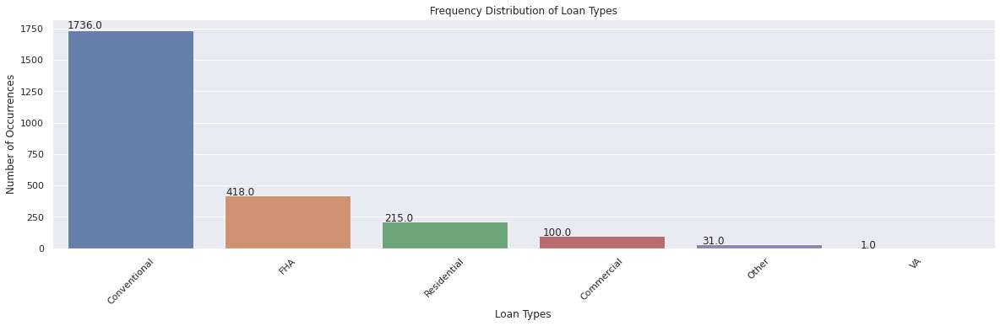

In [60]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
loan_type_count = data['Loan Type'].value_counts()
sns.set(style="darkgrid")
ax=sns.barplot(x=loan_type_count.index,y= loan_type_count.values, alpha=0.9)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.title('Frequency Distribution of Loan Types')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Loan Types', fontsize=12)
plt.xticks(rotation=45)
plt.show()

Conventional loan type is top market for the Bank, secound is FHA Loan Type

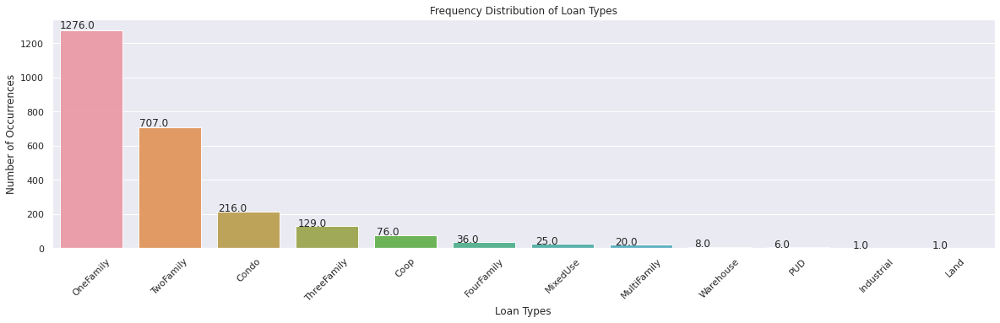

In [61]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
unit_type_count = data['Unit Type'].value_counts()
sns.set(style="darkgrid")
plt.figure(figsize=(20,5))
ax=sns.barplot(x=unit_type_count.index, y=unit_type_count.values, alpha=0.9)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.title('Frequency Distribution of Loan Types')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Loan Types', fontsize=12)
plt.xticks(rotation=45)
plt.show()

One Family, Two Family and Condos are the top unit types for the Bank

# Data Collection

Since we are only interested in the event log data we will only be using one of the tables. This table contains data about every mortgage application. Every action performed by the system or by a user on a mortgage application is logged, and the status before and after that specific action is logged. For our analysis we are mainly interested in the date and time at which each of the mortgage applications have entered the system. Besides Mortgage Application DataSet, we have joined two separate (10 Years US Treasury Rate, Home Supply Index) with our existing Mortgage Application DataSet to enhance predictive power of our model.

# Encoding Categorical Data

There are different techniques to encode the categorical features to numeric quantities.

The techniques are as following:
- Replacing values
- Encoding labels
- One-Hot encoding
- Binary encoding
- Backward difference encoding
- Miscellaneous features
- Replace Values

Let's start with the most basic method, which is just replacing the categories with the desired numbers. This can be achieved with the help of the replace() function in pandas. The idea is that you have the liberty to choose whatever numbers we want to assign to the categories according to the business use case.

It's a good practice to typecast categorical features to a category dtype because they make the operations on such columns much faster than the object dtype. You can do the typecasting by using .astype() method on your columns like shown below:

In [62]:
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', index_col='Created Date', header=0, encoding='cp1252')
data_lc = data.copy()
data_lc['City'] = data_lc['City'].astype('category')
data_lc['Zip'] = data_lc['Zip'].astype('category')
data_lc['Loan Type'] = data_lc['Loan Type'].astype('category')
data_lc['Unit Type'] = data_lc['Unit Type'].astype('category')
data_lc['loan_purpose_code'] = data_lc['Loan Purpose'].astype('category')
data_lc.dtypes

First Name                  object
Last Name                   object
City                      category
State                       object
Zip                       category
Loan Amount                float64
Estimated Value              int64
Loan Purpose                object
Qualification FICO           int64
Is Primary Wage Earner        bool
Income Type                 object
Asset Docs                  object
Occupancy                   object
Unit Type                 category
Loan Type                 category
Lender Name                 object
Time                        object
Fix                           bool
ARM                           bool
CLTV                       float64
Loan Number                 object
Loan Officer Name           object
LoanInMonth                  int64
loan_purpose_code         category
dtype: object

In [63]:
data_lc['lo_code'] = data_lc['Loan Officer Name'].astype('category')
lo_code =data_lc['lo_code']
data_lc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   First Name              2501 non-null   object  
 1   Last Name               2501 non-null   object  
 2   City                    2501 non-null   category
 3   State                   2501 non-null   object  
 4   Zip                     2501 non-null   category
 5   Loan Amount             2501 non-null   float64 
 6   Estimated Value         2501 non-null   int64   
 7   Loan Purpose            2501 non-null   object  
 8   Qualification FICO      2501 non-null   int64   
 9   Is Primary Wage Earner  2501 non-null   bool    
 10  Income Type             2501 non-null   object  
 11  Asset Docs              2501 non-null   object  
 12  Occupancy               1846 non-null   object  
 13  Unit Type               2501 non-null   category
 14  Loan Type     

# Label Encoding

We can achieve the label encoding using scikit-learn's LabelEncoder:

In [64]:
from sklearn.preprocessing import LabelEncoder
lb_make = LabelEncoder()
data_lc['loan_purpose_code'] = lb_make.fit_transform(data_lc['Loan Purpose'])
data_lc['loan_type_code'] = lb_make.fit_transform(data_lc['Loan Type'])
data_lc['unit_type_code'] = lb_make.fit_transform(data_lc['Unit Type'])
data_lc.head() #Results in appending a new column to df

,First Name,Last Name,City,State,Zip,Loan Amount,Estimated Value,Loan Purpose,Qualification FICO,Is Primary Wage Earner,...,Fix,ARM,CLTV,Loan Number,Loan Officer Name,LoanInMonth,loan_purpose_code,lo_code,loan_type_code,unit_type_code
Created Date,,,,,,,,,,,,,,,,,,,,,
10/14/2014,J58,K37,Edgewater,NJ,7020,506250.0,675000,Purchase,745,False,...,True,False,90.00,110300199JA,73ch126 61g45d3s,1,4,73ch126 61g45d3s,4,10
10/14/2014,Y4 H58,622,EAST BRUNSWICK,NJ,8816,206250.0,275000,Purchase,768,False,...,True,False,80.00,110300299JA,73ch126 61g45d3s,2,4,73ch126 61g45d3s,4,0
10/14/2014,Y3 618,CH28,WOODSIDE,NY,11377,648700.0,998000,Cash-Out Refi,740,True,...,True,False,45.82,11030039798A,63s1 63,3,0,63s1 63,4,10
10/14/2014,74h1771d,R45f2,Jackson Heights,NY,11370,412750.0,635000,Cash-Out Refi,801,False,...,True,False,44.44,11030049998A,73ch126 61g45d3s,4,0,73ch126 61g45d3s,4,10
10/14/2014,st2v281r382,j1gg2r815th,Queens Village,NY,10461,522588.0,535000,Purchase,719,False,...,True,False,80.00,G11030059998A,7189r22t Bh1s38,5,4,7189r22t Bh1s38,2,10


In [65]:
data_lc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   First Name              2501 non-null   object  
 1   Last Name               2501 non-null   object  
 2   City                    2501 non-null   category
 3   State                   2501 non-null   object  
 4   Zip                     2501 non-null   category
 5   Loan Amount             2501 non-null   float64 
 6   Estimated Value         2501 non-null   int64   
 7   Loan Purpose            2501 non-null   object  
 8   Qualification FICO      2501 non-null   int64   
 9   Is Primary Wage Earner  2501 non-null   bool    
 10  Income Type             2501 non-null   object  
 11  Asset Docs              2501 non-null   object  
 12  Occupancy               1846 non-null   object  
 13  Unit Type               2501 non-null   category
 14  Loan Type     

Label Encoding Another approach is to encode categorical values with a technique called "label encoding", which allows you to convert each value in a column to a number. Numerical labels are always between 0 and n_categories-1.

We can do label encoding via attributes .cat.codes on your DataFrame's column.

In [66]:
data_lc['lo_code'] = data_lc['Loan Officer Name'].astype('category')
lo_code =data_lc['lo_code']
data_lc['city_code'] = data_lc['City'].cat.codes
data_lc['zip_code'] = data_lc['Zip'].cat.codes
lo_code = data_lc['lo_code'].cat.codes
lo_code[:5]

Created Date
10/14/2014    15
10/14/2014    15
10/14/2014     9
10/14/2014    15
10/14/2014    11
dtype: int8

# One-Hot encoding

The basic strategy is to convert each category value into a new column and assign a 1 or 0 (True/False) value to the column. This has the benefit of not weighting a value improperly.

In [67]:
data_lc = pd.get_dummies(data_lc, columns=['Fix'], prefix = ['Fix'])
data_lc['Fix_True']
data_lc['Fix_False']
data_lc['Fix_True'].head()

Created Date
10/14/2014    1
10/14/2014    1
10/14/2014    1
10/14/2014    1
10/14/2014    1
Name: Fix_True, dtype: uint8

In [68]:
data_lc['Fix_True'].value_counts()

1    2242
0     259
Name: Fix_True, dtype: int64

In [69]:
data_lc[['Unit Type', 'unit_type_code']].head()

,Unit Type,unit_type_code
Created Date,,
10/14/2014,TwoFamily,10
10/14/2014,Condo,0
10/14/2014,TwoFamily,10
10/14/2014,TwoFamily,10
10/14/2014,TwoFamily,10


In [70]:
data_lc['Unit Type'].value_counts()

OneFamily      1276
TwoFamily       707
Condo           216
ThreeFamily     129
Coop             76
FourFamily       36
MixedUse         25
MultiFamily      20
Warehouse         8
PUD               6
Industrial        1
Land              1
Name: Unit Type, dtype: int64

In [71]:
 data_lc['unit_type_code'].value_counts()

7     1276
10     707
0      216
9      129
1       76
2       36
5       25
6       20
11       8
8        6
4        1
3        1
Name: unit_type_code, dtype: int64

In [72]:
data_lc[['Loan Type', 'loan_type_code']].head()

,Loan Type,loan_type_code
Created Date,,
10/14/2014,Residential,4
10/14/2014,Residential,4
10/14/2014,Residential,4
10/14/2014,Residential,4
10/14/2014,FHA,2


In [73]:
data_lc['Loan Type'].value_counts()

Conventional    1736
FHA              418
Residential      215
Commercial       100
Other             31
VA                 1
Name: Loan Type, dtype: int64

In [74]:
data_lc['unit_type_code'].value_counts()

7     1276
10     707
0      216
9      129
1       76
2       36
5       25
6       20
11       8
8        6
4        1
3        1
Name: unit_type_code, dtype: int64

In [75]:
data_lc[['Loan Purpose', 'loan_purpose_code']].head()

,Loan Purpose,loan_purpose_code
Created Date,,
10/14/2014,Purchase,4
10/14/2014,Purchase,4
10/14/2014,Cash-Out Refi,0
10/14/2014,Cash-Out Refi,0
10/14/2014,Purchase,4


In [76]:
data_lc['loan_purpose_code'].value_counts()

4    1707
0     475
2     310
5       5
3       2
6       1
1       1
Name: loan_purpose_code, dtype: int64

Forward Fill Missing Data

In [77]:
#Categorical value 'loan_purpose_code' has been update based on frequency of the value_counts
data_lc=data_lc.fillna(method='ffill')
total_missing_data_lc=data_lc.isnull().sum()
US10Y= US10Y.fillna(method='ffill')
data_lc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   First Name              2501 non-null   object  
 1   Last Name               2501 non-null   object  
 2   City                    2501 non-null   category
 3   State                   2501 non-null   object  
 4   Zip                     2501 non-null   category
 5   Loan Amount             2501 non-null   float64 
 6   Estimated Value         2501 non-null   int64   
 7   Loan Purpose            2501 non-null   object  
 8   Qualification FICO      2501 non-null   int64   
 9   Is Primary Wage Earner  2501 non-null   bool    
 10  Income Type             2501 non-null   object  
 11  Asset Docs              2501 non-null   object  
 12  Occupancy               1846 non-null   object  
 13  Unit Type               2501 non-null   category
 14  Loan Type     

For Machine Learning Modeling, we need to create new Data Frame

In [78]:
model_data1 = data_lc[['Loan Amount', 'city_code', 'zip_code', 
                       'loan_purpose_code', 'Qualification FICO', 'unit_type_code', 
                       'loan_type_code', 'Fix_True', 'CLTV', 'LoanInMonth']]
model_data1.columns

Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth'],
      dtype='object')

In [79]:
model_data1.tail()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth
Created Date,,,,,,,,,,
12/20/2018,870000.0,155,318,0,764,10,1,1,60.0,15
12/21/2018,633750.0,39,286,4,767,10,1,1,75.0,16
12/21/2018,861750.0,256,358,4,796,10,1,1,75.0,17
12/26/2018,1190000.0,583,337,4,778,10,0,1,70.0,18
12/27/2018,1190000.0,256,360,4,778,10,1,1,70.0,19


In [80]:
total_missing_mode_data1=model_data1.isnull().sum()
total_missing_mode_data1

Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
dtype: int64

In [81]:
model_data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Loan Amount         2501 non-null   float64
 1   city_code           2501 non-null   int16  
 2   zip_code            2501 non-null   int16  
 3   loan_purpose_code   2501 non-null   int64  
 4   Qualification FICO  2501 non-null   int64  
 5   unit_type_code      2501 non-null   int64  
 6   loan_type_code      2501 non-null   int64  
 7   Fix_True            2501 non-null   uint8  
 8   CLTV                2501 non-null   float64
 9   LoanInMonth         2501 non-null   int64  
dtypes: float64(2), int16(2), int64(5), uint8(1)
memory usage: 168.5+ KB


In [82]:
print('model_data1 Keys: \n',model_data1.keys())

model_data1 Keys: 
 Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth'],
      dtype='object')


In [83]:
print('model_data1 shape: ',model_data1.shape)

model_data1 shape:  (2501, 10)


In [84]:
model_data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Loan Amount         2501 non-null   float64
 1   city_code           2501 non-null   int16  
 2   zip_code            2501 non-null   int16  
 3   loan_purpose_code   2501 non-null   int64  
 4   Qualification FICO  2501 non-null   int64  
 5   unit_type_code      2501 non-null   int64  
 6   loan_type_code      2501 non-null   int64  
 7   Fix_True            2501 non-null   uint8  
 8   CLTV                2501 non-null   float64
 9   LoanInMonth         2501 non-null   int64  
dtypes: float64(2), int16(2), int64(5), uint8(1)
memory usage: 168.5+ KB


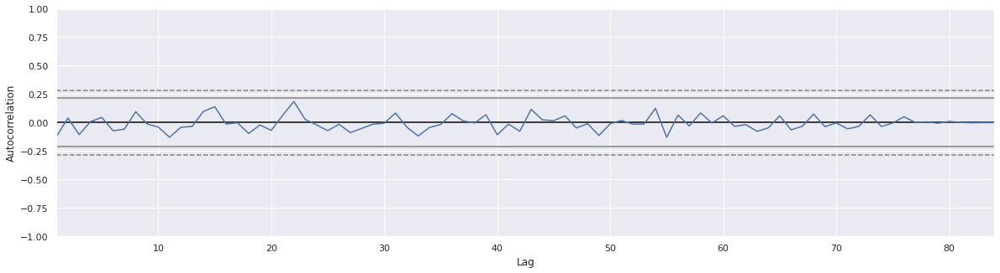

In [85]:
plt.figure(figsize=(20,5))
loan_amt=model_data1[['Loan Amount']]
pd.plotting.autocorrelation_plot(loan_amt[::30])
plt.grid()

# Joining DataFrame

Join two DataFrames model_data1 & US10Y save the results in model_data2

In [86]:
US10Y = pd.read_csv('../input/mortgage-bank-loan/US10Y.csv', header=0, index_col='DATE', encoding='cp1252')
#index_col='DATE'
US10Y.replace('.', -1, inplace=True)
US10Y= US10Y.replace(to_replace=[-1], value=[np.nan])
US10Y.tail()

,RATE
DATE,
12/21/2018,2.79
12/24/2018,2.74
12/25/2018,NaN
12/26/2018,2.81
12/27/2018,2.77


In [87]:
US10Y= US10Y.fillna(method='ffill')
US10Y= US10Y[['RATE']].astype('float64')
total_missing_rate=US10Y.isnull().sum()
total_missing_rate

RATE    0
dtype: int64

In [88]:
model_data2 = model_data1.join(US10Y)
total_missing=model_data2.isnull().sum()
model_data2= model_data2.fillna(method='ffill')
total_missing_model_data2=model_data2.isnull().sum()
total_missing_model_data2

Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
RATE                  0
dtype: int64

# Home Supply

US Home Supply directly impact Housing Market and Mortgage Market. We have collected the data from FRED Integrate Monthly housing supply index data and merging with current dataset

In [89]:
home_supply = pd.read_csv('../input/mortgage-bank-loan/MonHouseSupply.csv', header=0, index_col='DATE', encoding='cp1252')
home_supply.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 10/14/2014 to 12/1/2018
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Home    51 non-null     float64
dtypes: float64(1)
memory usage: 816.0+ bytes


In [90]:
total_missing_home_supply=home_supply.isnull().sum()
model_data = model_data2.join(home_supply)
total_missing=model_data.isnull().sum()
model_data= model_data.fillna(method='ffill')
total_missing_home_supply=model_data.isnull().sum()
total_missing_home_supply

Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
RATE                  0
Home                  0
dtype: int64

In [91]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


In [92]:
model_data3=model_data.copy()
model_data3.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


# DATA EXPLORATION

Since our dataset can be grouped per day to create meaningful visualizations. The dataset contains data from October 2014 until December 2018. In order to get a feel of the amount of mortgage applications per day and the distribution of the mortgage applications, different visualizations can be made using Python. Two graphs have been created, which can be found in Figure 1 and Figure 2. Both of these graphs only contain the amount of mortgage applications on the weekdays. As there are almost no applications coming in on the weekends they have been excluded from the graphs. As can be seen from the graphs, there seems to be a seasonal pattern on a monthly level, but from these graphs it is not very clear. It also seems like there are some outliers, so these data points will have to be investigated to see if they will have to be included in our model, as there can be multiple underlying reasons for outliers in our dataset. It also seems there is an increase in mortgage applications during the last few months of each year. The amount of applications per day during these months is higher compared to the other months. This can have multiple explanations so this will have to be accounted for in the model.

In [93]:
loan_amount_data = data[data['Loan Amount'].isin(St)]
loan_amount_data.shape

(0, 23)

In [94]:
ct_loan_amount=sum(ct_data['Loan Amount'])
fl_loan_amount=sum(fl_data['Loan Amount'])
ny_loan_amount=sum(ny_data['Loan Amount'])
nj_loan_amount=sum(nj_data['Loan Amount'])
pa_loan_amount=sum(pa_data['Loan Amount'])

loan_amount_per_state = [ct_loan_amount, fl_loan_amount, nj_loan_amount, ny_loan_amount, pa_loan_amount]

print('====================================================')
print('=========    Total Sales by State     ==============')
print(' ')
print('Total Sales in Cunnecticut   : $', ct_loan_amount)
print('Total Sales in Florida       : $', fl_loan_amount)
print('Total Sales in New York      : $', ny_loan_amount)
print('Total Sales in New Jersey    : $', nj_loan_amount)
print('Total Sales in Pennsylvania  : $', pa_loan_amount)
print(' ')
print('====================================================')
print(' ')

=========    Total Sales by State     ==============
 
Total Sales in Cunnecticut   : $ 3604641.0
Total Sales in Florida       : $ 3371495.0
Total Sales in New York      : $ 868836552.2799997
Total Sales in New Jersey    : $ 236456261.05999997
Total Sales in Pennsylvania  : $ 600920.0
 
 


In [95]:
loan_types=data['Loan Type'].unique()
group_loan_types=data.groupby(data['Loan Type']).size()
print('Unique Loan Types        : ', loan_types)

Unique Loan Types        :  ['Residential' 'FHA' 'Commercial' 'Conventional' 'Other' 'VA']


In [96]:
print(' ')
print('====================================================')

print('Number of loan per Types : ', group_loan_types)

print(' ')
print('====================================================')
print(' ')

 
Number of loan per Types :  Loan Type
Commercial       100
Conventional    1736
FHA              418
Other             31
Residential      215
VA                 1
dtype: int64
 
 


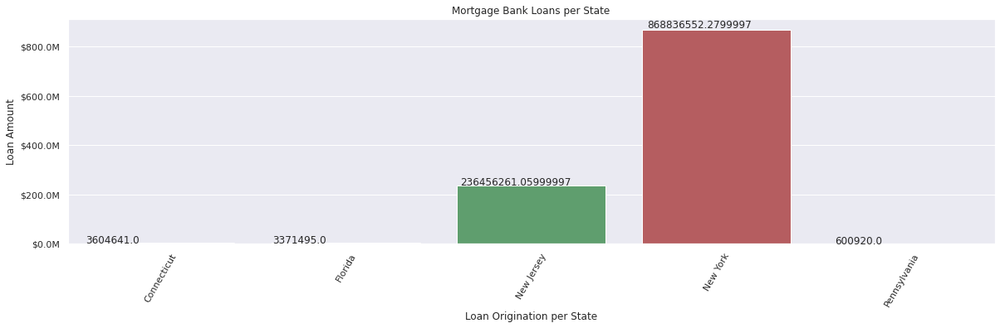

In [97]:
from matplotlib.ticker import FuncFormatter
x = np.arange(5)
money = [1.5e5, 2.5e6, 5.5e6, 1.0e7, 2.0e7, 3.0e7, 4.0e7, 5.0e7, 6.0e7]
def millions(x, pos):
    'The two args are the value and tick position'
    return '$%1.1fM' % (x * 1e-6)
formatter = FuncFormatter(millions)
fig, ax = plt.subplots(figsize=(20, 5))
ax.yaxis.set_major_formatter(formatter)
a=sns.barplot(x=St, y=loan_amount_per_state)
for p in a.patches:
    a.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.xticks(x, ('Connecticut', 'Florida', 'New Jersey', 'New York', 'Pennsylvania'))
plt.ylabel('Loan Amount')
plt.xlabel('Loan Origination per State')
plt.xticks(rotation=60)
plt.title('Mortgage Bank Loans per State')
plt.show()


Eventhough Bank is Licensed for business in NY, NJ, CT, PA and FL, their strong mortgage market is in NY & NI

In [98]:
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', header=0, encoding='cp1252')
data.quantile([0.05, 0.95])

,Zip,Loan Amount,Estimated Value,Qualification FICO,Is Primary Wage Earner,Fix,ARM,CLTV,LoanInMonth
0.05,7083.0,150000.0,205275.0,636.0,0.0,0.0,0.0,0.0,3.0
0.95,11756.0,840000.0,1400000.0,803.0,1.0,1.0,1.0,96.0,56.0


In [99]:
data['Loan Amount'].quantile([0.05, 0.95])

0.05    150000.0
0.95    840000.0
Name: Loan Amount, dtype: float64

In [100]:
data['Loan Amount'].quantile([0.1, 0.90])

0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64

In [101]:
St=['CT', 'FL', 'NJ', 'NY', 'PA']
print(St)

['CT', 'FL', 'NJ', 'NY', 'PA']


In [102]:
#DataFrame subsets by State
ct_data = data[data['State'].isin(['CT'])]
fl_data = data[data['State'].isin(['FL'])]
ny_data = data[data['State'].isin(['NY'])]
nj_data = data[data['State'].isin(['NJ'])]
pa_data = data[data['State'].isin(['PA'])]

In [103]:
#Selecting data per column
ct_lo_amount = ct_data.reindex(('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'unit_type_code', 'Loan Type'))
fl_lo_amount = fl_data.reindex(('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type'))
nj_lo_amount = nj_data.reindex(('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type'))
ny_lo_amount = ny_data.reindex(('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type'))
pa_lo_amount = pa_data.reindex(('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type'))

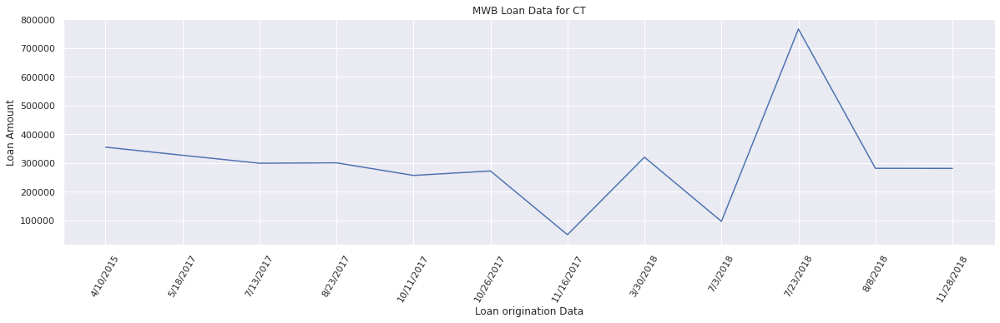

In [104]:
plt.figure(figsize=(20,5))
plt.xlabel('Loan origination Data')
plt.xticks(rotation=60)
plt.ylabel('Loan Amount')
plt.title('MWB Loan Data for CT')
plt.plot(ct_data['Created Date'], ct_data['Loan Amount'])
plt.show()

Here is the Loan amount Distribution for CT State

In [105]:
print('==============================')
print(' ')
#Unit Type Loan Data
total_unit_type = data.groupby(data['Unit Type']).size()
print('Loan originated in all States per unit types : \n', total_unit_type)

print('==============================')
print(' ')

 
Loan originated in all States per unit types : 
 Unit Type
Condo           216
Coop             76
FourFamily       36
Industrial        1
Land              1
MixedUse         25
MultiFamily      20
OneFamily      1276
PUD               6
ThreeFamily     129
TwoFamily       707
Warehouse         8
dtype: int64
 


In [106]:
#Unit Type Loan Data for CT
print('==============================')
print(' ')
ct_data_unit_type=ct_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Cunnecticut per unit types : \n', ct_data_unit_type)

print('==============================')
print(' ')

 
Loan originated in Cunnecticut per unit types : 
 Unit Type
OneFamily      9
ThreeFamily    3
Name: Loan Amount, dtype: int64
 


In [107]:
#Unit Type Loan Data for FL
print('==============================')
print(' ')
fl_data_unit_type=fl_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Florida per unit types : \n', fl_data_unit_type)
print('==============================')
print(' ')

 
Loan originated in Florida per unit types : 
 Unit Type
Condo         1
OneFamily    11
Name: Loan Amount, dtype: int64
 


In [108]:
#Unit Type Loan Data for NJ
print('==============================')
print(' ')
nj_data_unit_type=nj_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in New Jersey per unit types : \n', nj_data_unit_type)

print('==============================')
print(' ')

 
Loan originated in New Jersey per unit types : 
 Unit Type
Condo          140
FourFamily       2
OneFamily      448
PUD              1
ThreeFamily     10
TwoFamily       70
Name: Loan Amount, dtype: int64
 


In [109]:
#Unit Type Loan Data for NY
print('==============================')
print(' ')
ny_data_unit_type=ny_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in New York per unit types : \n', ny_data_unit_type)

print('==============================')
print(' ')

 
Loan originated in New York per unit types : 
 Unit Type
Condo           75
Coop            76
FourFamily      34
Industrial       1
Land             1
MixedUse        25
MultiFamily     20
OneFamily      805
PUD              5
ThreeFamily    116
TwoFamily      636
Warehouse        8
Name: Loan Amount, dtype: int64
 


In [110]:
#Unit Type Loan Data for PA
print('==============================')
print(' ')
pa_data_unit_type=pa_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Pennsylvania per unit types : \n', pa_data_unit_type)

print('==============================')
print(' ')

 
Loan originated in Pennsylvania per unit types : 
 Unit Type
OneFamily    2
TwoFamily    1
Name: Loan Amount, dtype: int64
 


In [111]:
#Unit Type Loan Data for CT
ct_data['Loan Amount'].groupby(data['Unit Type']).size()

Unit Type
OneFamily      9
ThreeFamily    3
Name: Loan Amount, dtype: int64

# Loan data based on Unit Types (One Fami, Two Family etc) per State

In [112]:
lo_data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', header=0, index_col = 'Loan Officer Name', encoding='cp1252')

# Create a separate dataframe with the columns ['', 'total', 'voters']: results
lo_df = lo_data[['Created Date', 'Loan Amount', 'Unit Type', 'Loan Type', 'City', 'Zip']]

# Print the output of results.head()
lo_df.head()

,Created Date,Loan Amount,Unit Type,Loan Type,City,Zip
Loan Officer Name,,,,,,
73ch126 61g45d3s,10/14/2014,506250.0,TwoFamily,Residential,Edgewater,7020
73ch126 61g45d3s,10/14/2014,206250.0,Condo,Residential,EAST BRUNSWICK,8816
63s1 63,10/14/2014,648700.0,TwoFamily,Residential,WOODSIDE,11377
73ch126 61g45d3s,10/14/2014,412750.0,TwoFamily,Residential,Jackson Heights,11370
7189r22t Bh1s38,10/14/2014,522588.0,TwoFamily,FHA,Queens Village,10461


In [113]:
lo_df.count()

Created Date    2501
Loan Amount     2501
Unit Type       2501
Loan Type       2501
City            2501
Zip             2501
dtype: int64

In [114]:
lo_df.describe()

,Loan Amount,Zip
count,2.501000e+03,2501.00000
mean,4.450999e+05,10465.72531
std,2.888040e+05,2864.01025
min,2.360000e+04,0.00000
25%,2.925000e+05,7830.00000
50%,4.000000e+05,11223.00000
75%,5.330000e+05,11412.00000
max,6.125000e+06,65488.00000


In [115]:
lo_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Loan Amount,2501.0,445099.907773,288803.958791,23600.0,292500.0,400000.0,533000.0,6125000.0
Zip,2501.0,10465.725310,2864.010250,0.0,7830.0,11223.0,11412.0,65488.0


In [116]:
print('=======================================================================')
print('**********************  Loan Statistics for Mortgage Bank ***********************')
print(' ')


from scipy.stats import scoreatpercentile
import numpy as np

q0 = scoreatpercentile(lo_df['Loan Amount'],10)
q1 = scoreatpercentile(lo_df['Loan Amount'],25)
q2 = scoreatpercentile(lo_df['Loan Amount'],55)
q3 = scoreatpercentile(lo_df['Loan Amount'],75)
q4 = scoreatpercentile(lo_df['Loan Amount'],90)


print('Average Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].mean())
print('Median Loan Amount is                :  $', '%.2f' %lo_df['Loan Amount'].median())
print(' ')
print('Standard deviation of Loan Amount is :  $', '%.2f' %lo_df['Loan Amount'].std())
print(' ')
print('Minimum Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].min())
print('Maximum Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].max())
print(' ')
print('Total of Loan Amount is              :  $', '%.2f' %lo_df['Loan Amount'].sum())
print(' ')
print('10% of Loan Amount is below          :  $', '%.2f' %q0)
print('25% of Loan Amount is below          :  $', '%.2f' %q1)
print('50% of Loan Amount is below          :  $', '%.2f' %q2)
print('75% of Loan Amount is below          :  $', '%.2f' %q3)
print('90% of Loan Amount is below          :  $', '%.2f' %q4)
print(' ')
print('==========================================================================')


**********************  Loan Statistics for Mortgage Bank ***********************
 
Average Loan Amount is               :  $ 445099.91
Median Loan Amount is                :  $ 400000.00
 
Standard deviation of Loan Amount is :  $ 288803.96
 
Minimum Loan Amount is               :  $ 23600.00
Maximum Loan Amount is               :  $ 6125000.00
 
Total of Loan Amount is              :  $ 1113194869.34
 
10% of Loan Amount is below          :  $ 200000.00
25% of Loan Amount is below          :  $ 292500.00
50% of Loan Amount is below          :  $ 417000.00
75% of Loan Amount is below          :  $ 533000.00
90% of Loan Amount is below          :  $ 696500.00
 


# Loan Statistics for the Bank

In [117]:
lo_df.describe()

,Loan Amount,Zip
count,2.501000e+03,2501.00000
mean,4.450999e+05,10465.72531
std,2.888040e+05,2864.01025
min,2.360000e+04,0.00000
25%,2.925000e+05,7830.00000
50%,4.000000e+05,11223.00000
75%,5.330000e+05,11412.00000
max,6.125000e+06,65488.00000


In [118]:
fico = lo_data[['Qualification FICO']]
fico.describe()

,Qualification FICO
count,2501.000000
mean,727.806477
std,56.610841
min,0.000000
25%,693.000000
50%,732.000000
75%,771.000000
max,825.000000


In [119]:
print('=======================================================================')
print('**************** Qualification FICO  Statistics for Mortgage Bank ***************')
print(' ')
from scipy.stats import scoreatpercentile
import numpy as np

fico_q7 = scoreatpercentile(lo_data['Qualification FICO'],5)
fico_q0 = scoreatpercentile(lo_data['Qualification FICO'],10)
fico_q1 = scoreatpercentile(lo_data['Qualification FICO'],25)
fico_q5 = scoreatpercentile(lo_data['Qualification FICO'],40)
fico_q2 = scoreatpercentile(lo_data['Qualification FICO'],50)
fico_q6 = scoreatpercentile(lo_data['Qualification FICO'],65)
fico_q3 = scoreatpercentile(lo_data['Qualification FICO'],75)
fico_q4 = scoreatpercentile(lo_data['Qualification FICO'],90)
fico_q8 = scoreatpercentile(lo_data['Qualification FICO'],95)


print('Average FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].mean())
print('Median FICO is                   :  $', '%.2f' %lo_data['Qualification FICO'].median())
print('Standard deviation is            :  $', '%.2f' %lo_data['Qualification FICO'].std())
print('Minimum FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].min())
print('Maximum FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].max())
print(' ')
print('5% of FICO is below              :  $', '%.2f' %fico_q7)
print('10% of FICO is below             :  $', '%.2f' %fico_q0)
print('25% of FICO is below             :  $', '%.2f' %fico_q1)
print('40% of FICO is below             :  $', '%.2f' %fico_q5)
print('50% of FICO is below             :  $', '%.2f' %fico_q2)
print('65% of FICO is below             :  $', '%.2f' %fico_q6)
print('75% of FICO is below             :  $', '%.2f' %fico_q3)
print('90% of FICO is below             :  $', '%.2f' %fico_q4)
print('95% of FICO is below             :  $', '%.2f' %fico_q8)

print(' ')
print('==========================================================================')


**************** Qualification FICO  Statistics for Mortgage Bank ***************
 
Average FICO is                  :  $ 727.81
Median FICO is                   :  $ 732.00
Standard deviation is            :  $ 56.61
Minimum FICO is                  :  $ 0.00
Maximum FICO is                  :  $ 825.00
 
5% of FICO is below              :  $ 636.00
10% of FICO is below             :  $ 653.00
25% of FICO is below             :  $ 693.00
40% of FICO is below             :  $ 716.00
50% of FICO is below             :  $ 732.00
65% of FICO is below             :  $ 755.00
75% of FICO is below             :  $ 771.00
90% of FICO is below             :  $ 795.00
95% of FICO is below             :  $ 803.00
 


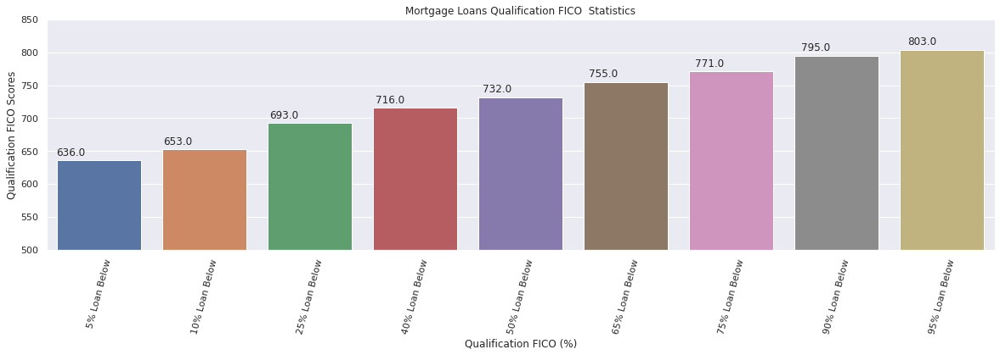

In [120]:
fico_score = [fico_q7, fico_q0, fico_q1, fico_q5, fico_q2, fico_q6, fico_q3, fico_q4, fico_q8]
fico_pct=['5% Loan Below', '10% Loan Below', '25% Loan Below', '40% Loan Below', '50% Loan Below', '65% Loan Below', '75% Loan Below','90% Loan Below', '95% Loan Below']
plt.figure(figsize=(20,5))
plt.xticks(rotation=75)
plt.ylim((500,850))
a=sns.barplot(x=fico_pct, y=fico_score)
for p in a.patches:
    a.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.ylabel('Qualification FICO Scores')
plt.xlabel('Qualification FICO (%)')
plt.title('Mortgage Loans Qualification FICO  Statistics')
plt.show()

# Mortgage Bank FICO Score Statistics

In [121]:
print('==============================================================================')
print('**************** Mortgage Loan Ofiicer'' Sales Volume per Loan Type ***************')
print(' ')


###########################
lo_loan = data[['Loan Officer Name', 'Loan Type', 'Created Date', 'Loan Amount']]

#We can use groupby to organize the data by category and name.
lo_loan_group = lo_loan.groupby(['Loan Officer Name', 'Loan Type']).sum()

lo_loan_group_count = lo_loan.groupby(['Loan Officer Name', 'Loan Type']).count()

lo_loan_group


**************** Mortgage Loan Ofiicer Sales Volume per Loan Type ***************
 


Loan Amount
Loan Officer Name Loan Type                
17281 Kh18        Commercial      990000.00
                  Conventional  17532050.00
                  FHA            7120707.00
                  Residential    4305900.00
185j t2st t2st2r  Conventional    963500.00
...                                     ...
V3v318 D2g531     Commercial      135920.00
                  Conventional  12104832.03
                  FHA           10876691.87
                  Residential    2131525.00
W48s24k 622       Conventional    901000.00

[121 rows x 1 columns]

In [122]:
lo_loan_group_count

Created Date  Loan Amount
Loan Officer Name Loan Type                              
17281 Kh18        Commercial               3            3
                  Conventional            44           44
                  FHA                     14           14
                  Residential              9            9
185j t2st t2st2r  Conventional             2            2
...                                      ...          ...
V3v318 D2g531     Commercial               1            1
                  Conventional            46           46
                  FHA                     38           38
                  Residential              6            6
W48s24k 622       Conventional             2            2

[121 rows x 2 columns]

In [123]:
lo_loan['Loan Type'].describe()

count             2501
unique               6
top       Conventional
freq              1736
Name: Loan Type, dtype: object

In [124]:
'''The category representation looks good but we need to break it apart
to graph it as a stacked bar graph. unstack can do this for us.'''
lo_loan_group.unstack().head()

Loan Amount                                                \
Loan Type          Commercial Conventional        FHA     Other Residential   
Loan Officer Name                                                             
17281 Kh18           990000.0  17532050.00  7120707.0       NaN   4305900.0   
185j t2st t2st2r          NaN    963500.00        NaN       NaN         NaN   
18g261 B5c3ch        640000.0    975000.00        NaN       NaN         NaN   
1b5 Ch4wdh5ry       1190000.0  12606550.75  4841882.1  559375.0         NaN   
1s3f Kh18                 NaN   1461750.00        NaN       NaN         NaN   

                       
Loan Type          VA  
Loan Officer Name      
17281 Kh18        NaN  
185j t2st t2st2r  NaN  
18g261 B5c3ch     NaN  
1b5 Ch4wdh5ry     NaN  
1s3f Kh18         NaN

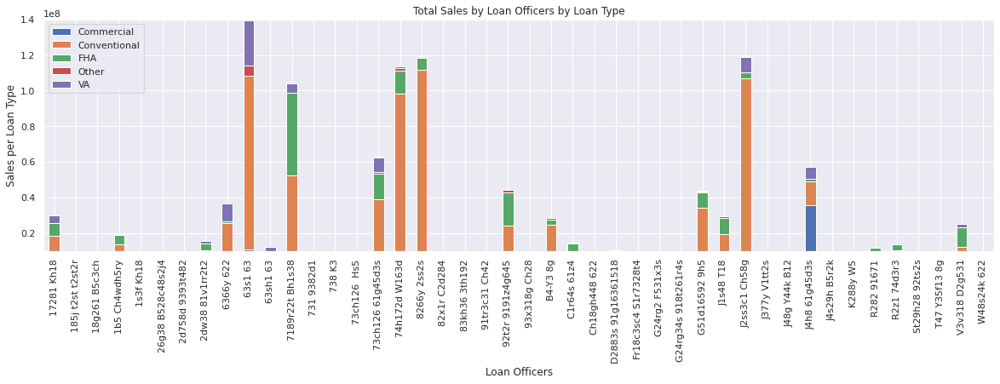

In [125]:
lo_loan_group_plot = lo_loan_group.unstack().plot(kind='bar',stacked=True,
                                                  title="Total Sales by Loan Officers by Loan Type",figsize=(20,5))
lo_loan_group_plot.set_xlabel("Loan Officers")
lo_loan_group_plot.set_ylabel("Sales per Loan Type")
lo_loan_group_plot.legend(["Commercial","Conventional","FHA","Other","VA"], loc=2,ncol=1)
plt.ylim(10000000, 140000000)
plt.show()

In [126]:
print('==============================================================================')
print('**************** MWB Loan Ofiicers Sales Volume per Unit Type ***************')
print(' ')
lo_unit = data[['Loan Officer Name', 'Unit Type', 'Created Date', 'Loan Amount']]
lo_unit_group = lo_unit.groupby(['Loan Officer Name', 'Unit Type']).sum()
lo_unit_group_count = lo_unit.groupby(['Loan Officer Name', 'Unit Type']).count()
lo_unit_group

**************** MWB Loan Ofiicers Sales Volume per Unit Type ***************
 


Loan Amount
Loan Officer Name Unit Type              
17281 Kh18        Condo        1322400.00
                  Coop          605600.00
                  FourFamily   1118000.00
                  OneFamily    6875515.25
                  PUD           390000.00
...                                   ...
V3v318 D2g531     Condo        1876590.03
                  FourFamily    880800.00
                  OneFamily   18247695.81
                  TwoFamily    4243883.06
W48s24k 622       Condo         901000.00

[189 rows x 1 columns]

In [127]:
lo_unit_group_count

Created Date  Loan Amount
Loan Officer Name Unit Type                            
17281 Kh18        Condo                  5            5
                  Coop                   5            5
                  FourFamily             2            2
                  OneFamily             15           15
                  PUD                    1            1
...                                    ...          ...
V3v318 D2g531     Condo                 10           10
                  FourFamily             1            1
                  OneFamily             65           65
                  TwoFamily             15           15
W48s24k 622       Condo                  2            2

[189 rows x 2 columns]

In [128]:
lo_unit['Unit Type'].describe()

count          2501
unique           12
top       OneFamily
freq           1276
Name: Unit Type, dtype: object

In [129]:
lo_unit_group.unstack().head()

Loan Amount                                                \
Unit Type               Condo      Coop FourFamily Industrial Land MixedUse   
Loan Officer Name                                                             
17281 Kh18          1322400.0  605600.0  1118000.0        NaN  NaN      NaN   
185j t2st t2st2r          NaN       NaN   682500.0        NaN  NaN      NaN   
18g261 B5c3ch             NaN       NaN        NaN        NaN  NaN      NaN   
1b5 Ch4wdh5ry        159375.0  172000.0        NaN        NaN  NaN      NaN   
1s3f Kh18                 NaN       NaN        NaN        NaN  NaN      NaN   

                                                                               \
Unit Type         MultiFamily    OneFamily       PUD ThreeFamily    TwoFamily   
Loan Officer Name                                                               
17281 Kh18                NaN   6875515.25  390000.0   1298750.0  18338391.75   
185j t2st t2st2r          NaN          NaN       NaN    281000.0          NaN   
18g261 B5c3ch             NaN   1160000.00       NaN    455000.0          NaN   
1b5 Ch4wdh5ry             NaN  12156944.10       NaN    695970.0   6013518.75   
1s3f Kh18                 NaN          NaN       NaN         NaN   1461750.00   

                             
Unit Type         Warehouse  
Loan Officer Name            
17281 Kh18              NaN  
185j t2st t2st2r        NaN  
18g261 B5c3ch           NaN  
1b5 Ch4wdh5ry           NaN  
1s3f Kh18               NaN

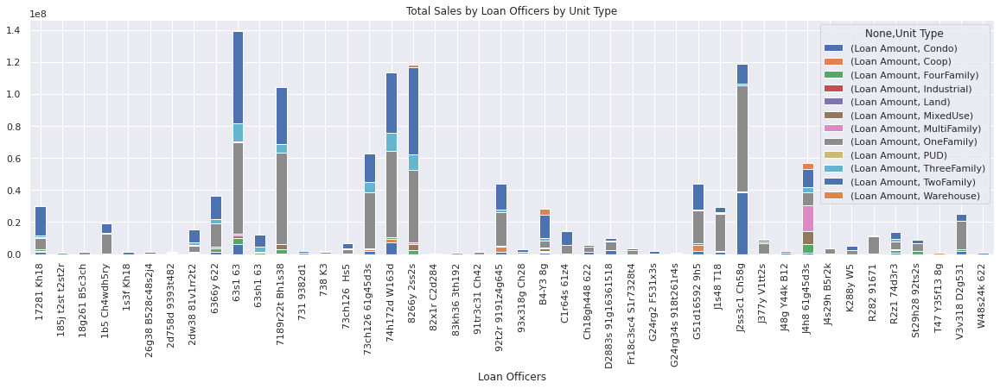

In [130]:
lo_unit_group_plot = lo_unit_group.unstack().plot(kind='bar',stacked=True,title="Total Sales by Loan Officers by Unit Type",figsize=(20, 5))
lo_unit_group_plot.set_xlabel("Loan Officers")
lo_loan_group_plot.set_ylabel("Sales per Unit Type")
plt.show()


# MWB Loan Officers Sales Volume per Unit Type

The category representation looks good also displayed stacked bar graph and. unstack can do this for us.''' Mortgage Loan Ofiicer'' Sales Volume per Loan Type displayed and grahically displayed Loan Officer’s Sales Volume per Unit Type.

In [131]:
#Importing data with date as without index
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', header=0, encoding='cp1252')

One of the really cool things that Pandas allows us to do is resample the data. We want to look at the data by month, we can easily resample and sum it all up. We're using ‘M’ as the period for resampling which means the data should be resampled on a month boundary.

In [132]:
loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()

,Loan Amount,Created Date
0,506250.0,10/14/2014
1,206250.0,10/14/2014
2,648700.0,10/14/2014
3,412750.0,10/14/2014
4,522588.0,10/14/2014


In [133]:
'''
If we want to analyze the data by date,
we need to set the date column as the index using set_index .
'''
#Convert Date Index
loan_patterns['date'] = pd.DatetimeIndex(data['Created Date'])

loan_patterns = loan_patterns.set_index('date')
loan_patterns.index

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


DatetimeIndex(['2014-10-14', '2014-10-14', '2014-10-14', '2014-10-14',
               '2014-10-14', '2014-10-14', '2014-10-15', '2014-10-15',
               '2014-10-15', '2014-10-16',
               ...
               '2018-12-11', '2018-12-14', '2018-12-14', '2018-12-17',
               '2018-12-20', '2018-12-20', '2018-12-21', '2018-12-21',
               '2018-12-26', '2018-12-27'],
              dtype='datetime64[ns]', name='date', length=2501, freq=None)

In [134]:
loan_patterns.head()

,Loan Amount,Created Date
date,,
2014-10-14,506250.0,10/14/2014
2014-10-14,206250.0,10/14/2014
2014-10-14,648700.0,10/14/2014
2014-10-14,412750.0,10/14/2014
2014-10-14,522588.0,10/14/2014


In [135]:
monthly_loan_rev=loan_patterns.resample('M').sum()
loan_patterns.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2501 entries, 2014-10-14 to 2018-12-27
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Loan Amount   2501 non-null   float64
 1   Created Date  2501 non-null   object 
dtypes: float64(1), object(1)
memory usage: 58.6+ KB


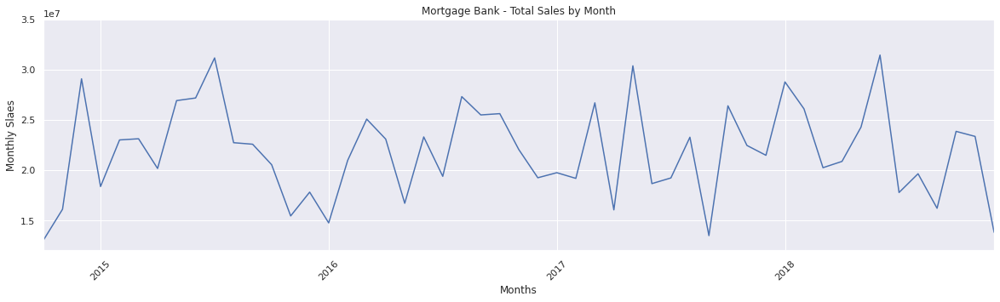

In [136]:
loan_patterns_month_plot = loan_patterns.resample('M').sum().plot(title="Mortgage Bank - Total Sales by Month",
                                                                  legend=False,figsize=(20,5))
loan_patterns_month_plot.set_xlabel("Months")
loan_patterns_month_plot.set_ylabel("Monthly Slaes")
plt.xticks(rotation=45)
plt.ylim((12000000, 35000000))
fig = loan_patterns_month_plot.get_figure()

We can see that monthly mortgage loan sales volume varies between 15M and 32M. Another interesting find is Loan sales are at the peak during summer seasons. Winter sales are normally slow but 2018 was an exception.

In [137]:
loan_patterns.resample('Q').sum()
monthly_loan_rev=loan_patterns.resample('Q').sum()
loan_patterns.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2501 entries, 2014-10-14 to 2018-12-27
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Loan Amount   2501 non-null   float64
 1   Created Date  2501 non-null   object 
dtypes: float64(1), object(1)
memory usage: 58.6+ KB


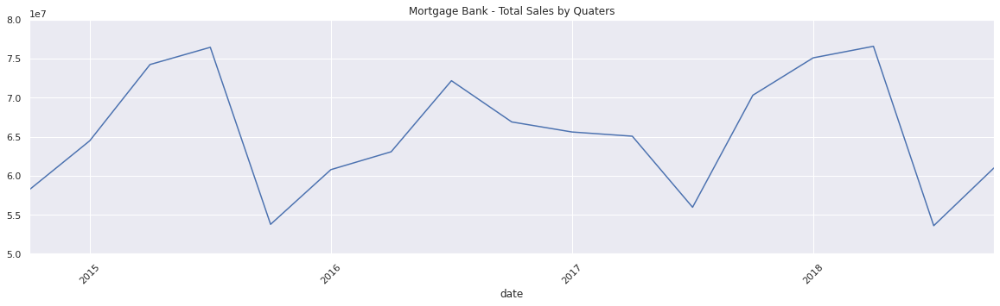

In [138]:
oan_patterns_month_plot = loan_patterns.resample('Q').sum().plot(title="Mortgage Bank - Total Sales by Quaters",
                                                                 legend=False,figsize=(20,5))
loan_patterns_month_plot.set_xlabel("Quaters")
loan_patterns_month_plot.set_ylabel("Quaterly Slaes")
plt.xticks(rotation=45)
plt.ylim((50000000, 80000000))
fig = loan_patterns_month_plot.get_figure()

In [139]:
fig.savefig("./loan_patterns_month_plot.png")

Mortgage Bank's Quarterly Sales Revenue varies between 50 (millions) and 77 (millions)

In [140]:
#Monthy Sales Sorted
'''
Grouping on a function of the index
Groupby operations can also be performed on transformations
of the index values. In the case of a DateTimeIndex,
we can extract portions of the datetime over which to group.
'''

data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', index_col='Created Date', parse_dates=True, encoding='cp1252')
data.head()

,First Name,Last Name,City,State,Zip,Loan Amount,Estimated Value,Loan Purpose,Qualification FICO,Is Primary Wage Earner,...,Unit Type,Loan Type,Lender Name,Time,Fix,ARM,CLTV,Loan Number,Loan Officer Name,LoanInMonth
Created Date,,,,,,,,,,,,,,,,,,,,,
2014-10-14,J58,K37,Edgewater,NJ,7020,506250.0,675000,Purchase,745,False,...,TwoFamily,Residential,MWBI,7:18 AM,True,False,90.00,110300199JA,73ch126 61g45d3s,1
2014-10-14,Y4 H58,622,EAST BRUNSWICK,NJ,8816,206250.0,275000,Purchase,768,False,...,Condo,Residential,MWBI,7:54 AM,True,False,80.00,110300299JA,73ch126 61g45d3s,2
2014-10-14,Y3 618,CH28,WOODSIDE,NY,11377,648700.0,998000,Cash-Out Refi,740,True,...,TwoFamily,Residential,HB,8:36 AM,True,False,45.82,11030039798A,63s1 63,3
2014-10-14,74h1771d,R45f2,Jackson Heights,NY,11370,412750.0,635000,Cash-Out Refi,801,False,...,TwoFamily,Residential,MWBI,9:57 AM,True,False,44.44,11030049998A,73ch126 61g45d3s,4
2014-10-14,st2v281r382,j1gg2r815th,Queens Village,NY,10461,522588.0,535000,Purchase,719,False,...,TwoFamily,FHA,MWBI,12:20 PM,True,False,80.00,G11030059998A,7189r22t Bh1s38,5


In [141]:
# Create a groupby object: by_day
by_month = data.groupby(data.index.strftime('%B'))
by_year = data.groupby(data.index.strftime('Y'))
by_day = data.groupby(data.index.strftime('%a'))

'''
%a - day
%m - month (01 to 12)
%b - abbreviated month name
%B - full month name
%y - year without a century (range 00 to 99)
%Y - year including the century
'''

'\n%a - day\n%m - month (01 to 12)\n%b - abbreviated month name\n%B - full month name\n%y - year without a century (range 00 to 99)\n%Y - year including the century\n'

In [142]:
# Create sum: units_sum
monthly_loan_amount_sum = by_month['Loan Amount'].sum()
monthly_loan_amount_sum

Created Date
April        8.013326e+07
August       9.292258e+07
December     1.013868e+08
February     8.921963e+07
January      8.160879e+07
July         8.750879e+07
June         1.005480e+08
March        9.510573e+07
May          9.824521e+07
November     9.936588e+07
October      1.094211e+08
September    7.772900e+07
Name: Loan Amount, dtype: float64

In [143]:
daily_loan_amount_sum = by_day['Loan Amount'].sum()
daily_loan_amount_sum

Created Date
Fri    2.052834e+08
Mon    2.048027e+08
Sat    1.376921e+07
Sun    1.584283e+07
Thu    2.190100e+08
Tue    2.355647e+08
Wed    2.189220e+08
Name: Loan Amount, dtype: float64

In [144]:
yearly_loan_amount_sum = by_year['Loan Amount'].sum()
yearly_loan_amount_sum

Created Date
Y    1.113195e+09
Name: Loan Amount, dtype: float64

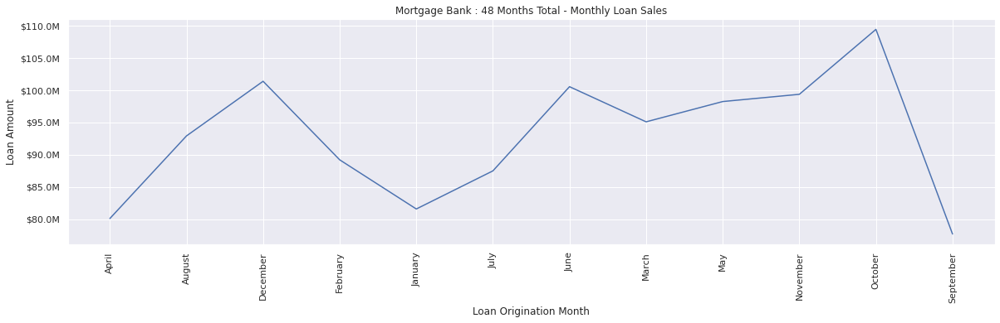

In [145]:
formatter = FuncFormatter(millions)
fig, ax = plt.subplots(figsize=(20,5))
ax.yaxis.set_major_formatter(formatter)
plt.xlabel('Loan Origination Month')
plt.ylabel('Loan Amount')
plt.title('Mortgage Bank : 48 Months Total - Monthly Loan Sales')
plt.xticks(rotation=90)
plt.plot(monthly_loan_amount_sum)
plt.show()

In [146]:
monthly_loan_amount_sum_sorted= monthly_loan_amount_sum.sort_values()
# Print units_sum
monthly_loan_amount_sum

Created Date
April        8.013326e+07
August       9.292258e+07
December     1.013868e+08
February     8.921963e+07
January      8.160879e+07
July         8.750879e+07
June         1.005480e+08
March        9.510573e+07
May          9.824521e+07
November     9.936588e+07
October      1.094211e+08
September    7.772900e+07
Name: Loan Amount, dtype: float64

In [147]:
yearly_loan_amount_sum

Created Date
Y    1.113195e+09
Name: Loan Amount, dtype: float64

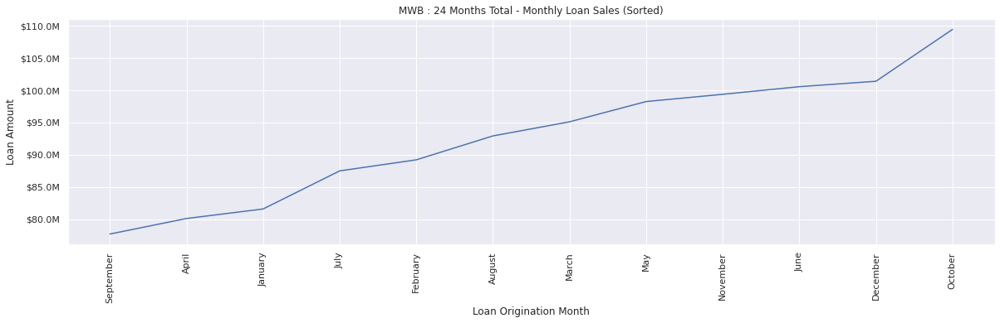

In [148]:
formatter = FuncFormatter(millions)
fig, ax = plt.subplots(figsize=(20,5))
ax.yaxis.set_major_formatter(formatter)
plt.xlabel('Loan Origination Month')
plt.ylabel('Loan Amount')
plt.title('MWB : 24 Months Total - Monthly Loan Sales (Sorted)')
plt.xticks(rotation=90)
plt.plot(monthly_loan_amount_sum_sorted)
plt.show()

In [149]:
lo_zip=data.groupby(['Loan Officer Name', 'Zip'])
lo_zip_count = lo_zip['Zip'].count()
lo_zip_filt = lo_zip.filter(lambda c:c['Zip'].count() > 3)
lo_zip_filt_top10= (lo_zip_filt.groupby(['Zip']).size()).sort_values(ascending=False)
print('Top 10 marketing location by Zip Codes :', lo_zip_filt_top10.head(10))

Top 10 marketing location by Zip Codes : Zip
7650     79
11223    62
11229    50
11432    37
11208    33
7621     30
11355    30
11103    29
11203    28
11420    25
dtype: int64


Top Ten Loan Origination Zip Code. Bank can focus more on marketting to generate more revenue

In [150]:
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import calendar
from time import strptime
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', header=0, encoding='cp1252')
M_loan_city_num=data[['Created Date', 'LoanInMonth']]
M_loan_city_num['date'] = pd.DatetimeIndex(data['Created Date'])
M_loan_city_num = M_loan_city_num.set_index('date')
M_loan_city_num_2017 = M_loan_city_num.loc['2017-1-1':'2017-9-16']
print('2017 : ')
M_loan_city_num_2017.head()

2017 : 


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


,Created Date,LoanInMonth
date,,
2017-01-02,1/2/2017,1
2017-01-03,1/3/2017,2
2017-01-03,1/3/2017,3
2017-01-04,1/4/2017,4
2017-01-04,1/4/2017,5


In [151]:
M_loan_city_num_2018 = M_loan_city_num.loc['2018-1-1':'2018-9-16']
print('2018 :')
M_loan_city_num_2018.head()

2018 :


,Created Date,LoanInMonth
date,,
2018-01-01,1/1/2018,40
2018-01-01,1/1/2018,40
2018-01-02,1/2/2018,4
2018-01-02,1/2/2018,3
2018-01-03,1/3/2018,5


In [152]:
M17= M_loan_city_num_2017.resample('M').count()
M17.index=M17.index.month
M_loan_city_num_2017.resample('M').count().head()

,Created Date,LoanInMonth
date,,
2017-01-31,42,42
2017-02-28,47,47
2017-03-31,68,68
2017-04-30,36,36
2017-05-31,70,70


In [153]:
M18=M_loan_city_num_2018.resample('M').count()
M18.index=M18.index.month
M_loan_city_num_2018.resample('M').count().head()

,Created Date,LoanInMonth
date,,
2018-01-31,49,49
2018-02-28,47,47
2018-03-31,46,46
2018-04-30,39,39
2018-05-31,50,50


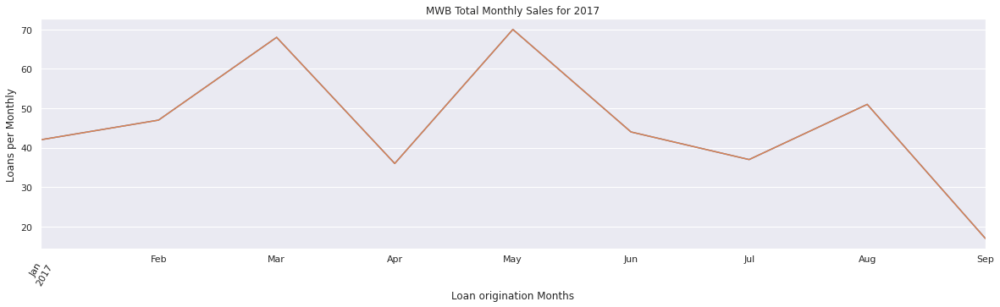

In [154]:
M_loan_city_num_2017_plot = M_loan_city_num_2017.resample('M').count().plot(title="MWB Total Monthly Sales for 2017",
                                                                            legend=False,figsize=(20,5))
plt.xlabel('Loan origination Months')
plt.xticks(rotation=60)
plt.ylabel('Loans per Monthly')
plt.show()

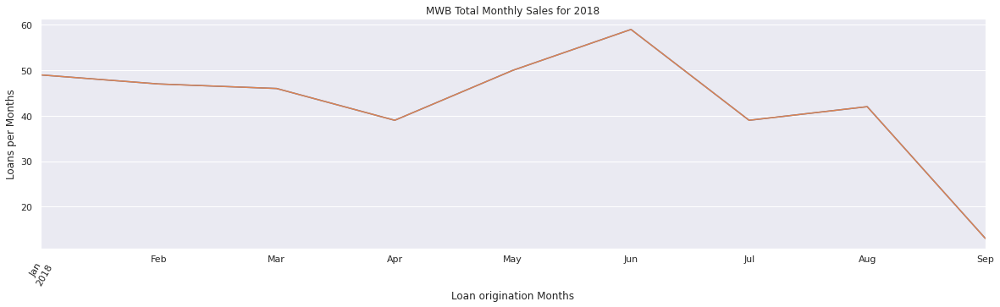

In [155]:
M_loan_city_num_2018_plot = M_loan_city_num_2018.resample('M').count().plot(title="MWB Total Monthly Sales for 2018",
                                                                            legend=False,figsize=(20,5))
plt.xlabel('Loan origination Months')
plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.show()

We can see number of loan closed per month (Comparing data for 2017 & 2018)

In [156]:
import matplotlib.patches as mpatches
data = pd.read_csv('../input/mortgage-bank-loan/mwb2014.csv', encoding='cp1252')
M_loan_amount_num=data[['Created Date', 'Loan Amount']]
M_loan_amount_num['date'] = pd.DatetimeIndex(data['Created Date'])
M_loan_amount_num = M_loan_amount_num.set_index('date')
M_loan_amount_num_2017 = M_loan_amount_num.loc['2017-1-1':'2017-9-30']
M_loan_amount_num_2018 = M_loan_amount_num.loc['2018-1-1':'2018-9-30']
M_amount_17= M_loan_amount_num_2017.resample('M').sum()
M_amount_17.index=M_amount_17.index.month
M_amount_18= M_loan_amount_num_2018.resample('M').sum()
M_amount_18.index=M_amount_18.index.month
M_amount_17.sum()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


Loan Amount    1.866137e+08
dtype: float64

In [157]:
M_amount_18.sum()

Loan Amount    2.052570e+08
dtype: float64

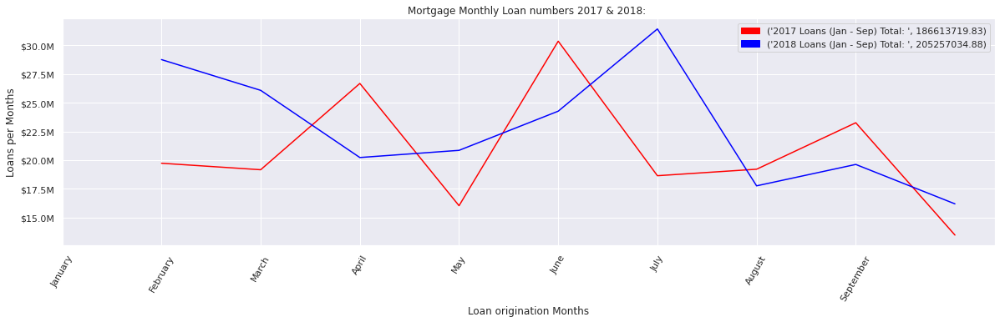

In [158]:
formatter = FuncFormatter(millions)
fig, ax = plt.subplots(figsize=(20,5))
ax.yaxis.set_major_formatter(formatter)
plt.plot(M_amount_17, color='red')
plt.plot(M_amount_18, color='blue')
red_patch = mpatches.Patch(color='red', label=('2017 Loans (Jan - Sep) Total: ', M_amount_17['Loan Amount'].sum()) )
blue_patch = mpatches.Patch(color='blue', label=('2018 Loans (Jan - Sep) Total: ',  M_amount_18['Loan Amount'].sum()) )
plt.legend(handles=[red_patch, blue_patch])
plt.xticks(range(len(M17)), [calendar.month_name[month] for month in M17.index], rotation=60)
plt.xlabel('Loan origination Months')
plt.ylabel('Loans per Months')
plt.title('Mortgage Monthly Loan numbers 2017 & 2018: ')
plt.show()

# Comparing Mortgage Monthly Loan numbers 2017 & 2018

In [159]:
M_amount_17= M_loan_amount_num_2017.resample('M').sum()
M_amount_17.index=M_amount_17.index.month
M_amount_18= M_loan_amount_num_2018.resample('M').sum()
M_amount_18.index=M_amount_18.index.month
M_amount_17.sum()

Loan Amount    1.866137e+08
dtype: float64

In [160]:
M_amount_18.sum()

Loan Amount    2.052570e+08
dtype: float64

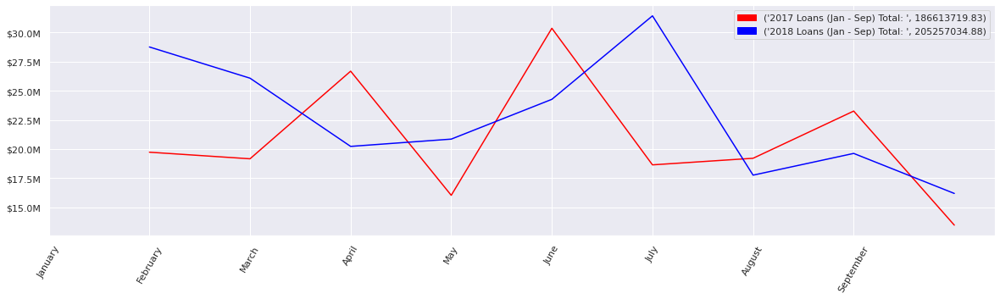

In [161]:
from matplotlib.ticker import FuncFormatter
x = np.arange(5)
money = [1.5e5, 2.5e6, 5.5e6, 1.0e7, 2.0e7, 3.0e7, 4.0e7, 5.0e7, 6.0e7]
def millions(x, pos):
    'The two args are the value and tick position'
    return '$%1.1fM' % (x * 1e-6)

formatter = FuncFormatter(millions)
fig, ax = plt.subplots(figsize=(20,5))
ax.yaxis.set_major_formatter(formatter)
plt.plot(M_amount_17, color='red')
plt.plot(M_amount_18, color='blue')
red_patch = mpatches.Patch(color='red', label=('2017 Loans (Jan - Sep) Total: ', M_amount_17['Loan Amount'].sum()) )
blue_patch = mpatches.Patch(color='blue', label=('2018 Loans (Jan - Sep) Total: ',  M_amount_18['Loan Amount'].sum()) )
plt.legend(handles=[red_patch, blue_patch])
plt.xticks(range(len(M17)), [calendar.month_name[month] for month in M17.index], rotation=60)
plt.show()

In 2017, Mortgage Bank sales revenue was (M_amount_17.sum()) = $180M

In 2018, Mortgage Bank sales revenue was (M_amount_18.sum()) = $197M

We have seen numbers of loan closed went down, but sales revenue went up. Main reason behind this, housing price went up, which drive average loan amount to increase. As a result total sales went up for 2018 comparing 2017

In [162]:
print('Pearson correlation coefficient between Loan number and Loan Revenue: ', r_monthly_loan_num_data_monthly_loan_rev)

Pearson correlation coefficient between Loan number and Loan Revenue:  (0.8447203695695618, 6.63988048351778e-15)


As we have seen earlier earlier, there is positive strong correlation (0.844) between Loan number and Loan Revenue.

Monthly Loan numbers and Monthly Sales volumes are strongly positively correlated. Once we analyze number of the loans closed per month, we find the similarity between sales volume and loan numbers. As average loan numbers goes up, total monthly sales volume goes up. Any given months, if the number of loans closed are higher; we find that average loan amounts are low for that particular months. In other words, this may suggest that loan processing requirements and guidelines loans with higher loan amount take longer time to close the loans with lower loan amounts.

Visual exploration is the most effective way to extract information between variables.

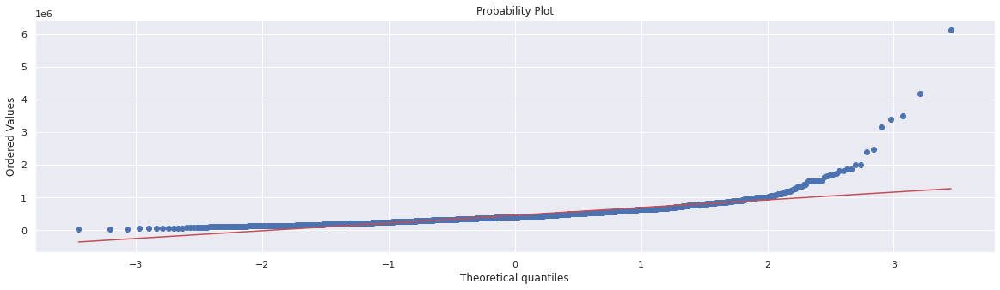

In [163]:
import pylab  #Plotting
import scipy.stats as stats # scintific calculation
plt.figure(figsize=(20,5))
stats.probplot(model_data['Loan Amount'], dist="norm", plot=pylab)
pylab.show()

In [164]:
type(model_data)

pandas.core.frame.DataFrame

In [165]:
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Loan Amount         2501 non-null   float64
 1   city_code           2501 non-null   int16  
 2   zip_code            2501 non-null   int16  
 3   loan_purpose_code   2501 non-null   int64  
 4   Qualification FICO  2501 non-null   int64  
 5   unit_type_code      2501 non-null   int64  
 6   loan_type_code      2501 non-null   int64  
 7   Fix_True            2501 non-null   uint8  
 8   CLTV                2501 non-null   float64
 9   LoanInMonth         2501 non-null   int64  
 10  RATE                2501 non-null   float64
 11  Home                2501 non-null   float64
dtypes: float64(4), int16(2), int64(5), uint8(1)
memory usage: 207.6+ KB


In [166]:
X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])

In [167]:
model_data.columns

Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth', 'RATE', 'Home'],
      dtype='object')

/opt/conda/lib/python3.7/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


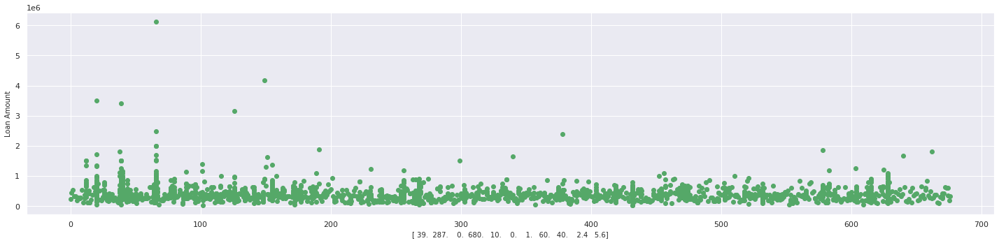

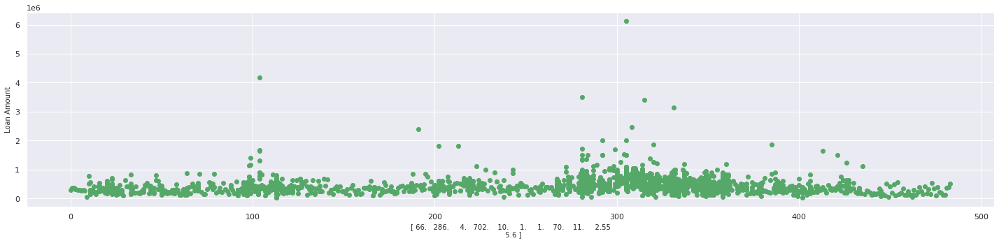

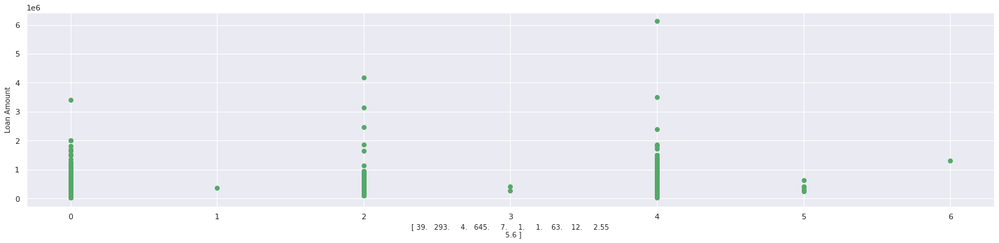

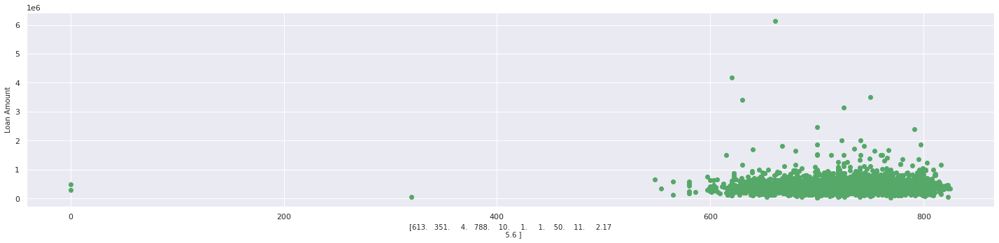

In [168]:
for index, columns in enumerate(X[1:5]):
    plt.figure(figsize=(20, 5))
    plt.scatter(X[:, index], y, color='g')
    plt.ylabel('Loan Amount', size=10)
    plt.xlabel(columns, size=10)
    plt.tight_layout()

Scatter plot for each (Column 1-5) feature with respect to Loan Amount

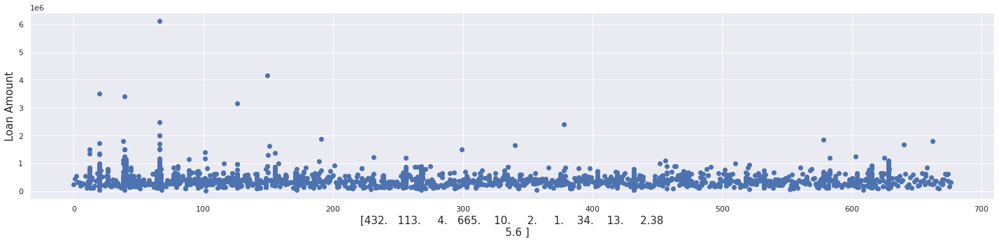

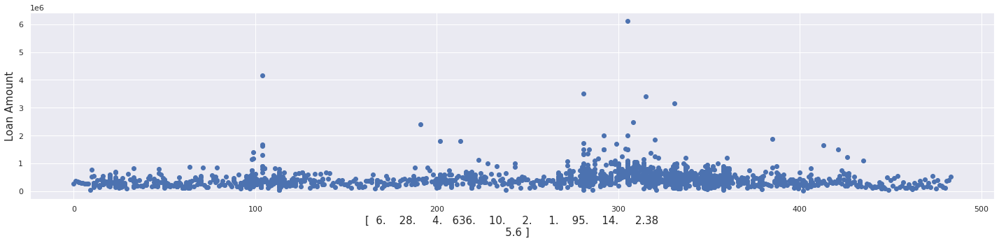

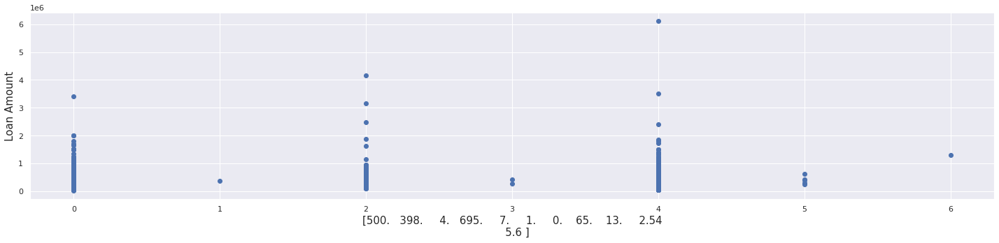

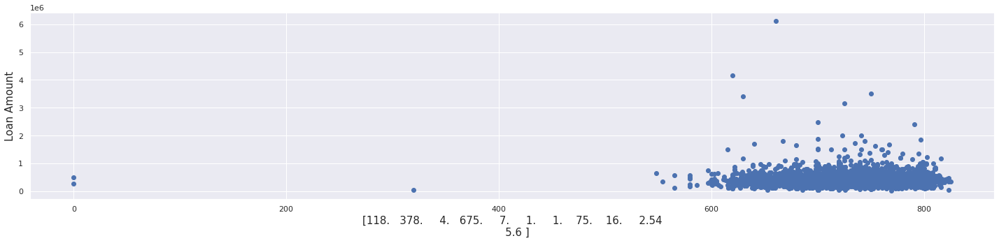

In [169]:
for index, columns in enumerate(X[6:10]):
    plt.figure(figsize=(20, 5))
    plt.scatter(X[:, index], y, color='b')
    plt.ylabel('Loan Amount', size=15)
    plt.xlabel(columns, size=15)
    plt.tight_layout()

Scatter plot for each (Column 6-10) feature with respect to Loan Amount

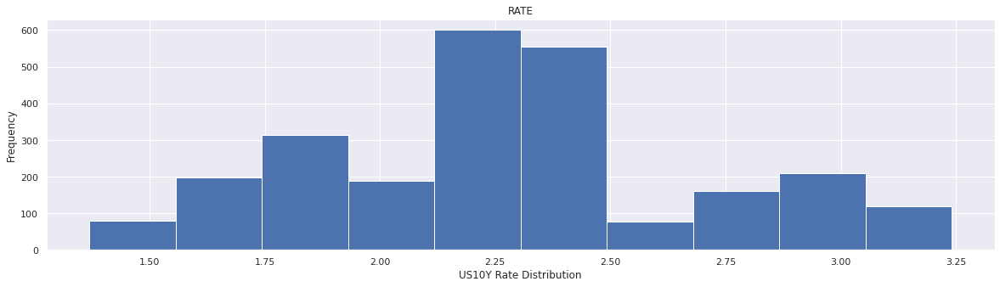

In [170]:
plt.figure(figsize=(20, 5))
plt.hist(model_data['RATE'])
plt.title("RATE")
plt.xlabel("US10Y Rate Distribution")
plt.ylabel("Frequency")
plt.show()

This distribution is somewhat normal distribution

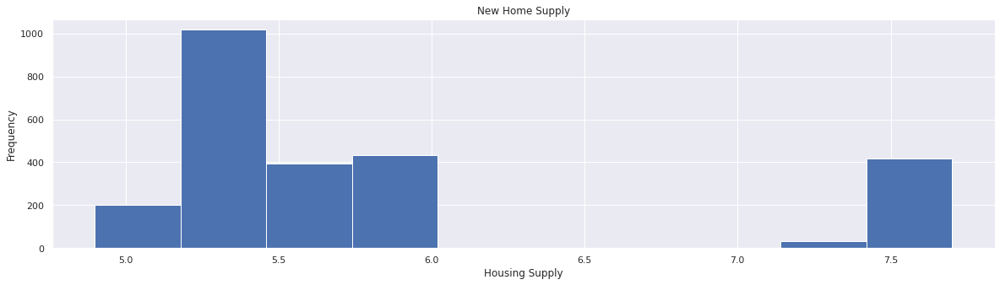

In [171]:
plt.figure(figsize=(20, 5))
plt.hist(model_data['Home'])
plt.title("New Home Supply")
plt.xlabel("Housing Supply")
plt.ylabel("Frequency")
plt.show()

The distribution is somewhat left skewed with a mean to the left

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


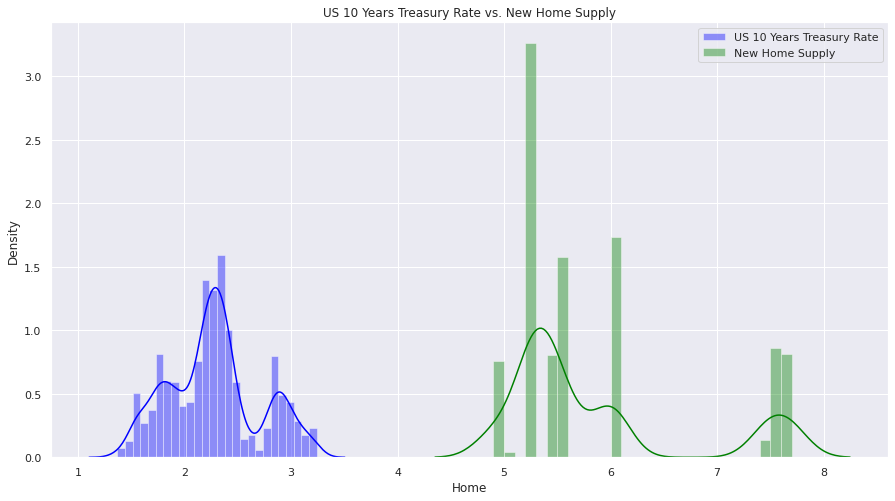

In [172]:
plt.figure(figsize=(15,8))
ax=sns.distplot( model_data['RATE'] , color="blue", label="US 10 Years Treasury Rate")
ax=sns.distplot( model_data['Home'] , color="green", label="New Home Supply")
plt.legend()
plt.title("US 10 Years Treasury Rate vs. New Home Supply")
plt.show()

**Home Supply goes up, RATE goes up**

The distribution plot comparing US 10 Years Treasury Rate & New Home Supply shows that US 10Y RATE is normally distributed and New Home Supply is skewed to the right. Rate is the key component for the government to keep rising housing price in check. Once rate goes up, borrowers buying power will go down, that will keep housing price in check.

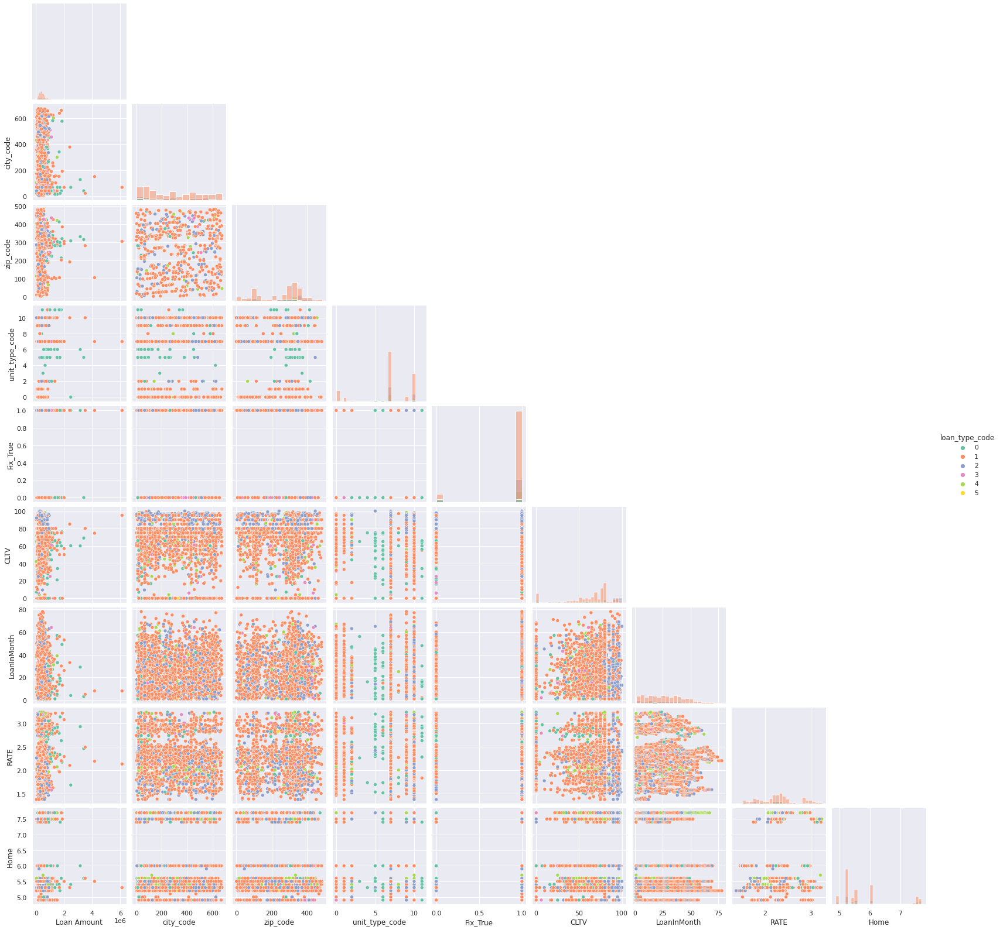

In [173]:
fit_data = model_data.drop(['loan_purpose_code', 'Qualification FICO' ],1)
sns.pairplot(fit_data, hue = 'loan_type_code',corner=True,palette='Set2',diag_kind="hist")
plt.show()

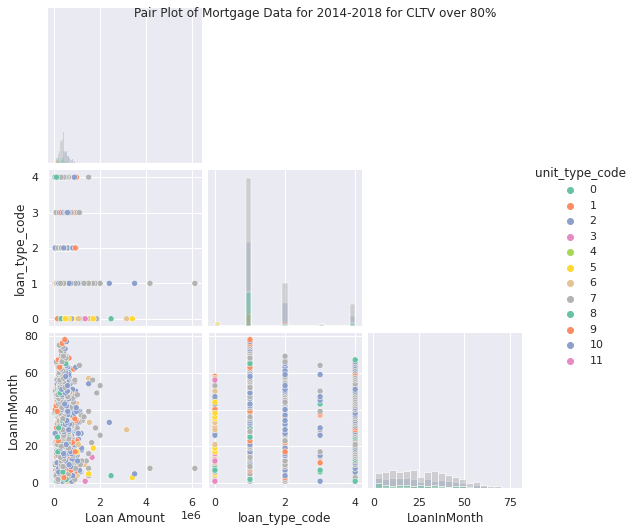

In [174]:
# Plot colored by continent for years 2000-2007
sns.pairplot(fit_data[fit_data['CLTV'] >= 8],
             vars = ['Loan Amount', 'loan_type_code', 'LoanInMonth'],
             hue = 'unit_type_code',corner=True,palette='Set2',diag_kind="hist")
# Title
plt.suptitle('Pair Plot of Mortgage Data for 2014-2018 for CLTV over 80%',
             size = 12);
plt.show()

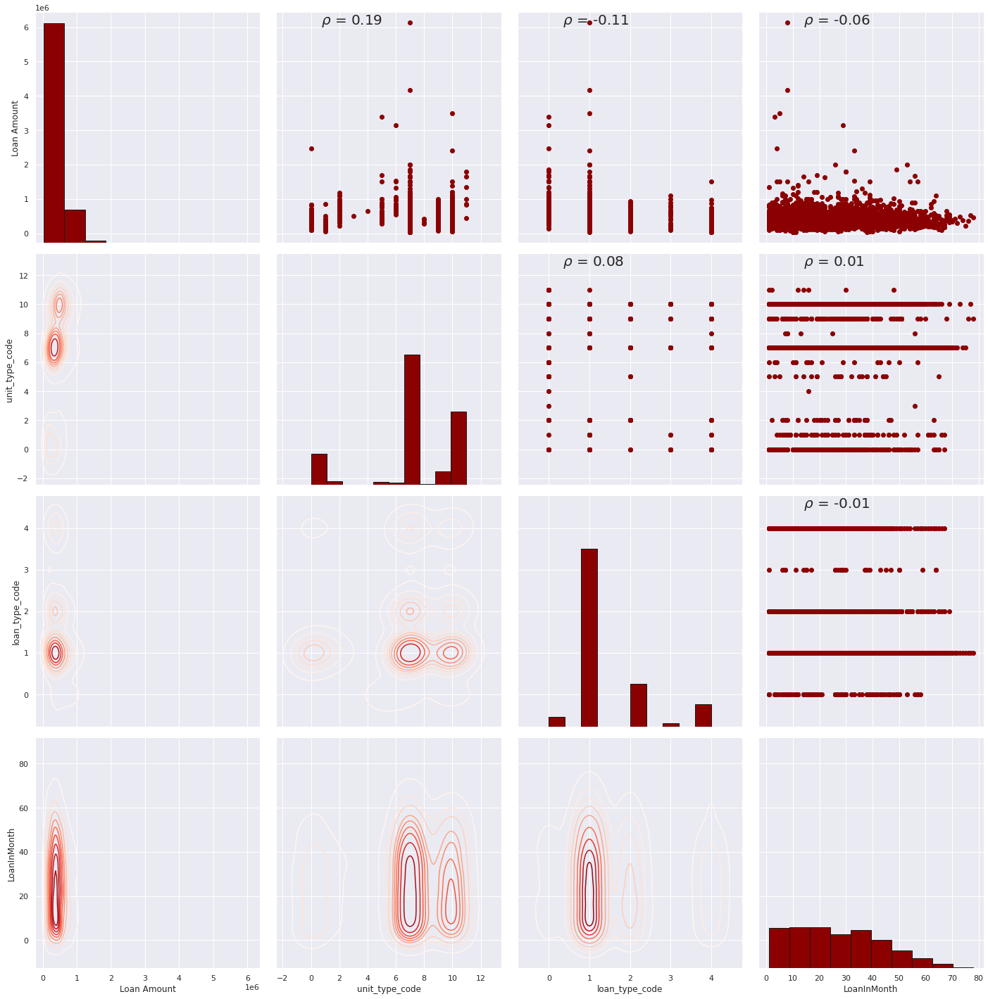

In [175]:
# Function to calculate correlation coefficient between two arrays
def corr(x, y, **kwargs):
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))

    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)
# Create a pair grid instance
grid = sns.PairGrid(data= fit_data[fit_data['CLTV'] > 8],
                    vars = ['Loan Amount', 'unit_type_code',
       'loan_type_code', 'LoanInMonth'], height = 5)
# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred')

Calculated correlation coefficient between two arrays: data and vars=['Loan Amount', 'unit_type_code', 'loan_type_code', 'LoanInMonth']

**FEATURE SELECTION** Feature Selection is one of the core concepts in machine learning which hugely impacts the performance of your model. The data features that you use to train your machine learning models have a huge influence on the performance you can achieve. How to select features and what are Benefits of performing feature selection before modeling your data? Reduces Overfitting: Less redundant data means less opportunity to make decisions based on noise. Improves Accuracy: Less misleading data means modeling accuracy improves.Reduces Training Time: fewer data points reduce algorithm complexity and algorithms train faster. Feature Selection Methods: 

We will share 3 Feature selection techniques that are easy to use and also gives good results. 
-  Univariate Selection 
- Feature Importance 
- Correlation Matrix with Heatmap

# Univariate Selection

Statistical tests can be used to select those features that have the strongest relationship with the output variable. The scikit-learn library provides the SelectKBest class that can be used with a suite of different statistical tests to select a specific number of features.

The example below uses the chi-squared (chi²) statistical test for non-negative features to select 10 of the best features from the Mobile Price Range Prediction Dataset.

In [176]:
model_data=model_data3.copy()
model_data['Qualification FICO']=model_data['Qualification FICO'].astype('int64')
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


Making sure Target Variable (Qualification FICO) is integer. In order to reduce the weight, we will be scalling.

In [177]:
#Scalling data
model_data['Loan Amount']=model_data['Loan Amount']/100000
model_data['Loan Amount']=model_data['Loan Amount'].astype('float64')
model_data['city_code']=model_data['city_code']/100
model_data['city_code']=model_data['city_code'].astype('float64')
model_data['zip_code']=model_data['zip_code']/100
model_data['zip_code']=model_data['zip_code'].astype('float64')
model_data['Qualification FICO']=model_data['Qualification FICO']/100
model_data['CLTV']=model_data['CLTV']/10
model_data['CLTV']=model_data['CLTV'].astype('float64')
model_data['LoanInMonth']=model_data['LoanInMonth']/10
model_data['LoanInMonth']=model_data['LoanInMonth'].astype('float64')
model_data['Qualification FICO']=model_data['Qualification FICO'].astype('float64')
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6.0,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6.0,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7.0,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6.3,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5.0,1.1,2.17,5.6


In [178]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Loan Amount         2501 non-null   float64
 1   city_code           2501 non-null   float64
 2   zip_code            2501 non-null   float64
 3   loan_purpose_code   2501 non-null   int64  
 4   Qualification FICO  2501 non-null   float64
 5   unit_type_code      2501 non-null   int64  
 6   loan_type_code      2501 non-null   int64  
 7   Fix_True            2501 non-null   uint8  
 8   CLTV                2501 non-null   float64
 9   LoanInMonth         2501 non-null   float64
 10  RATE                2501 non-null   float64
 11  Home                2501 non-null   float64
dtypes: float64(8), int64(3), uint8(1)
memory usage: 301.5+ KB


In [179]:
X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])

In [180]:
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k='all')
fit = bestfeatures.fit(X,y)

In [181]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(model_data.columns)

In [182]:
#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
featureScores.nlargest(11,'Score')

,Specs,Score
0,Loan Amount,83.072449
1,city_code,29.972507
3,loan_purpose_code,23.663874
7,Fix_True,8.930081
2,zip_code,5.529163
8,CLTV,5.020901
9,LoanInMonth,4.579280
6,loan_type_code,3.235441
5,unit_type_code,1.079576
4,Qualification FICO,0.001570


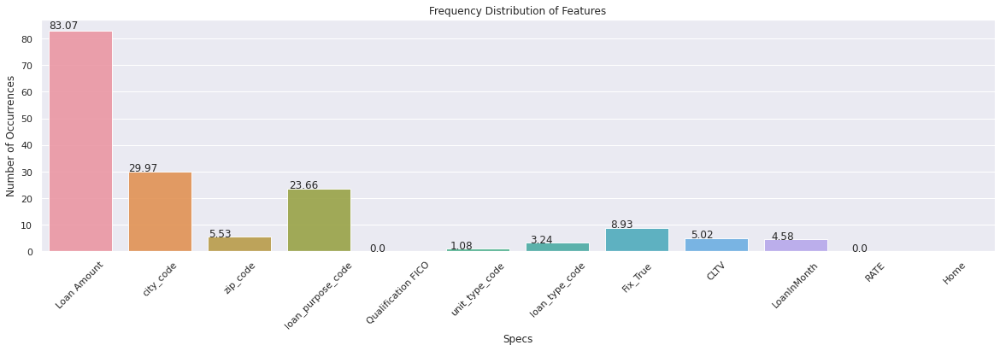

In [183]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="darkgrid")
plt.figure(figsize=(20,5))
ax=sns.barplot(x=featureScores['Specs'], y=round((featureScores['Score']),2), alpha=0.9)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.title('Frequency Distribution of Features')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Specs', fontsize=12)
plt.xticks(rotation=45)
plt.show()

# Feature Importance

The feature importance of each feature of our dataset by using the feature importance property of the model. Feature importance gives us a score for each feature of our data, the higher the score more important or relevant is the feature towards your output variable. Feature importance is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.

In [184]:
model_data['CLTV']=model_data['CLTV'].astype('int64')
import pandas as pd
import numpy as np

X = np.array(model_data.drop(['CLTV'],1))
y = np.array(model_data['CLTV'])    #target column
Z = model_data.drop(['loan_purpose_code'],1) #Max Col = 10

In [185]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
model.feature_importances_

array([0.12739342, 0.11872587, 0.11969392, 0.03220939, 0.12495701,
       0.05490028, 0.06422979, 0.0108055 , 0.12602052, 0.12772372,
       0.09334058])

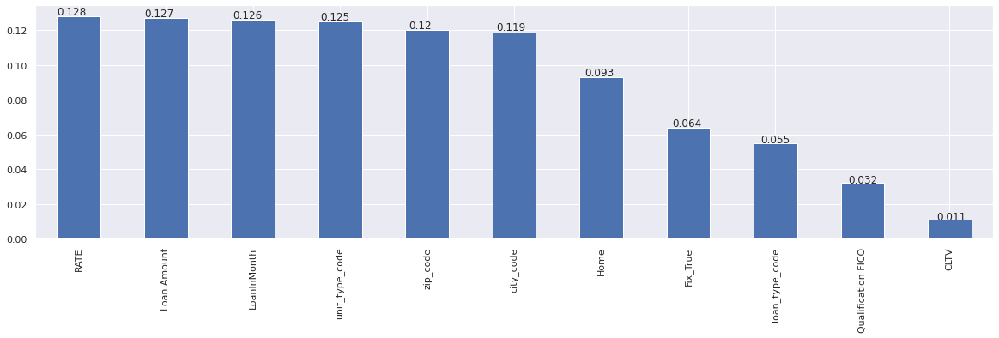

In [186]:
#plot graph of feature importances for better visualization
plt.figure(figsize=(20,5))
feat_importances = round((pd.Series(model.feature_importances_, index=Z.columns)),3)
ax=feat_importances.nlargest(11).plot(kind='bar')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

# Correlation Matrix with Heatmap

Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

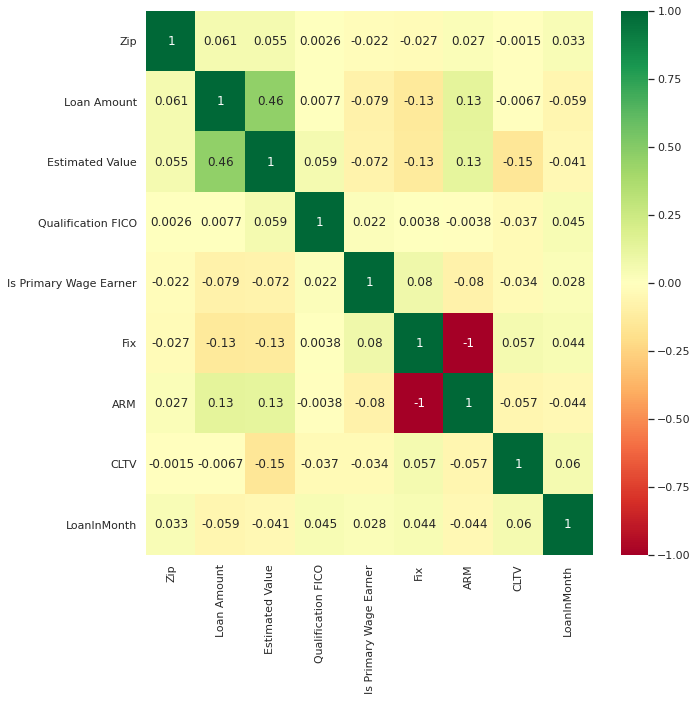

In [187]:
import pandas as pd
import numpy as np
import seaborn as sns
X = np.array(model_data.drop(['CLTV'],1))
y = np.array(model_data['CLTV'])    #target column
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(10,10))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.show()

In [188]:
''' Let's Drop Fretures that are not important '''
fit_data = model_data.drop(['loan_purpose_code', 'Qualification FICO' ],1)
fit_data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Loan Amount     2501 non-null   float64
 1   city_code       2501 non-null   float64
 2   zip_code        2501 non-null   float64
 3   unit_type_code  2501 non-null   int64  
 4   loan_type_code  2501 non-null   int64  
 5   Fix_True        2501 non-null   uint8  
 6   CLTV            2501 non-null   int64  
 7   LoanInMonth     2501 non-null   float64
 8   RATE            2501 non-null   float64
 9   Home            2501 non-null   float64
dtypes: float64(6), int64(3), uint8(1)
memory usage: 262.4+ KB


In [189]:
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])    #target column
X[:5,] #print 1st 5 row of input

array([[ 4.548,  0.8  ,  3.3  ,  7.   ,  0.   ,  6.   ,  4.   ,  2.4  ,
         5.6  ],
       [ 9.6  ,  0.39 ,  2.87 , 10.   ,  0.   ,  6.   ,  4.   ,  2.4  ,
         5.6  ],
       [ 4.095,  0.66 ,  2.86 , 10.   ,  1.   ,  7.   ,  1.1  ,  2.55 ,
         5.6  ],
       [ 4.725,  0.39 ,  2.93 ,  7.   ,  1.   ,  6.   ,  1.2  ,  2.55 ,
         5.6  ],
       [ 3.   ,  6.13 ,  3.51 , 10.   ,  1.   ,  5.   ,  1.1  ,  2.17 ,
         5.6  ]])

In [190]:
print('Target variable is based on the five input rows above. \nFix Mortgage = 1 & ARM (Adjustable Rate Mortgage) = 0 : \n',y[:5,])

Target variable is based on the five input rows above. 
Fix Mortgage = 1 & ARM (Adjustable Rate Mortgage) = 0 : 
 [0 1 1 1 1]


# PCA (Principal Component Analysis)

PCA use PCA to de-correlate these measurements, then plot the de-correlated points and measure their Pearson correlation. Compute Pearson correlation coefficient between two arrays.

In [191]:
def pearson_r(x, y):
    # Compute correlation matrix: corr_mat
    corr_mat = np.corrcoef(x, y)
    # Return entry [0,1]
    return corr_mat[0, 1]

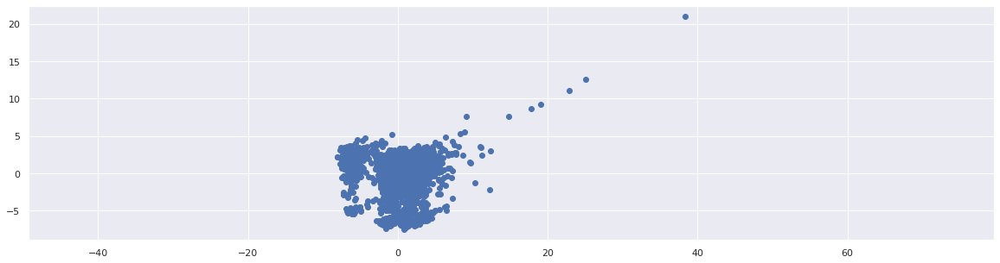

In [192]:
# Import PCA
from sklearn.decomposition import PCA
# Create PCA instance: model
model = PCA()
# Apply the fit_transform method of model to grains: pca_features
pca_features = model.fit_transform(model_data)
# Assign 0th column of pca_features: xs
xs = pca_features[:,0]
# Assign 1st column of pca_features: ys
ys = pca_features[:,1]
plt.figure(figsize=(20,5))
plt.scatter(xs, ys) # Scatter plot xs vs ys
plt.axis('equal')
plt.show()

# Variance of the PCA features

The dataset is 10-dimensional. But what is its intrinsic dimension? Make a plot of the variances of the PCA features to find out. As before, samples is a 2D array, where each row represents a fish.

We'll need to standardize the features first. Tthe use of principal component analysis for dimensionality reduction, for visualization of high-dimensional data, for noise filtering, and for feature selection within high-dimensional data. Because of the versatility and interpretability of PCA, it has been shown to be effective in a wide variety of contexts and disciplines.

Given any high-dimensional dataset, I tend to start with PCA in order to visualize the relationship between points ), to understand the main variance in the data and to understand the intrinsic dimensionality (by plotting the explained variance ratio).

In [193]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])
X.shape

(2501, 9)

In [194]:
# Create scaler: scaler
scaler = StandardScaler()

In [195]:
# Create a PCA instance: pca
pca = PCA()

In [196]:
# Create pipeline: pipeline
pipeline = make_pipeline(scaler, pca)

In [197]:
# Fit the pipeline to 'samples'
pipeline.fit(fit_data)
pca.n_components_

10

In [198]:
# Plot the explained variances
columns = ['Loan Amount', 'zip_code', 'loan_purpose_code', 'Qualification FICO', 'unit_type_code',
       'loan_type_code', 'Fix_True', 'CLTV', 'RATE', 'Home']
for x in ax.get_xticklabels(minor=True):
    columns.set_rotation(45)
    print(x)

In [199]:
fit_data.columns

Index(['Loan Amount', 'city_code', 'zip_code', 'unit_type_code',
       'loan_type_code', 'Fix_True', 'CLTV', 'LoanInMonth', 'RATE', 'Home'],
      dtype='object')

Now we want to know how many principal components we can choose for our new feature subspace?

A useful measure is the so-called “explained variance ratio“. 

The explained variance ratio tells us how much information (variance) can be attributed to each of the principal components. We can plot bar graph between no. of features on X axis and variance ratio on Y axis

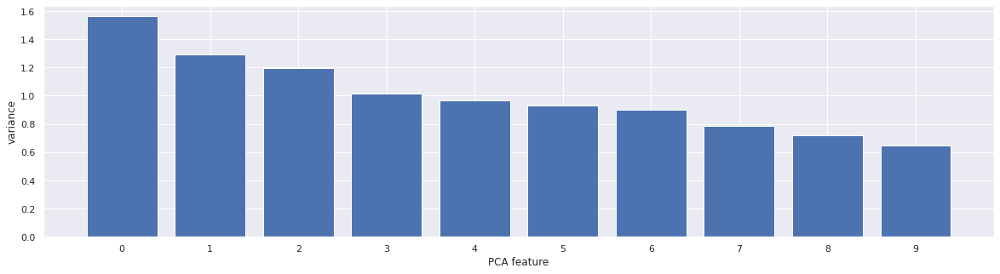

In [200]:
features = range(pca.n_components_)
feature_names = features = range(pca.n_components_)
plt.figure(figsize=(20,5))
ax=plt.bar(features, pca.explained_variance_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(feature_names)
plt.show()

In [201]:
pca.fit_transform(X)
print(pca.mean_)

[4.45099908 2.78884446 2.59613754 7.07676929 1.41143543 6.18192723
 2.66541383 2.27612555 5.84162335]


In [202]:
print(pca.components_)

[[ 6.74631158e-01 -1.42558887e-01  9.47144178e-02  7.15100575e-01
  -6.06926841e-03 -5.83982496e-02 -2.36003998e-02  1.04425183e-02
   9.84355581e-03]
 [ 6.24676971e-01 -3.39271890e-02 -3.63329138e-02 -5.46747569e-01
  -2.79653254e-02  5.54415690e-01 -1.46261205e-02  8.51674717e-04
   1.08518038e-03]
 [ 3.57335110e-01 -6.33451485e-02 -2.18323287e-02 -4.18052138e-01
  -6.39237795e-02 -8.25592495e-01 -7.95718612e-02  2.91204431e-02
   1.36334785e-02]
 [ 1.41995704e-01  9.86633070e-01  2.51691455e-02  5.62644035e-02
  -2.18679814e-02 -4.32461578e-02  1.18712611e-02 -9.30813486e-03
  -4.15073885e-03]
 [ 4.89655127e-02 -2.23000695e-02  5.89480870e-02 -3.00364922e-02
  -3.27211458e-02 -5.76526444e-02  9.93626306e-01 -1.40120500e-02
  -2.90507042e-02]
 [ 3.70608522e-02  1.14319728e-02 -9.90040458e-01  9.93517298e-02
  -6.84259300e-02 -9.86495743e-03  5.66659554e-02 -1.30116095e-02
  -1.68870163e-02]
 [ 3.51813048e-02  1.62475088e-02 -6.29575543e-02 -2.41658456e-02
   7.86270830e-01 -2.6987222

In [203]:
print(pca.explained_variance_)

[10.26745402  6.93543827  6.82999328  3.91074715  2.68754743  1.25011306
  0.94337535  0.65752734  0.1609216 ]


In [204]:
print(pca.explained_variance_ratio_)

[0.30518735 0.20614731 0.20301309 0.11624212 0.07988402 0.03715806
 0.02804066 0.01954419 0.0047832 ]


In [205]:
print(pca.singular_values_)

[160.21434099 131.67610134 130.6712792   98.87804545  81.96870482
  55.9042275   48.5637557   40.54402963  20.05751701]


In [206]:
print(pca.n_components_)

9


In [207]:
print(pca.noise_variance_)

0.0


Features with high variance ratio
Text(0,0,'Loan Amount') = 4.45 
Text(3,0,'unit_type_code') = 7.1
Text(5,0,'Fix_True') = 4.2 

Finding Correlation between Features and Target Variable in mortgage Dataset using Heatmap


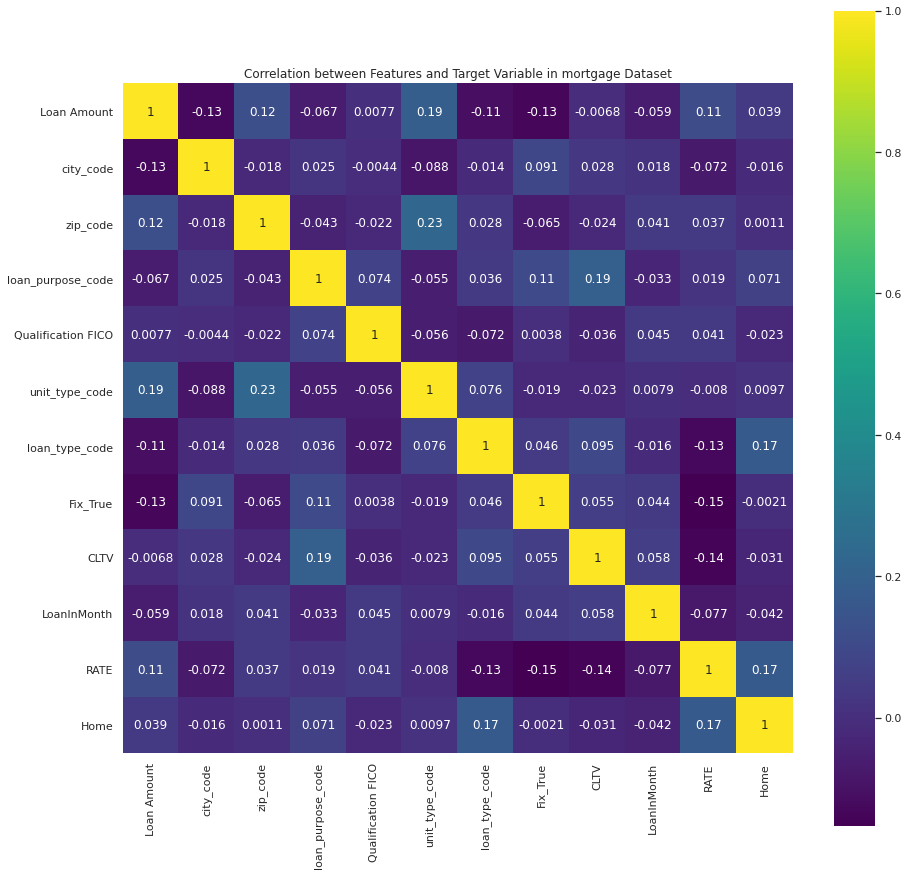

In [208]:
correlation = model_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='viridis')
plt.title('Correlation between Features and Target Variable in mortgage Dataset')
plt.show()

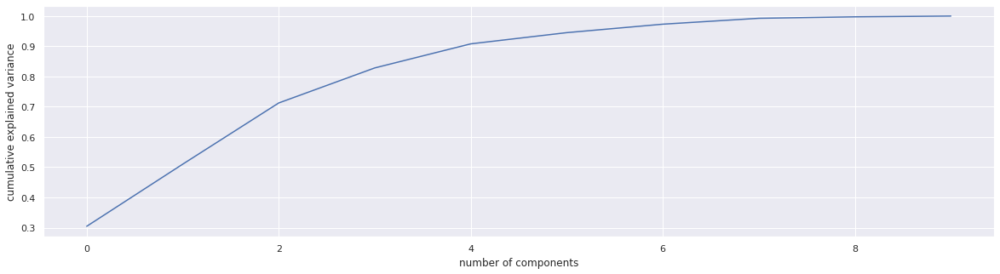

In [209]:
#Let us load the basic packages needed for the PCA analysis
pca = PCA().fit(fit_data)
plt.figure(figsize=(20,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

We can reduce to six to get the 98% accurary

# PCA as dimensionality reduction

Using PCA for dimensionality reduction involves zeroing out one or more of the smallest principal components, resulting in a lower-dimensional projection of the data that preserves the maximal data variance.

Here is an example of using PCA as a dimensionality reduction transform:

In [210]:
pca = PCA(n_components=6)
pca.fit(X)
X_pca = pca.transform(X)
print("original shape:   ", X.shape)

original shape:    (2501, 9)


In [211]:
print("transformed shape:", X_pca.shape)

transformed shape: (2501, 6)


The transformed data has been reduced to a 6 dimension. To understand the effect of this dimensionality reduction, we can perform the inverse transform of this reduced data and plot it along with the original data:



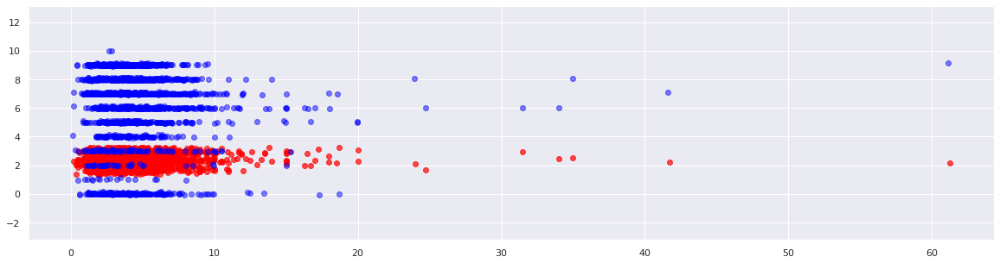

In [212]:
X_new = pca.inverse_transform(X_pca)
plt.figure(figsize=(20,5))
plt.scatter(X[:, 0], X[:, 7], alpha=0.7, c='red')
plt.scatter(X_new[:, 0], X_new[:, 5], alpha=0.5, c='blue')
plt.axis('equal')
plt.show()

The light points are the original data, while the dark points are the projected version. This makes clear what a PCA dimensionality reduction means: the information along the least important principal axis or axes is removed, leaving only the component(s) of the data with the highest variance. The fraction of variance that is cut out (proportional to the spread of points about the line formed in this figure) is roughly a measure of how much "information" is discarded in this reduction of dimensionality.

This reduced-dimension dataset is in some senses "good enough" to encode the most important relationships between the points: despite reducing the dimension of the data by 50%, the overall relationship between the data points are mostly preserved.

# MODELING

In the Modeling stage we discuss the activities related to the model building part of our project. A selection of five modeling techniques is made that are applicable to our capstone project. From each of these five modeling techniques, a model is built with the feature set provided earlier, and the models are validated using repeated cross-validation.

## SELECTION OF MODELING TECHNIQUES

For our modeling we use a combination of predictive techniques. Multiple techniques are selected and applied on the data. For the non-linear regression techniques, we use Support Vector Regression (SVR) and Neural Networks (NN). SVR has shown to obtain excellent performances in regression and time series applications. Neural Networks are a widely used method for time series data that generally gives mixed results.

Another technique we use is Classification and Decession Trees, which is a simple technique that is easy to visualize. Also two ensemble techniques are included, in order to improve the performance of the Classification and Regression Trees. These ensemble techniques are Gradient Boosting Machines (GBM) and Random Forests (RF). These techniques create a multitude of regression trees and select a combination of them in order to maximize the performance.

## MODEL BUILDING

Using these five techniques (ARIMA, Linear Regression, Logistic Regression, SVM, SVR, Decision Tree, RF, and KNN) we can create five models. We use the list of features mentioned in section as input for our models. A total of 12 features are included, the remaining features were excluded after performing feature selection. For each of the five models hyperparameters were tuned, using grid search. Hyperparameters are the model-specific parameters that are used for optimizing the model. They generally have to be tuned in order to optimize the model’s performance, and reduce the variance and bias of the model. By training the model with different values of the size and the decay, and evaluating its performance, we can select the hyperparameters that result in the best performing model in terms of predictive power.

# ARMA Model

Estimating an AR Model

We will estimate the AR(1) parameter, ϕ, of one of the Rate, Revenue, Loan_num, series that generated in the earlier . Since the parameters are known for a series, it is a good way to understand the stimation routines before applying it to real data. For monthly_rate_data with a true ϕ of 0.9, we will print out the estimate of ϕ. In addition, we will also print out the entire output that is produced when you fit a time series, so we can get an idea of what other tests and summary statistics are available in statsmodels

In [213]:
import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)

In [214]:
US10Y.index = pd.to_datetime(US10Y.index)
monthly_rate_data = US10Y['RATE'].resample(rule='M').last()
# Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
# Fit an AR(1) model to the first simulated data
mod_rate = ARMA(np.asarray(monthly_rate_data), order=(1,0))
res_rate = mod_rate.fit()
# Print out summary information on the fit
print(res_rate.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                   51
Model:                     ARMA(1, 0)   Log Likelihood                  15.789
Method:                       css-mle   S.D. of innovations              0.175
Date:                Sun, 07 Mar 2021   AIC                            -25.579
Time:                        01:41:54   BIC                            -19.783
Sample:                             0   HQIC                           -23.364
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3612      0.224     10.558      0.000       1.923       2.800
ar.L1.y        0.9057      0.053     16.978      0.000       0.801       1.010
                                    Roots           

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


In [215]:
# Print out the estimate for the constant and for phi
print("When the true phi=0.9, the estimate of phi (and the constant) are:")
print(res_rate.params)

When the true phi=0.9, the estimate of phi (and the constant) are:
[2.3611952  0.90574769]


Forecasting with an AR Model

In addition to estimating the parameters of a model, we can also do forecasting using statsmodels. The in-sample is a forecast of the next data point using the data up to that point, and the out-of-sample forecasts any number of data points in the future. These forecasts can be made using either the predict() method if we want the forecasts in the form of a series of data, or using the plot_predict() method we you want a plot of the forecasted data. We will supply the starting point for forecasting and the ending point, which can be any number of data points after the data set ends. For the simulated series Monthly Interest Rate with ϕ=0.9, we will plot in-sample and out-of-sample forecasts.

Being able to forecast interest rates is of enormous importance, not only for bond investors but also for individuals like new homeowners who must decide between fixed and floating rate mortgages.

There is some mean reversion in interest rates over long horizons. In other words, when interest rates are high, they tend to drop and when they are low, they tend to rise over time. Currently they are below long-term rates, so they are expected to rise, but an AR model attempts to quantify how much they are expected to rise.

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


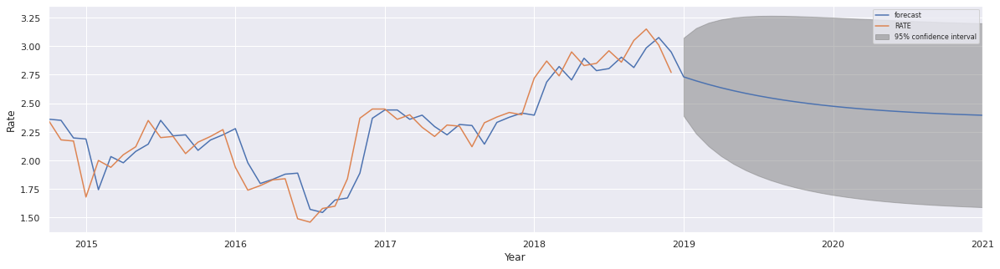

In [216]:
from statsmodels.tsa.arima_model import ARMA
# Forecast interest rates using an AR(1) model
mod_monthly_rate_data = ARMA(monthly_rate_data, order=(1,0))
res = mod_monthly_rate_data.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
ax=res.plot_predict(start=0, end='2021',ax=ax)
plt.legend(fontsize=8)
plt.ylabel('Rate')
plt.xlabel('Year')
plt.show()

Since we have only used only FOUR years of Monthly Interest Rate Data, we can see the short term downward momentum on the interest rate

A daily move up or down in interest rates is unlikely to tell us anything about interest rates tomorrow, but a move in interest rates over a year can tell us something about where interest rates are going over the next year. The DataFrame daily_data contains daily data of 10-year interest rates from 1962 to 2017

In [217]:
daily_data = pd.read_csv('../input/mortgage-bank-loan/DGS10.csv', index_col='DATE')
#Data Cleaning
daily_data.replace('.', -1, inplace=True)
daily_data= daily_data.replace(to_replace=[-1], value=[np.nan])
daily_data = daily_data.dropna()
daily_data['DGS10']= daily_data['DGS10'].astype('float64')
daily_data['change_rates'] = daily_data.diff()
daily_data = daily_data.dropna()
#Convert index to datetime
daily_data.index = pd.to_datetime(daily_data.index)
annual_data = daily_data['DGS10'].resample(rule='A').last()
annual_data[:5]

DATE
1962-12-31    3.85
1963-12-31    4.14
1964-12-31    4.21
1965-12-31    4.65
1966-12-31    4.64
Freq: A-DEC, Name: DGS10, dtype: float64

In [218]:
annual_data = annual_data.dropna()
# Repeat above for annual data
annual_data['diff_rates'] = annual_data.diff()
annual_data['diff_rates'] = annual_data['diff_rates'].dropna()
annual_data['diff_rates'][:5]

DATE
1963-12-31    0.29
1964-12-31    0.07
1965-12-31    0.44
1966-12-31   -0.01
1967-12-31    1.06
Freq: A-DEC, Name: DGS10, dtype: float64

In [219]:
# Compute and print the autocorrelation of daily changes
autocorrelation_daily = daily_data['change_rates'].autocorr()
print("The autocorrelation of daily interest rate changes is %4.2f" %(autocorrelation_daily))

The autocorrelation of daily interest rate changes is 0.07


In [220]:
# Compute and print the autocorrelation of annual changes
autocorrelation_annual = annual_data['diff_rates'].autocorr()
print("The autocorrelation of annual interest rate changes is %4.2f" %(autocorrelation_annual))

The autocorrelation of annual interest rate changes is -0.22


Notice how the daily autocorrelation is small (0.07) but the annual autocorrelation is large and negative (-0.22)

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


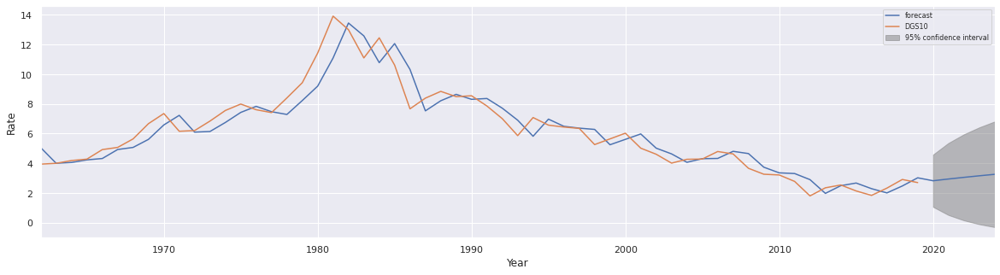

In [221]:
annual_rate=daily_data.resample('A').mean()
annual_rate_data=annual_rate['DGS10']
# Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
# Forecast interest rates using an AR(1) model
mod_annual_rate = ARMA(annual_rate_data, order=(1,0))
res_annual_rate = mod_annual_rate.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_annual_rate.plot_predict(start=0, end='2024',ax=ax)
plt.ylabel('Rate')
plt.xlabel('Year')
plt.legend(fontsize=8)
plt.show()

Over long horizons, when interest rates go up, the economy tends to slow down, which consequently causes interest rates to fall, and vice versa.

According to an AR(1) model, 10-year interest rates are forecasted to rise from 2.16%, towards the end of 2017 to 3.35% in five years

# Forecast expected monthly closed loans

Our Mortgage DataSet contains data from Oct 2014 to December 2018. Let’s forecast Monthly Closed Loans and Monthly Revenue. We will forecast monthly_loan_num_data using an AR(1) model

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


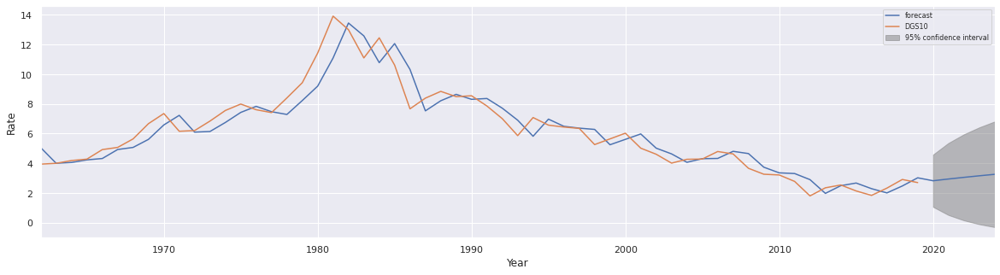

In [222]:
monthly_rate=daily_data.resample('M').sum()
monthly_rate_data=monthly_rate['DGS10']
# Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
# Forecast interest rates using an AR(1) model
mod_monthly_rate = ARMA(monthly_rate_data, order=(1,0))
res_monthly_rate = mod_monthly_rate.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_annual_rate.plot_predict(start=0, end='2024',ax=ax)
plt.legend(fontsize=8)
plt.ylabel('Rate')
plt.xlabel('Year')
plt.show()

Over long horizons, when interest rates go up, the economy tends to slow down, which consequently causes interest rates to fall, and vice versa.

According to an AR(1) model, 10-year interest rates are forecasted to rise from 2.16%, towards the end of 2017 to 3.35% in five years

# Forecast expected monthly closed loans

Our Mortgage DataSet contains data from Oct 2014 to December 2018. Let’s forecast Monthly Closed Loans and Monthly Revenue. We will forecast monthly_loan_num_data using an AR(1) model

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


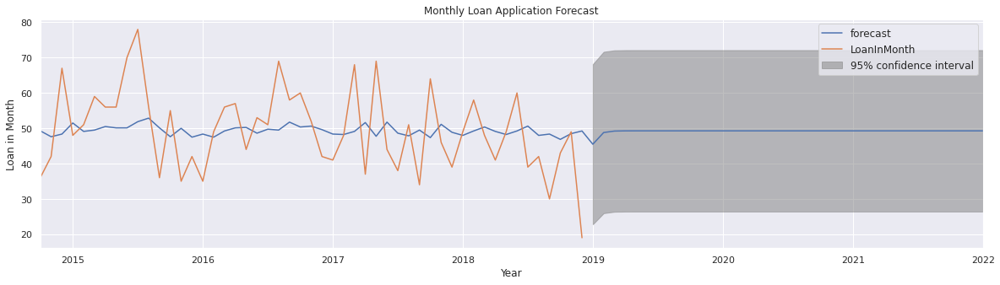

In [223]:
## Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
M_loan_city_num.resample('M').last()
monthly_loan_num_data= M_loan_city_num.resample('M').last()
monthly_loan_num_data=monthly_loan_num_data['LoanInMonth']
# Forecast monthly_loan_num_data using an AR(1) model
mod_monthly_loan_num_data = ARMA(monthly_loan_num_data, order=(1,0))
res_monthly_loan_num_data = mod_monthly_loan_num_data.fit()

# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
ax=res_monthly_loan_num_data.plot_predict(start=0, end='2022',ax=ax)
plt.legend(fontsize=12)
plt.title('Monthly Loan Application Forecast')
plt.ylabel('Loan in Month')
plt.xlabel('Year')
plt.show()

Above we have plotted the original series and the forecasted series. With 95% confidence interval, Expected Loans per month will be around 50. Low end is 28 & High End is 70

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


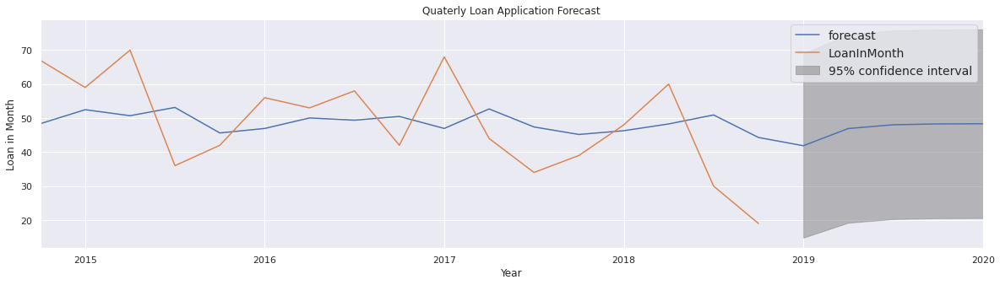

In [224]:
## Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
M_loan_city_num.resample('Q').last()
Q_loan_num_data= M_loan_city_num.resample('Q').last()
Q_loan_num_data=Q_loan_num_data['LoanInMonth']
# Forecast quaterly_loan_num_data using an AR(1) model
mod_Q_loan_num_data = ARMA(Q_loan_num_data, order=(1,0))
res_mod_Q_loan_num_data = mod_Q_loan_num_data.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_mod_Q_loan_num_data.plot_predict(start=0, end='2020',ax=ax)
plt.legend(fontsize=14)
plt.title('Quaterly Loan Application Forecast')
plt.ylabel('Loan in Month')
plt.xlabel('Year')
plt.show()

Above we have plotted the original series and the forecasted series. With 95% confidence interval, Expected Loans per month will be around 47. Low end is 20 & High End is 75

# Forecast expected monthly revenue

![](http://)![](http://)![](http://)![](http://)![](http://)Similarly, we ma[](http://)y forecast expected monthly revenue and plot original series and the forecasted series

In [225]:
mod_monthly_loan_rev_data = ARMA(monthly_loan_rev_data, order=(1,0))

res_monthly_loan_rev_data = mod_monthly_loan_rev_data.fit()
print("The AIC for an AR(1) is: ", res_monthly_loan_rev_data.aic)

The AIC for an AR(1) is:  1715.9386048157044


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


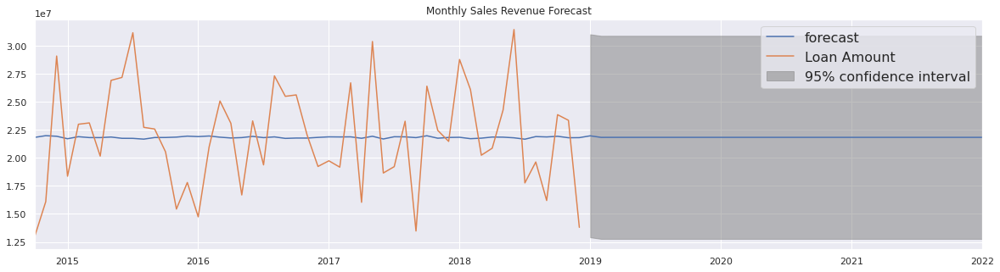

In [226]:
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_monthly_loan_rev_data.plot_predict(start=0, end='2022',ax=ax)
plt.legend(fontsize=16)
plt.title('Monthly Sales Revenue Forecast')
plt.show()

With 95% confidence interval, Expected Revenue per month will be around 22M. Low end is 13M & High End is 32M

# Forecasting Quarterly Sales Revenue

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


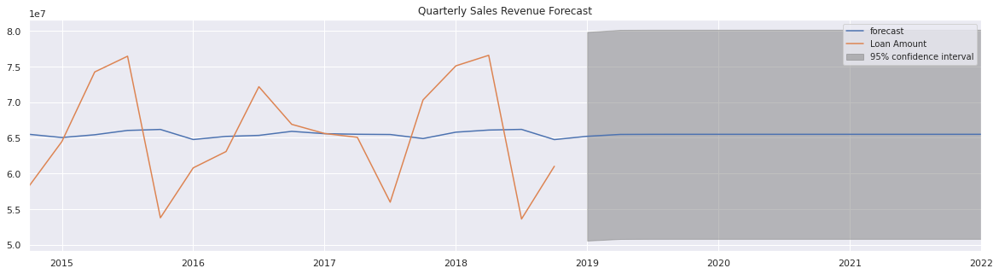

In [227]:
loan_patterns['date']= pd.DatetimeIndex(data['Created Date'])
loan_patterns = loan_patterns.set_index('date')
loan_patterns.index
quarterly_revenue_data = loan_patterns['Loan Amount'].resample(rule='Q').sum()
mod_quarterly_loan_rev_data = ARMA(quarterly_revenue_data, order=(1,0))
res_quarterly_loan_rev_data = mod_quarterly_loan_rev_data.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_quarterly_loan_rev_data.plot_predict(start=0, end='2022',ax=ax)
plt.legend(fontsize=10)
plt.title('Quarterly Sales Revenue Forecast')
plt.show()

With 95% confidence interval, Expected Revenue per Quarters will be around 67M. Low end is 52M & High End is 80M

# Forecasting Annual Sales Revenue

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


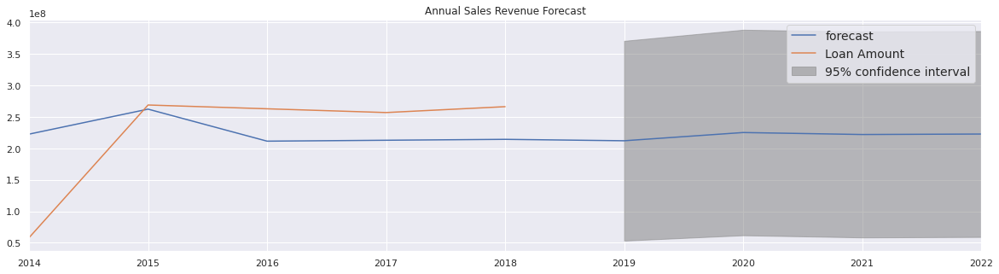

In [228]:
annual_revenue_data = loan_patterns['Loan Amount'].resample(rule='A').sum()
mod_annual_loan_rev_data = ARMA(annual_revenue_data, order=(1,0))
res_annual_loan_rev_data = mod_annual_loan_rev_data.fit()
# Plot the original series and the forecasted series
fig, ax = plt.subplots(figsize=(20,5))
res_annual_loan_rev_data.plot_predict(start=0, end='2022',ax=ax)
plt.legend(fontsize=14)
plt.title('Annual Sales Revenue Forecast')
plt.show()

In the above graph, we have plotted the original series and the forecasted series. We are expecting little drop in annual mortgage revene. Our current annual revenue is $270M. By end of 2021, with 95% confidence interval, Expected Revenue per Years will be around 220M. Low end is 70M & High End is 360M. With more annual data, we should be able to do better annual revenue prediction.

# Linear regression

Purpose of linear regression: Given a dataset containing predictor variables X and outcome/response variable Y, linear regression can be used to:

Build a predictive model to predict future values, using new data X where Y is unknown. Model the strength of the relationship between each independent variable X_i and Y Many times, only a subset of independent variables X_i will have a linear relationship with Y Need to figure out which X_i contributes most information to predict Y It is in many cases, the first pass prediction algorithm for continuous outcomes.

Linear Regression is a method to model the relationship between a set of independent variables X (also knowns as explanatory variables, features, predictors) and a dependent variable Y. This method assumes the relationship between each predictor X is linearly related to the dependent variable Y.

Independence means that the residuals are not correlated -- the residual from one prediction has no effect on the residual from another prediction. Correlated errors are common in time series analysis and spatial analyses.

In [229]:
from sklearn.model_selection import train_test_split # for train and test set split
from sklearn.model_selection import cross_val_score #Sklearn.model_seletion is used instead of sklearn.cross_validation to avoid
#warning

In [230]:
X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [231]:
print("size of the training feature set is",X_train.shape)
print("size of the test feature set is",X_test.shape)
print("size of the training Target set is",y_train.shape)
print("size of the test Target set is",y_test.shape)

size of the training feature set is (2000, 11)
size of the test feature set is (501, 11)
size of the training Target set is (2000,)
size of the test Target set is (501,)


In [232]:
#Linear regression
from sklearn.linear_model import LinearRegression #import from sklearn
linear_reg= LinearRegression() # instantiated linreg
linear_reg.fit(X_train,y_train) #fit the model

LinearRegression()

In [233]:
#predict using X_test
predicted_train= linear_reg.predict(X_train)
predicted_test= linear_reg.predict(X_test)

In [234]:
from sklearn.metrics import mean_squared_error # import mse from sklearn
#calculate root mean squarred error
rmse_train=np.sqrt(mean_squared_error(y_train, predicted_train))
rmse_test=np.sqrt(mean_squared_error(y_test, predicted_test))

In [235]:
print('The train root mean squarred error is :', rmse_train)
print('The test root mean squarred error is  :', rmse_test)

The train root mean squarred error is : 2.345908703691074
The test root mean squarred error is  : 3.963200847042714


In [236]:
print('The Linear Regression coefficient parameters are :', linear_reg.coef_ )

The Linear Regression coefficient parameters are : [-0.11919389  0.20419526 -0.08932699  0.17949017  0.16819986 -0.3501712
 -0.68726163  0.04346237 -0.07163668  0.56560897  0.16290692]


In [237]:
print('The Linear Regression intercept value is :', linear_reg.intercept_)

The Linear Regression intercept value is : 0.773425142014541


RMSE of the test data is closer to the training RMSE (and lower) if you have a well trained model. It will be higher if we have an overfitted model.

In [238]:
from sklearn import metrics # import metrics from sklearn
Rsquared=linear_reg.score(X_train,y_train) # to determine r square Goodness of fit
# how good the model fits the training data can be determined by R squared metric which is here 0.12
Rsquared
print('The R squared metric is :', Rsquared)

The R squared metric is : 0.12086787994354309


R^2 = 0.12

The R^2 in scikit learn is the coefficient of determination. It is 1 - residual sum of square / total sum of squares.

Since R^2 = 1 - RSS/TSS, the only case where RSS/TSS > 1 happens when our model is even worse than the worst model assumed (which is the absolute mean model).

here RSS = sum of squares of difference between actual values(yi) and predicted values(yi^) and TSS = sum of squares of difference between actual values (yi) and mean value (Before applying Regression). So you can imagine TSS representing the best(actual) model, and RSS being in between our best model and the worst absolute mean model in which case we'll get RSS/TSS < 1. If our model is even worse than the worst mean model then in that case RSS > TSS(Since difference between actual observation and mean value < difference predicted value and actual observation).

In [239]:
# K fold cross validation
# cross validation score
cv_score= cross_val_score(LinearRegression(),X,y,scoring='neg_mean_squared_error', cv=10) # k =10
print('cv_score is :\n', cv_score)

cv_score is :
 [-10.41761244  -2.87528686  -6.71334008  -6.83023816  -4.73823121
  -3.93130492 -11.82537791  -7.04069096  -3.51224496 -18.03312884]


In [240]:
# mean squared error
print('cv_score is :', cv_score.mean())

cv_score is : -7.591745633330166


In [241]:
# Root mean squared error
rmse_cv= np.sqrt(cv_score.mean() * -1)
print('The cross validation root mean squarred error is :', rmse_cv)

The cross validation root mean squarred error is : 2.755312256955673


With Linear regressor we are able to predict the model with RMSE: 
- train RMSE                                : 2.349923482270037 
- test RMSE                                 : 3.9655849638809144
- R squared                                 : 0.12 
- cross validation root mean squarred error : 2.75

# Fitting Linear Regression using statsmodels

Statsmodels is a great Python library for a lot of basic and inferential statistics. It also provides basic regression functions using an R-like syntax, so it's commonly used by statisticians. The version of least-squares we will use in statsmodels is called ordinary least-squares (OLS). There are many other versions of least-squares such as partial least squares (PLS) and weighted least squares (WLS).

In [242]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
# statsmodels works nicely with pandas dataframes
# The thing inside the "quotes" is called a formula, a bit on that below
m_rate = ols('y ~ RATE',model_data).fit()
print(m_rate.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     30.62
Date:                Sun, 07 Mar 2021   Prob (F-statistic):           3.47e-08
Time:                        01:42:52   Log-Likelihood:                -6185.5
No. Observations:                2501   AIC:                         1.238e+04
Df Residuals:                    2499   BIC:                         1.239e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.7391      0.315      8.705      0.0

In [243]:
m_home = ols('y ~ Home',model_data).fit()
print(m_home.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.826
Date:                Sun, 07 Mar 2021   Prob (F-statistic):             0.0506
Time:                        01:42:53   Log-Likelihood:                -6198.9
No. Observations:                2501   AIC:                         1.240e+04
Df Residuals:                    2499   BIC:                         1.241e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.6952      0.391      9.458      0.0

In [244]:
m_cltv = ols('y ~ CLTV',model_data).fit()
print(m_cltv.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.1159
Date:                Sun, 07 Mar 2021   Prob (F-statistic):              0.734
Time:                        01:42:54   Log-Likelihood:                -6200.7
No. Observations:                2501   AIC:                         1.241e+04
Df Residuals:                    2499   BIC:                         1.242e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.4975      0.148     30.334      0.0

In [245]:
m_zip = ols('y ~ zip_code',model_data).fit()
print(m_zip.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     39.59
Date:                Sun, 07 Mar 2021   Prob (F-statistic):           3.68e-10
Time:                        01:42:55   Log-Likelihood:                -6181.1
No. Observations:                2501   AIC:                         1.237e+04
Df Residuals:                    2499   BIC:                         1.238e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.6439      0.140     25.937      0.0

In [246]:
m_Fix_True = ols('y ~ Fix_True',model_data).fit()
print(m_Fix_True.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     45.11
Date:                Sun, 07 Mar 2021   Prob (F-statistic):           2.29e-11
Time:                        01:42:56   Log-Likelihood:                -6178.4
No. Observations:                2501   AIC:                         1.236e+04
Df Residuals:                    2499   BIC:                         1.237e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.5823      0.178     31.380      0.0

In [247]:
m_loaninmonths = ols('y ~ LoanInMonth',model_data).fit()
print(m_loaninmonths.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     8.688
Date:                Sun, 07 Mar 2021   Prob (F-statistic):            0.00323
Time:                        01:42:57   Log-Likelihood:                -6196.4
No. Observations:                2501   AIC:                         1.240e+04
Df Residuals:                    2499   BIC:                         1.241e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       4.7262      0.110     43.067      

In [248]:
m_rcpi = ols('y ~ LoanInMonth + RATE + Home + CLTV ',model_data).fit()
print(m_rcpi.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     9.611
Date:                Sun, 07 Mar 2021   Prob (F-statistic):           1.04e-07
Time:                        01:42:58   Log-Likelihood:                -6181.7
No. Observations:                2501   AIC:                         1.237e+04
Df Residuals:                    2496   BIC:                         1.240e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       2.5995      0.510      5.096      

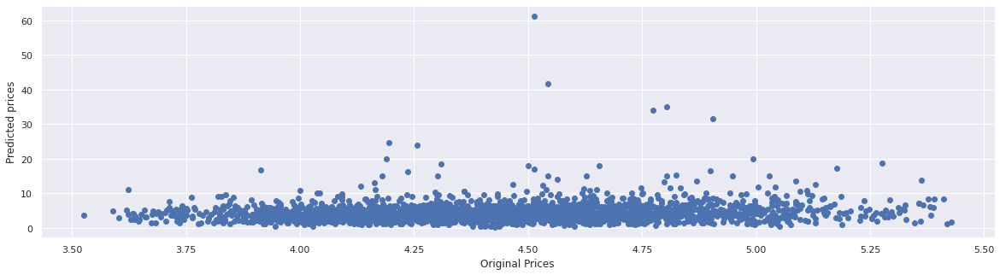

In [249]:
plt.figure(figsize=(20,5))
fdval = m_rcpi.fittedvalues
plt.scatter(fdval, y)
plt.ylabel('Predicted prices')
plt.xlabel('Original Prices')
plt.show()

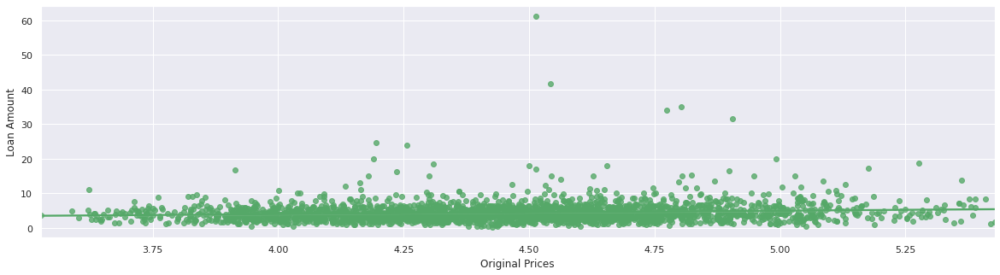

In [250]:
plt.figure(figsize=(20,5))
sns.regplot(x=fdval, y="Loan Amount", data=model_data, fit_reg = True, color='g')
plt.xlabel('Original Prices')
plt.show()

- RATE R^2 = 0.12 
- Home R^2 = 0.12 
- CLTV R^2 = 0.00 

In [251]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5,1.1,2.17,5.6


# Fitting Linear Regression using sklearn

Look inside lm object using dir(lm):

- lm.predit() 
- lm.fit()
- lm.score()
- lm.coef
- lm.intercept

Fit a linear model: The lm.fit() function estimates the coefficients the linear regression using least square

In [252]:
from sklearn.linear_model import LinearRegression
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])

In [253]:
# This creates a LinearRegression object
lm = LinearRegression()

In [254]:
# Use all 13 predictors to fit linear regression model
lm.fit(X, y)
lm.coef_

array([-0.01105033,  0.01025437, -0.01333403,  0.00174285,  0.00400437,
        0.00363987,  0.00524921, -0.09403164,  0.00865739])

In [255]:
lm.intercept_

1.0606217687257278

In [256]:
# The mean squared error
print("Mean squared error (Fix_True Rate): %.2f" % np.mean((lm.predict(X) - y) ** 2))

Mean squared error (Fix_True Rate): 0.09


In [257]:
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
lm.fit(X, y)
lm.coef_

array([-0.0412045 , -0.01471982,  0.02575119,  0.0285908 ,  0.03599996,
        0.0307028 , -0.01857171, -0.30139824,  0.21184628])

In [258]:
lm.intercept_

0.6426247496708174

In [259]:
# The mean squared erro
print("Mean squared error (loan_type_code): %.2f" % np.mean((lm.predict(X) - y) ** 2))

Mean squared error (loan_type_code): 0.80


In [260]:
X = np.array(fit_data.drop(['Loan Amount'],1))
y = np.array(fit_data['Loan Amount'])
lm.fit(X, y)
lm.coef_

array([-0.14167349,  0.20365157,  0.16847742, -0.39117177, -0.94311694,
        0.03639372, -0.09567086,  0.43022473,  0.15005741])

In [261]:
lm.intercept_

2.6968785807712528

In [262]:
# The mean squared error
print("Mean squared error (Loan Amount): %.2f" % np.mean((lm.predict(X) - y) ** 2))

Mean squared error (Loan Amount): 7.55


In [263]:
X = np.array(fit_data.drop(['unit_type_code'],1))
y = np.array(fit_data['unit_type_code'])
lm.fit(X, y)
lm.coef_

array([ 0.17296606, -0.09295463,  0.51523371,  0.27865598,  0.15271106,
       -0.03316152,  0.01888763, -0.18868001, -0.03092058])

In [264]:
lm.intercept_

5.4630590166131725

In [265]:
# The mean squared error
print("Mean squared error (unit_type_code): %.2f" % np.mean((lm.predict(X) - y) ** 2))

Mean squared error (unit_type_code): 7.76


# Let's try Regression: with Scale

Here is the different types of regression we have used with StandardScaler and GridSearchCV:
- LinearRegression
- Lasso
- Ridge
- ElasticNet
- SGDRegressor

In [266]:
import numpy as np
import pandas as pd
from pandas import DataFrame,Series
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [267]:
def pretty_print_linear(coefs, names = None, sort = False):
    if names is None:
        names = ["X%s" % x for x in range(len(coefs))]
    lst = zip(coefs, names)
    if sort:
        lst = sorted(lst, key = lambda x:-np.abs(x[0]))
    return " + ".join("%s * %s" % (round(coef, 3), name) for coef, name in lst)

In [268]:
def scale_data(X):
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    return X

In [269]:
def split_data(X,Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [270]:
def root_mean_square_error(y_pred,y_test):
    rmse_train = np.sqrt(np.dot(abs(y_pred-y_test),abs(y_pred-y_test))/len(y_test))
    return rmse_train

In [271]:
def plot_real_vs_predicted(y_pred,y_test):
    plt.figure(figsize=(20,5))
    plt.plot(y_pred,y_test,'ro')
    plt.plot([0,50],[0,50], 'g-')
    plt.xlabel('predicted')
    plt.ylabel('real')
    plt.title('real_vs_predicted')
    plt.show()
    return plt

In [272]:
np.set_printoptions(precision=2, linewidth=100, suppress=True, edgeitems=2)
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])
X = scale_data(X)  #Scalling Input Data
X_train, X_test, y_train, y_test = split_data(X,y)

# Let's try Regular Linear Regression:

In [273]:
fit_data.head()

,Loan Amount,city_code,zip_code,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,7,0,0,6,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,10,0,1,6,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,10,1,1,7,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,7,1,1,6,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,10,1,1,5,1.1,2.17,5.6


In [274]:
# Create linear regression object
linreg = LinearRegression()
# Train the model using the training sets
linreg.fit(X_train,y_train)
print("Linear model: ", pretty_print_linear(linreg.coef_, sort = True))

Linear model:  -0.034 * X7 + -0.034 * X0 + 0.025 * X1 + -0.015 * X2 + 0.01 * X6 + 0.009 * X8 + 0.008 * X5 + 0.002 * X3 + 0.0 * X4


In [275]:
# Predict the values using the model
y_lin_predict = linreg.predict(X_test)
# Print the root mean square error
print("Linear Regression - Root Mean Square Error: ", root_mean_square_error(y_lin_predict,y_test))

Linear Regression - Root Mean Square Error:  0.29829007960021225


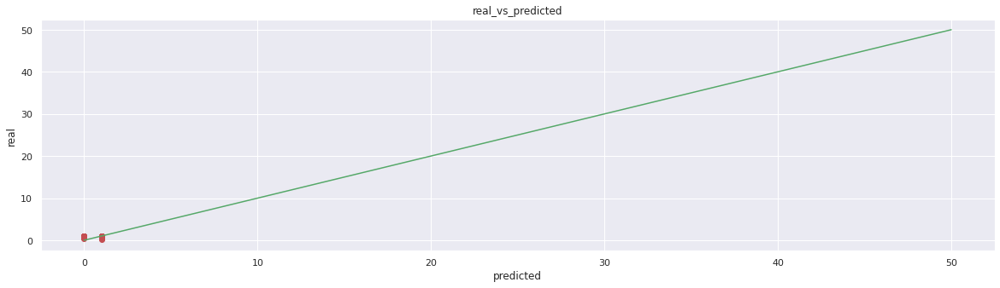

In [276]:
plot_real_vs_predicted(y_test,y_lin_predict)
plt.show()

# Let's try Lasso Regression:

In [277]:
# Create lasso regression object
lasso = Lasso(alpha=.3)
# Train the model using the training sets
lasso.fit(X_train, y_train)
print("Lasso model: ", pretty_print_linear(lasso.coef_, sort = True))

Lasso model:  -0.0 * X0 + 0.0 * X1 + -0.0 * X2 + -0.0 * X3 + 0.0 * X4 + 0.0 * X5 + 0.0 * X6 + -0.0 * X7 + 0.0 * X8


In [278]:
# Predict the values using the model
y_lasso_predict = lasso.predict(X_test)
# Print the root mean square error
print("Lasso model - Root Mean Square Error: ", root_mean_square_error(y_lasso_predict,y_test))

Lasso model - Root Mean Square Error:  0.3075792710571247


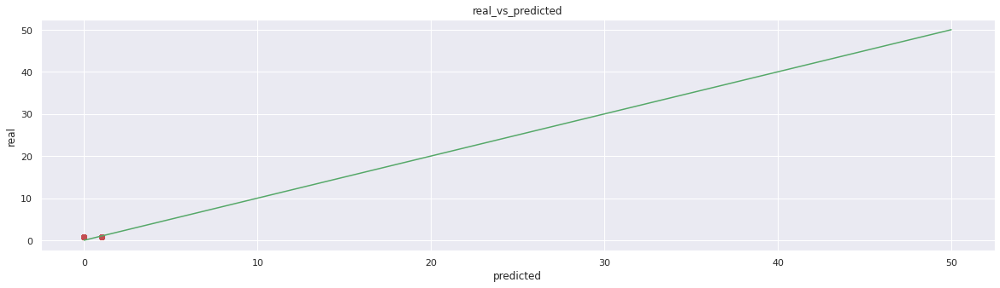

In [279]:
plot_real_vs_predicted(y_test,y_lasso_predict)
plt.show()

# Let's try Ridge Regression:

In [280]:
ridge = Ridge(fit_intercept=True, alpha=.3)
# Train the model using the training sets
ridge.fit(X_train, y_train)
print("Ridge model: ", pretty_print_linear(ridge.coef_, sort = True))

Ridge model:  -0.034 * X7 + -0.034 * X0 + 0.025 * X1 + -0.015 * X2 + 0.01 * X6 + 0.009 * X8 + 0.008 * X5 + 0.002 * X3 + 0.0 * X4


In [281]:
# Predict the values using the model
y_ridge_predict = ridge.predict(X_test)
# Print the root mean square error
print("Ridge Regression - Root Mean Square Error: ", root_mean_square_error(y_ridge_predict,y_test))

Ridge Regression - Root Mean Square Error:  0.2982901003998816


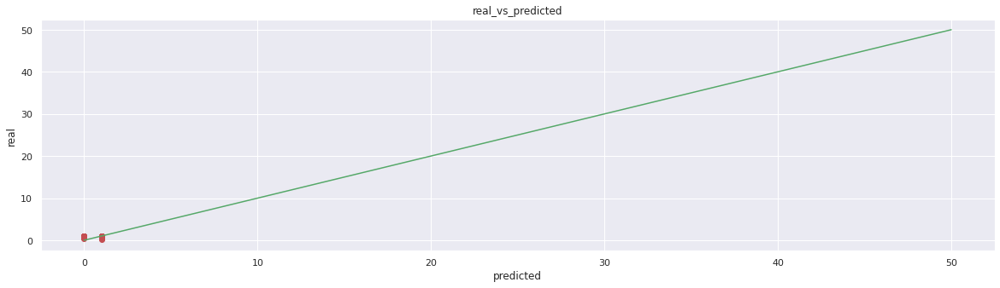

In [282]:
plot_real_vs_predicted(y_test,y_ridge_predict)
plt.show()

# Now let's try to do regression via Elastic Net.

In [283]:
elnet = ElasticNet(fit_intercept=True, alpha=.3)
# Train the model using the training sets
elnet.fit(X_train, y_train)
print("Elastic Net model: ", pretty_print_linear(elnet.coef_, sort = True))

Elastic Net model:  -0.0 * X0 + 0.0 * X1 + -0.0 * X2 + -0.0 * X3 + 0.0 * X4 + 0.0 * X5 + 0.0 * X6 + -0.0 * X7 + 0.0 * X8


In [284]:
# Predict the values using the model
y_elnet_predict = elnet.predict(X_test)
# Print the root mean square error
print("Elastic Net - Root Mean Square Error: ", root_mean_square_error(y_elnet_predict,y_test))

Elastic Net - Root Mean Square Error:  0.3075792710571247


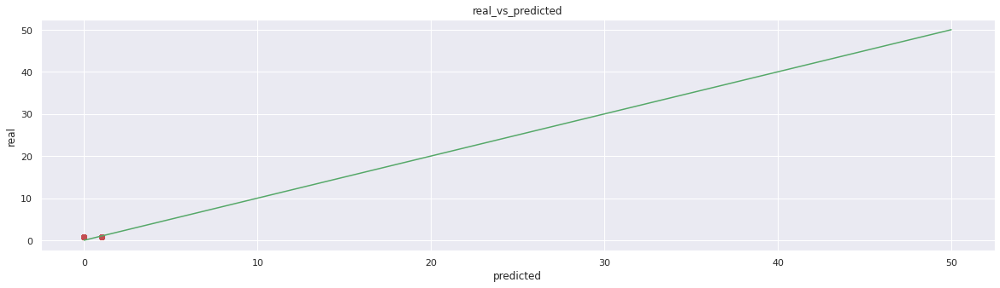

In [285]:
plot_real_vs_predicted(y_test,y_elnet_predict)
plt.show()

# Now let's try to do regression via Stochastic Gradient Descent.

In [286]:
sgdreg = SGDRegressor(penalty='l2', alpha=0.15, max_iter=200)
# Train the model using the training sets
sgdreg.fit(X_train, y_train)
print("Stochastic Gradient Descent model: ", pretty_print_linear(sgdreg.coef_, sort = True))

Stochastic Gradient Descent model:  -0.027 * X7 + -0.026 * X0 + 0.02 * X1 + -0.014 * X2 + 0.008 * X6 + -0.005 * X4 + 0.004 * X8 + 0.002 * X3 + 0.001 * X5


In [287]:
# Predict the values using the model
y_sgdreg_predict = sgdreg.predict(X_test)
# Print the root mean square error
print("Stochastic Gradient Descent - Root Mean Square Error: ", root_mean_square_error(y_sgdreg_predict,y_test))

Stochastic Gradient Descent - Root Mean Square Error:  0.2995404619222305


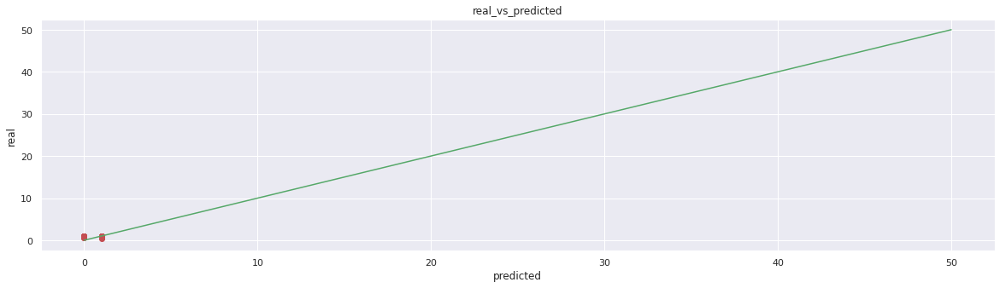

In [288]:
plot_real_vs_predicted(y_test,y_sgdreg_predict)
plt.show()

# Regression Summary Report

- Linear Regression - Root Mean Square Error : 0.298
- Lasso model - Root Mean Square Error : 0.308
- Ridge Regression - Root Mean Square Error : 0.298
- Elastic Net - Root Mean Square Error : 0.308
- Stochastic Gradient Descent - Root Mean Square Error : 0.298

Linear Regression, Ridge Regression, Stochastic Gradient Descent all have - Root Mean Square Error: 0.298 are performing best with low Root Mean Square Error

Now we have a pandas DataFrame called model_data containing all the data we want to use to predict Mortgage Loan prices. Let's create a variable called 'Loan Amount' which will contain the prices.

This information is contained in the target data.

In [289]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5,1.1,2.17,5.6


In [290]:
model_data=model_data3.copy()
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


In [291]:
model_data.columns

Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth', 'RATE', 'Home'],
      dtype='object')

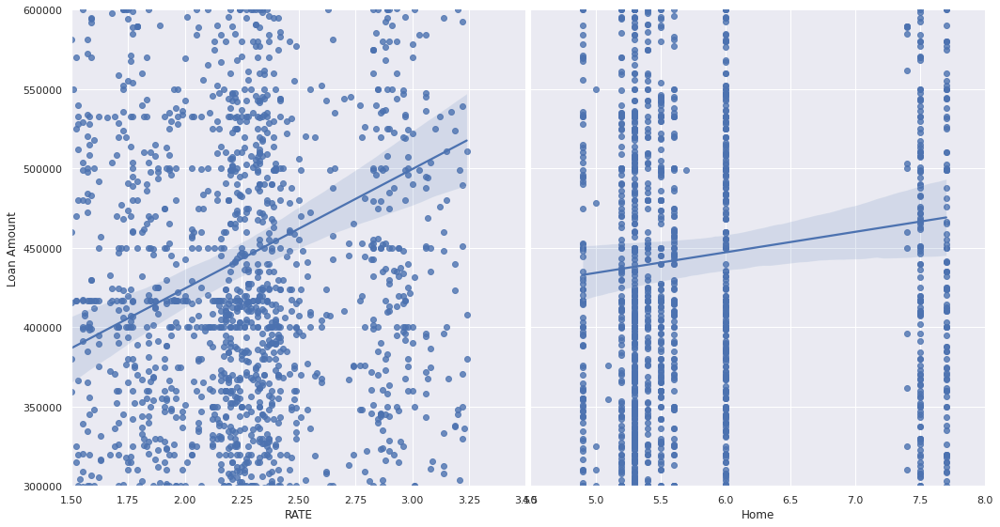

In [292]:
import seaborn as sns
%matplotlib inline
g1=sns.pairplot(model_data, x_vars=['RATE', 'Home'], y_vars='Loan Amount', height=8, aspect=0.9, kind='reg')
g1.axes[0,1].set_ylim(300000,600000)
g1.axes[0,0].set_xlim(1.5,3.5)
g1.axes[0,1].set_xlim(4.5,8)
plt.show()

# US 10-Years Interest Rate goes up loan amount increases

Home Supply increases, loan amount also increases slightly but eventually housing market will slow down

Interest Rate Chage has bigger impact on Loan Amount compare to Home Supply

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


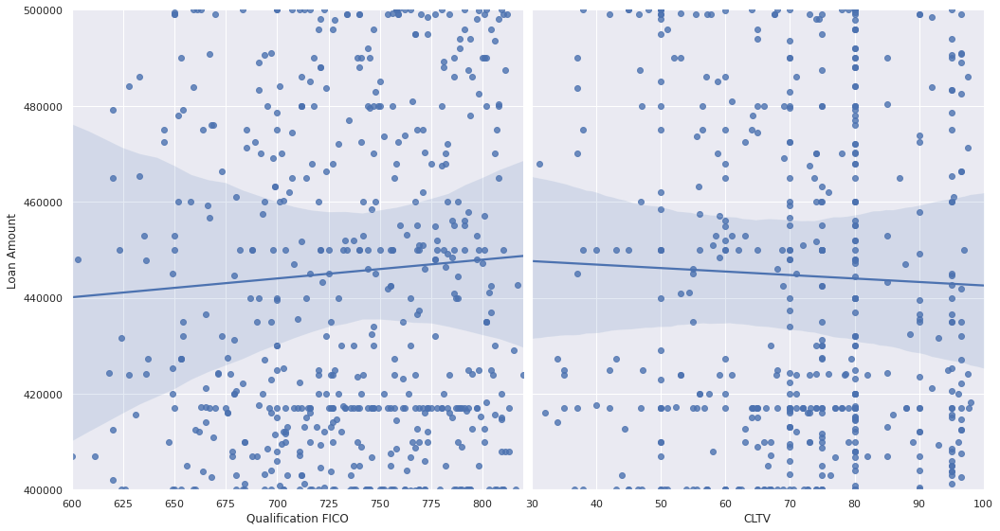

In [293]:
g=sns.pairplot(model_data, x_vars=['Qualification FICO', 'CLTV'], y_vars='Loan Amount', size=8, aspect=0.9, kind='reg')
g.axes[0,1].set_ylim(400000,500000)
g.axes[0,0].set_xlim(600, 820)
g.axes[0,1].set_xlim(30,100)
plt.show()

- Majority of the FICO scores between 600 and 820
- Majority of the CLTV scores between 30% and 100%
- FICO goes up, Loan Amount goes up
- CLTV goes up, Loan Amount Goes down

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


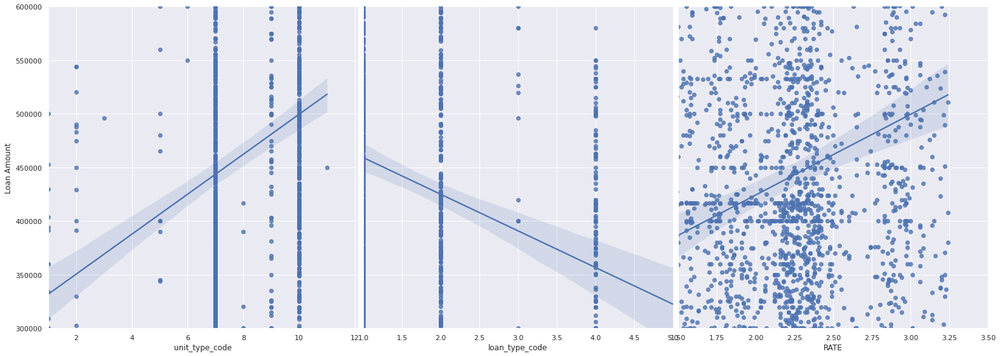

In [294]:
g2=sns.pairplot(model_data, x_vars=['unit_type_code',
       'loan_type_code', 'RATE'], y_vars='Loan Amount', size=8, aspect=0.9, kind='reg')
g2.axes[0,1].set_ylim(300000,600000)
g2.axes[0,0].set_xlim(1.0,12.1)
g2.axes[0,1].set_xlim(1,5)
g2.axes[0,2].set_xlim(1.5,3.5)
plt.show()

In [295]:
data_lc['Unit Type'].value_counts()

OneFamily      1276
TwoFamily       707
Condo           216
ThreeFamily     129
Coop             76
FourFamily       36
MixedUse         25
MultiFamily      20
Warehouse         8
PUD               6
Industrial        1
Land              1
Name: Unit Type, dtype: int64

In [296]:
data_lc['unit_type_code'].value_counts()

7     1276
10     707
0      216
9      129
1       76
2       36
5       25
6       20
11       8
8        6
4        1
3        1
Name: unit_type_code, dtype: int64

In [297]:
data_lc['Loan Type'].value_counts()

Conventional    1736
FHA              418
Residential      215
Commercial       100
Other             31
VA                 1
Name: Loan Type, dtype: int64

In [298]:
data_lc['loan_type_code'].value_counts()

1    1736
2     418
4     215
0     100
3      31
5       1
Name: loan_type_code, dtype: int64

As number of unit decreases ave Loan Amount also decreases

loan_type_code: Conventional is high volume but Slightly low average loan amount

ARM (Adjustable Rate Mortgage) has higher loan amount thn Fix_True Rate mortgage Two Family (Code = 10) has higher Loan Amount that three Family (Code = 9)

Conventional Mortgage has Higher Loan Amount FHA ARM has higher Loan Amount compare to Fix Rate Mortgage

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


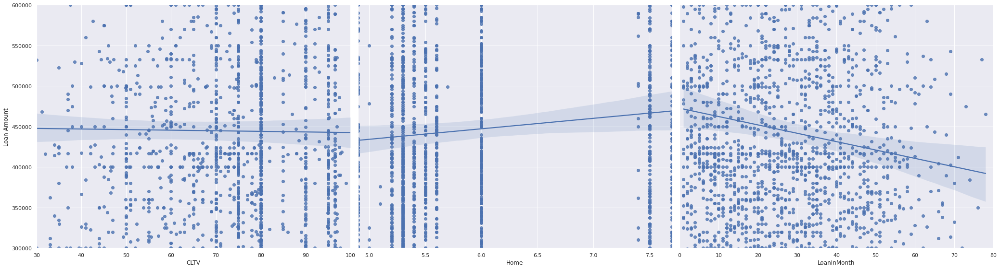

In [299]:
g3=sns.pairplot(model_data, x_vars=[ 'CLTV', 'Home', 'LoanInMonth'], y_vars='Loan Amount', size=8, aspect=1.2, kind='reg')
g3.axes[0,1].set_ylim(300000,600000)
g3.axes[0,0].set_xlim(30,100)
g2.axes[0,1].set_xlim(4.5,7.5)
g3.axes[0,2].set_xlim(0,80)
plt.show()

NYC NJ (zip_code between 7 & 11) seems to be closing more loans and generation more revenues for the Mortgage Bank. As number of loans per month inceases, loan amount decrease

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


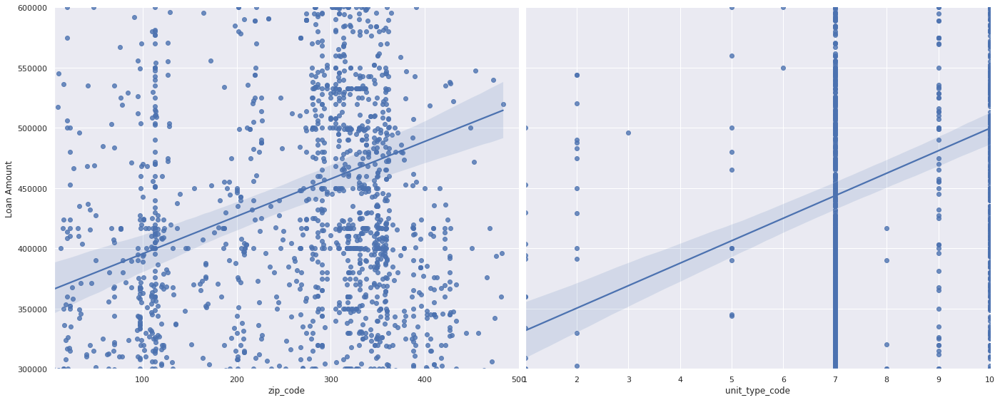

In [300]:
g4=sns.pairplot(model_data, x_vars=[ 'zip_code', 'unit_type_code'], y_vars='Loan Amount', size=8, aspect=1.2, kind='reg')
g4.axes[0,1].set_ylim(300000,600000)
g4.axes[0,0].set_xlim(6,500)
g4.axes[0,1].set_xlim(1,10)
plt.show()

NYC NJ (zip_code 1st digit starting with 7 & 11) seems to be closing more loans and generation more revenues for the Mortgage Bank. City shows similar results. Population density plays bigger role on Loan Amount. As number of loans per month increases, loan amount decreases

In [301]:
a

<AxesSubplot:title={'center':'Mortgage Loans Qualification FICO  Statistics'}, xlabel='Qualification FICO (%)', ylabel='Qualification FICO Scores'>

# Logistic Regression

In [302]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import train_test_split
from sklearn import preprocessing, neighbors

In [303]:
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X_train, X_test, y_train, y_test_knn = train_test_split(X, y, test_size = 0.2)

In [304]:
# Create the DataFrame: numeric_data_only
numeric_data_only = model_data[0:10].fillna(-1)
# Create training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [305]:
# Instantiate the classifier: clf
clf = OneVsRestClassifier(LogisticRegression())
# Fit the classifier to the training data
clf.fit(X_train, y_train)
# Print the accuracy
print("Logistic Regression Accuracy: {}".format(clf.score(X_test, y_test)))

Logistic Regression Accuracy: 0.6746506986027944


Logistic Regression Model Accuracy for Loan Types: 67.46%

**> Now Centering, Scaling and Logistic Regression and look at the model accuracy**

In [306]:
# Import necessary packages
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from sklearn import datasets
from sklearn import linear_model
import numpy as np

In [307]:
# Load data
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X.shape

(2501, 9)

In [308]:
y.shape

(2501,)

In [309]:
# Split the data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [310]:
# Train logistic regression model and print performance on the test set
lr = linear_model.LogisticRegression()

In [311]:
# fit the model
lr = lr.fit(X_train, y_train)
print('Logistic Regression score for training set: %f' % lr.score(X_train, y_train))

Logistic Regression score for training set: 0.708000


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [312]:
from sklearn.metrics import classification_report
y_true, y_pred = y_test, lr.predict(X_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.27      0.15      0.19        20
           1       0.68      0.97      0.80       339
           2       0.62      0.05      0.10        96
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        41

    accuracy                           0.67       501
   macro avg       0.32      0.23      0.22       501
weighted avg       0.59      0.67      0.57       501



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [313]:
from sklearn.preprocessing import scale
Xs = scale(X)
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
lr_2 = lr.fit(Xs_train, y_train)
print('Scaled Logistic Regression score for test set: %f' % lr_2.score(Xs_test, y_test))

Scaled Logistic Regression score for test set: 0.706587


In [314]:
y_true, y_pred = y_test, lr_2.predict(Xs_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.50      0.20      0.29        15
           1       0.71      0.99      0.83       350
           2       1.00      0.03      0.07        88
           3       0.00      0.00      0.00         2
           4       1.00      0.02      0.04        45
           5       0.00      0.00      0.00         1

    accuracy                           0.71       501
   macro avg       0.53      0.21      0.20       501
weighted avg       0.77      0.71      0.60       501



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


This is very interesting! The performance of logistic regression did not improve with data scaling. Why not, particularly when we saw that k-Nearest Neigbours performance improved substantially with scaling? The reason is that, if there predictor variables with large ranges that do not effect the target variable, a regression algorithm will make the corresponding coefficients ai small so that they do not effect predictions so much. K-nearest neighbours does not have such an inbuilt strategy and so we very much needed to scale the data.

# Scaling Synthesized Data

Scaling numerical data (that is, multiplying all instances of a variable by a constant in order to change that variable’s range) has two related purposes: i) if your measurements are in different currencies and, then, if we both scale our data, they end up being the same & ii) if two variables have vastly different ranges, the one with the larger range may dominate your predictive model, even though it may be less important to our target variable than the variable with the smaller range. What we saw is that this problem identified in ii) occurs with k-NN, which explicitly looks at how close data are to one another but not in logistic regression which, when being trained, will shrink the relevant coefficient to account for the lack of scaling. We can see was how the models performed before and after scaling.

Let’s now split into testing & training sets & plot both sets:

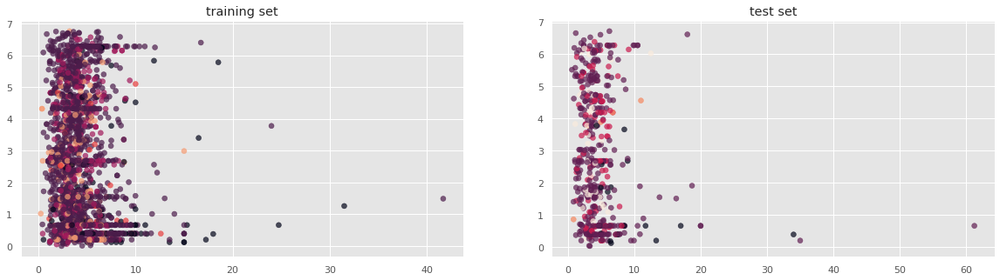

In [315]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
plt.figure(figsize=(20,5));
plt.subplot(1, 2, 1 );
plt.title('training set')
plt.scatter(X_train[:,0] , X_train[:,1],  c = y_train, alpha = 0.7);
plt.subplot(1, 2, 2);
plt.scatter(X_test[:,0] , X_test[:,1],  c = y_test, alpha = 0.7);
plt.title('test set')
plt.show()

Looking good! Now let’s instantiate a k-Nearest Neighbors voting classifier & train it on our training set

In [316]:
from sklearn import neighbors, linear_model
knn = neighbors.KNeighborsClassifier()
knn_model = knn.fit(X_train, y_train)
print('k-NN score for test set: %f' % knn_model.score(X_test, y_test))

k-NN score for test set: 0.700599


In [317]:
print('k-NN score for training set: %f' % knn_model.score(X_train, y_train))

k-NN score for training set: 0.767500


In [318]:
from sklearn.metrics import classification_report
y_true, y_pred = y_test, knn_model.predict(X_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.38      0.25      0.30        20
           1       0.72      0.94      0.81       339
           2       0.65      0.29      0.40        96
           3       0.00      0.00      0.00         5
           4       0.17      0.02      0.04        41

    accuracy                           0.70       501
   macro avg       0.38      0.30      0.31       501
weighted avg       0.64      0.70      0.64       501



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


We can notice the improvement for KNN compare to Logistic Regression Now with scaling KNN: We’ll now scale the predictor variables and then use k-NN again:

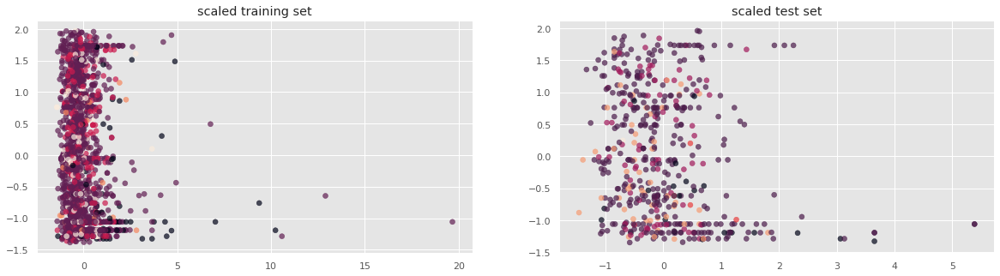

In [319]:
from sklearn.preprocessing import scale
Xs = scale(X)
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
plt.figure(figsize=(20,5));
plt.subplot(1, 2, 1 );
plt.scatter(Xs_train[:,0] , Xs_train[:,1],  c = y_train, alpha = 0.7);
plt.title('scaled training set')
plt.subplot(1, 2, 2);
plt.scatter(Xs_test[:,0] , Xs_test[:,1],  c = y_test, alpha = 0.7);
plt.title('scaled test set')
plt.show()

In [320]:
knn_model_s = knn.fit(Xs_train, y_train)
print('k-NN score for test set: %f' % knn_model_s.score(Xs_test, y_test))

k-NN score for test set: 0.690619


k-NN score for test set: 0.71 

It doesn’t perform any better with scaling! This is most likely because both features were already around the same range. It really makes sense to scale when variables have widely varying ranges. To see this in action, we’re going to add another feature. Moreover, this feature will bear no relevance to the target variable: it will be mere noise.

# Adding Gaussian noise to the signal (KNN):

We add a third variable of Gaussian noise with mean 0 and variable standard deviation σ. We’ll call σ the strength of the noise and we’ll see that the stronger the noise, the worse the performance of k-Nearest Neighbours

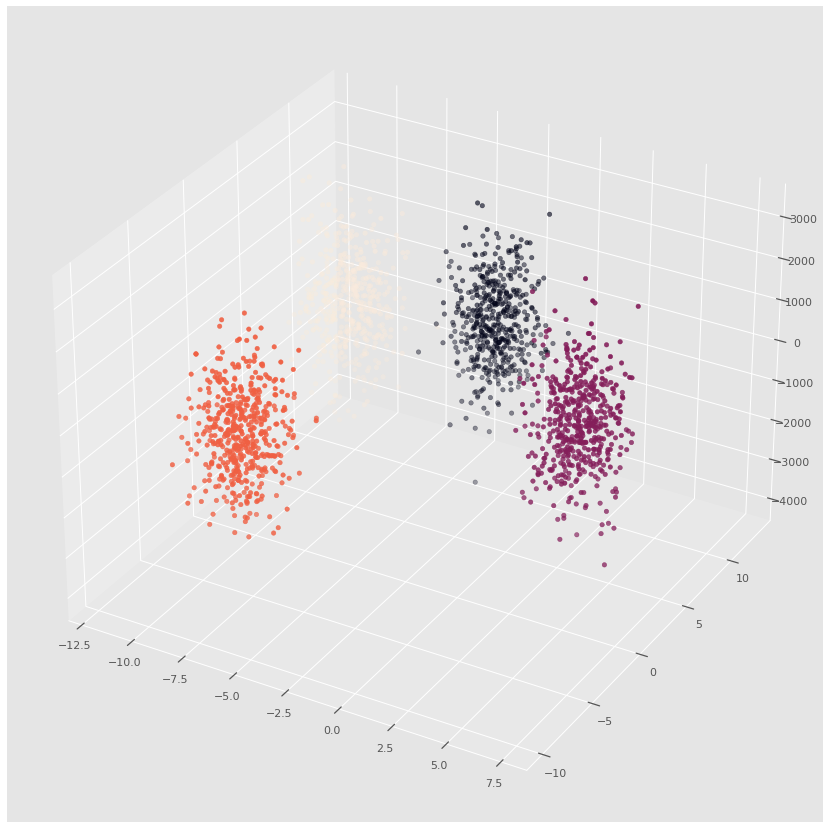

In [321]:
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
# Generate some clustered data (blobs!)
import numpy as np
from sklearn.datasets import make_blobs
n_samples=2000
X, y = make_blobs(n_samples, centers=4, n_features=2,
                  random_state=42)
# Add noise column to predictor variables
ns = 10**(3) # Strength of noise term
newcol = np.transpose([ns*np.random.randn(n_samples)])
Xn = np.concatenate((X, newcol), axis = 1)
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(15,15));
ax = fig.add_subplot(111, projection='3d' , alpha = 0.5);
ax.scatter(Xn[:,0], Xn[:,1], Xn[:,2], c = y);

In [322]:
Xn_train, Xn_test, y_train, y_test = train_test_split(Xn, y, test_size=0.2, random_state=42)
knn = neighbors.KNeighborsClassifier(n_neighbors=6)
knn_model = knn.fit(Xn_train, y_train)
print('k-NN score for test set: %f' % knn_model.score(Xn_test, y_test))

k-NN score for test set: 0.540000


k-NN score for test set: 0.58

This is a horrible model! How about we scale and check out performance?

In [323]:
Xns = scale(Xn)
s = int(.2*n_samples)
Xns_train = Xns[s:]
y_train = y[s:]
Xns_test = Xns[:s]
y_test = y[:s]
knn_models = knn.fit(Xns_train, y_train)
knn_accuracy = knn_models.score(Xns_test, y_test)
print('knn_accuracy for test set: ' , knn_accuracy)

knn_accuracy for test set:  1.0


In [324]:
knn_prediction = knn.predict(Xns[1515:1535])
print('KNN : - Output of Real Data : Conv=5, FHA=4, Res=3, Comm=2: ', (y[1515:1535]))

KNN : - Output of Real Data : Conv=5, FHA=4, Res=3, Comm=2:  [1 2 2 0 1 2 1 1 1 3 3 3 2 3 1 0 3 1 2 1]


In [325]:
print('KNN : - Output of prediction: Conv=5, FHA=4, Res=3, Comm=2: ',knn_prediction)

KNN : - Output of prediction: Conv=5, FHA=4, Res=3, Comm=2:  [1 2 2 0 1 2 1 1 1 3 3 3 2 3 1 0 3 1 2 1]


With Scale and Synthesize the data we can see huge improvement on the model accuracy.. 36% to 100% Let’s do same for Logistic Regression and check out the performance.

In [326]:
# Set sc = True if you want to scale your features
sc = False
#Import packages
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import neighbors, linear_model
from sklearn.preprocessing import scale
from sklearn.datasets import make_blobs
    #Generate some data
n_samples=2000
X, y = make_blobs(n_samples, centers=4, n_features=2, random_state=0)
# Add noise column to predictor variables
newcol = np.transpose([ns*np.random.randn(n_samples)])
Xn = np.concatenate((X, newcol), axis = 1)
#Scale if desired
if sc == True:
    Xn = scale(Xn)    
#Train model and test after splitting
Xn_train, Xn_test, y_train, y_test = train_test_split(Xn, y, test_size=0.2, random_state=42)
lr = linear_model.LogisticRegression()
lr_model = lr.fit(Xn_train, y_train)
print('logistic regression score for test set: %f' % lr_model.score(Xn_test, y_test))

logistic regression score for test set: 0.882500


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


logistic regression score for test set has improved from 70% to 0.87 or 87%

We can see big improvement. We have seen the essential place in the data scientific pipeline by preprocessing, in its scaling and centering incarnation, and we have done so to promote a holistic approach to minimize the challenges of machine learning.

To conclude, we have seen the essential place occupied in the data scientific pipeline by preprocessing, in its scaling and centering incarnation, and we have done so to promote a holistic approach to the challenges of machine learning.

# Random Forests (RF)

Random forests is a supervised learning algorithm. It can be used both for classification and regression. It is also the most flexible and easy to use algorithm. A forest is comprised of trees. It is said that the more trees it has, the more robust a forest is. Random forests creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting. It also provides a pretty good indicator of the feature importance. Random forests has a variety of applications, such as recommendation engines, image classification and feature selection. It can be used to classify loyal loan applicants, identify fraudulent activity and predict diseases.

- Random forests is considered as a highly accurate and robust method because of the number of decision trees participating in the process.

- It does not suffer from the over fitting problem. The main reason is that it takes the average of all the predictions, which cancels out the biases.

- The algorithm can be used in both classification and regression problems.

- Random forests can also handle missing values

In [327]:
import pandas as pd
import numpy as np
from sklearn import preprocessing, neighbors, svm 
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X_train, X_test, y_train, y_test_rfc = train_test_split(X, y, test_size = 0.2)
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True) 
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Unscaled: Random Forest Classifier Accuracy : ', rfc_accuracy)

Unscaled: Random Forest Classifier Accuracy :  0.7984031936127745


In [328]:
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
from sklearn.preprocessing import scale
X_scaled = scale(X)
X_train, X_test, y_train, y_test_rfc = train_test_split(X, y, test_size = 0.2)
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True) 
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Scaled: Random Forest Classifier Accuracy   : ', rfc_accuracy)

Scaled: Random Forest Classifier Accuracy   :  0.7465069860279441


In [329]:
#Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix?
rfc.predict(X_test)
y_pred_rfc = rfc.predict(X_test)
y_pred_rfc_out = rfc.predict(X[975:995,])
print('RFC Confussion Matrix: ')
confusion_matrix(y_test_rfc, y_pred_rfc, labels=None, sample_weight=None)

RFC Confussion Matrix: 


array([[  4,  15,   0,   0,   1],
       [  1, 323,  22,   0,   0],
       [  0,  53,  33,   0,   2],
       [  0,   3,   0,   1,   0],
       [  0,  27,   3,   0,  13]])

In [330]:
print('KNeighborsClassifier Accuracy : ', rfc_accuracy) 

KNeighborsClassifier Accuracy :  0.7465069860279441


In [331]:
print('RandomForestClassifier :Input Real Data : Conv=5, FHA=4, Res=3, Comm=2:\n', X[975:995,] )

RandomForestClassifier :Input Real Data : Conv=5, FHA=4, Res=3, Comm=2:
 [[ 3.    1.55  3.17  7.    1.    6.    4.5   1.96  5.4 ]
 [ 4.47  5.83  3.37 10.    1.    8.    4.6   1.71  5.4 ]
 [ 1.64  3.36  4.32  7.    1.    9.    4.    1.71  5.4 ]
 [ 3.25  2.29  3.79  7.    0.    7.    4.6   2.03  5.4 ]
 [ 4.05  1.55  3.18  7.    1.    6.    4.7   2.03  5.4 ]
 [ 2.27  3.18  3.83  7.    1.    6.    4.8   2.03  5.4 ]
 [ 6.25  2.84  3.58  7.    1.    7.    4.7   1.76  5.4 ]
 [ 1.84  1.27  3.31  1.    1.    7.    4.8   1.76  5.4 ]
 [ 3.46  5.75  0.34  7.    1.    7.    4.7   2.86  5.4 ]
 [ 1.86  4.54  3.55  1.    1.    8.    4.9   2.86  5.4 ]
 [ 9.4   0.4   3.09 10.    1.    7.    5.    2.86  5.4 ]
 [ 2.95  0.82  1.43  7.    1.    7.    4.9   2.    5.4 ]
 [ 4.42  2.05  3.44 10.    1.    6.    5.    2.    5.4 ]
 [ 4.8   4.32  1.13  0.    1.    7.    4.1   2.36  5.4 ]
 [ 7.44  0.2   2.81  9.    1.    6.    4.2   2.36  5.4 ]
 [ 3.88  2.68  3.58 10.    1.    5.    4.3   2.36  5.4 ]
 [ 6.8   0.94  

In [332]:
print('RandomForestClassifier :Output of X[975:995]:Conv=5, FHA=4, Res=3, Comm=0:' , y[975:995])

RandomForestClassifier :Output of X[975:995]:Conv=5, FHA=4, Res=3, Comm=0: [4 1 2 4 4 4 1 1 1 1 1 4 4 1 1 1 1 1 1 0]


In [333]:
print('RandomForestClassifier :Output of prediction: Conv=5, FHA=4, Res=3, Comm=:', y_pred_rfc_out)

RandomForestClassifier :Output of prediction: Conv=5, FHA=4, Res=3, Comm=: [4 1 2 1 4 4 1 1 1 1 1 4 4 1 1 1 1 1 1 0]


In [334]:
print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:\n', y_pred_rfc)

RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:
 [1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 4 1 1 1 4 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 1 1 2 1 1
 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 2 4 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 4 0 2 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 4 1
 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 4 2 1
 1 0 2 1 1 1 1 4 1 2 1 2 1 1 2 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 2 1 1 1 1 1 1 1 1 4 2 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 2 1
 1 1 2 1 1 1 2 1 1 1 1 1 4 1 1 2 1 4 1 1 1 1 1 1 1 1 1 1 1 2 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 2 1 1 1 1 1 1 1 2 1 1 1 0 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
 2 1 1 1 2 1 1 2 1 1 1 1 2 1 1 2 1 1 1 1 1 1 2 1 1 1 1 1 1 2 1 1 1 2 2 2 1 1 2 1 2 1 1 1 1 1 1 1 1
 1 1 2 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 

Unscaled: Random Forest Classifier Accuracy : 76%

Scaled: Random Forest Classifier Accuracy : 79%

Both unscalled and scalled for Random Forest Model accuray is almost close

# Let’s analyze Interest Rate types using Random Forest Classifier.

We have achieved greater accuracy compare to Loan Types. We have Fixed Rate mortgage where Fix_True = 1 & Fix_True = 0 for ARM (Adjustable Rate Mortgage)

In [335]:
import numpy as np
from sklearn import preprocessing, neighbors, svm
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)
X_train, X_test, y_train, y_test_rfc = train_test_split(X, y, test_size = 0.2)
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True)
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Random Forest Classifier Accuracy : ', rfc_accuracy)

Random Forest Classifier Accuracy :  0.9041916167664671


In [336]:
# Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix? # Hit enter
rfc.predict(X_test)
y_pred_rfc = rfc.predict(X_test)
y_pred_rfc_out = rfc.predict(X[975:995,])
print('RFC Confussion Matrix: ')
print(confusion_matrix(y_test_rfc, y_pred_rfc, labels=None, sample_weight=None))

RFC Confussion Matrix: 
[[ 10  43]
 [  5 443]]


In [337]:
print('RandomForestClassifier Accuracy : ', rfc_accuracy)

RandomForestClassifier Accuracy :  0.9041916167664671


In [338]:
print('RandomForestClassifier : - Input of Real Data : Fix_True =1 & ARM =0:\n ', X[975:995,])

RandomForestClassifier : - Input of Real Data : Fix_True =1 & ARM =0:
  [[ 300000.       155.       317.         4.       753.         7.         4.        62.
       45.         1.96       5.4 ]
 [ 447000.       583.       337.         2.       708.        10.         1.        87.82
       46.         1.71       5.4 ]
 [ 164326.25     336.       432.         4.       616.         7.         2.        95.
       40.         1.71       5.4 ]
 [ 325000.       229.       379.         2.       738.         7.         4.        75.
       46.         2.03       5.4 ]
 [ 405000.       155.       318.         2.       798.         7.         4.        66.61
       47.         2.03       5.4 ]
 [ 227500.       318.       383.         0.       767.         7.         4.        61.
       48.         2.03       5.4 ]
 [ 625000.       284.       358.         4.       733.         7.         1.        72.
       47.         1.76       5.4 ]
 [ 183750.       127.       331.         4.       719.  

In [339]:
print('RandomForestClassifier : - Output of X[975:995]: Fix_True =1 & ARM =0:' , y[975:995])

RandomForestClassifier : - Output of X[975:995]: Fix_True =1 & ARM =0: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]


In [340]:
print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_rfc_out)

RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]


In [341]:
print('\n############ Prediction  ######################')
print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:\n', y_pred_rfc)


############ Prediction  ######################
RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:
 [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

Random Forest Classifier Accuracy for Fix or ARM is : 0.87 or 87%

# Using Random Forest finding Important Features in Scikit-learn

Here, we are finding important features or selecting features in the Mortgage Loan dataset. In scikit-learn, we can perform this task in the following steps:

- First, we need to create a random forests model.

- Second, use the feature importance variable to see feature importance scores.

- Third, visualize these scores using the seaborn library.

In [342]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing, neighbors, svm
X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)
X_train, X_test, y_train, y_test_rfc = train_test_split(X, y, test_size = 0.2)
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True)
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Random Forest Classifier Accuracy : ', rfc_accuracy)

Random Forest Classifier Accuracy :  0.9021956087824351


In [343]:
#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
import pandas as pd
#col_names = (fit_data.columns)
X = (model_data.drop(['Qualification FICO'],1))
feature_cols = fit_data.columns
model_data.columns
feature_names = feature_cols
feature_imp = pd.Series(clf.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp

RATE                 0.146302
Loan Amount          0.130234
unit_type_code       0.108845
zip_code             0.104036
LoanInMonth          0.101241
city_code            0.097622
Fix_True             0.094612
CLTV                 0.085456
Home                 0.057427
loan_type_code       0.041427
loan_purpose_code    0.032797
dtype: float64

We can also visualize the feature importance. Visualizations are easy to understand and interpretable. For visualization, we have used a combination of matplotlib and seaborn

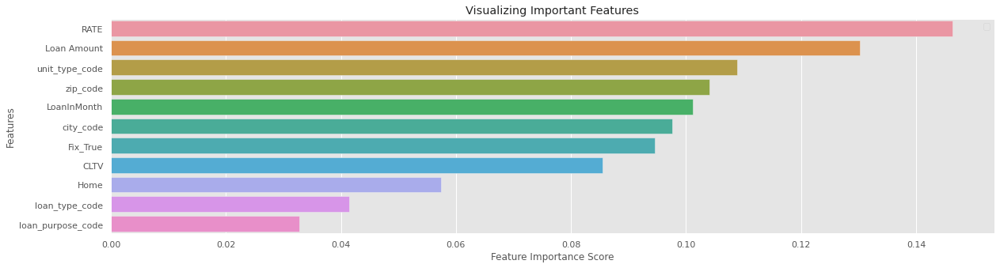

In [344]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.figure(figsize=(20,5))
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

Higher the value, greater the feature importance

# Support Vector Regression (SVR)

**SUPPORT VECTOR REGRESSION.** Those who are in Machine Learning or Data Science are quite familiar with the term SVM or Support Vector Machine. But SVR is a bit different from SVM. As the name suggest the SVR is an regression algorithm, so we can use SVR for working with continuous Values instead of Classification which is SVM.

In [345]:
X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# We want to use svm now
from sklearn import preprocessing,svm
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib import style
clf = svm.SVR()
clf.fit(X_train, y_train)
accuracy = clf.score(X_test, y_test)
print('SVM accuracy: ', accuracy)

SVM accuracy:  -0.025942089160640114


SVM-SVR accuracy: -0.026 which is unacceptable for our Mortgage Loan Data Sets

# Support Vector Machine (SVM)

A Support Vector Machine (SVM) is a discriminative classifier formally defined by a separating hyperplane. In other words, given labeled training data (supervised learning), the algorithm outputs an optimal hyperplane which categorizes new examples. In two dimensional space this hyperplane is a line dividing a plane in two parts where in each class lay in either side.

In [346]:
from sklearn import preprocessing, neighbors, svm
X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#Define SVM support vector classifier
svmc = svm.SVC(kernel='rbf', C=10, gamma=1)
svmc.fit(X_train, y_train)
svm_accuracy = svmc.score(X_test, y_test)
print('Support Vector Classifier Accuracy : ', svm_accuracy)

Support Vector Classifier Accuracy :  0.8962075848303394


In [347]:
# Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix? # Hit enter
svmc.predict(X_test)
y_pred_svm = svmc.predict(X_test)
print('SVC Confussion Matrix: ')
print(confusion_matrix(y_test, y_pred, labels=None, sample_weight=None))

SVC Confussion Matrix: 
[[  6  47   0   0]
 [  7 392  43   6]
 [  0   0   0   0]
 [  0   0   0   0]]


In [348]:
from sklearn.model_selection import cross_validate
svm_scores = cross_val_score(svmc, X, y, cv=7, scoring='accuracy')
print('SVM: cross_val_score accuracy : ', svm_scores)

SVM: cross_val_score accuracy :  [0.9 0.9 0.9 0.9 0.9 0.9 0.9]


Support Vector Classifier Accuracy : 0.896 or 90%

# k-Nearest Neighbors (KNN)

k-Nearest Neighbors: FIT

Having explored the Congressional mortgage records dataset, we have build our classifier. Here, we will fit a k-Nearest Neighbors classifier to the mortgage dataset. The features need to be in an array where each column is a feature and each row a different observation or data point. The target needs to be a single column with the same number of observations as the feature data. Notice we named the feature array X and response variable y: This is in accordance with the common scikit-learn practice. We need create an instance of a k-NN classifier with 6 neighbors (by specifying the n_neighbors parameter) and then fit it to the data.

# k-Nearest Neighbors: Predict

Having fit a k-NN classifier, we can use it to predict the label of a new data point. However, there is no unlabeled data available since all of it was used to fit the model! We will use your classifier to predict the label for this new data point, as well as on the training data X that the model has already seen.

In [349]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing,neighbors
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split # for train and test set split
from sklearn.model_selection import cross_val_score
X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
X_train, X_test, y_train, y_test_knn = train_test_split(X, y, test_size = 0.2)
from sklearn.neighbors import KNeighborsClassifier
print("size of the training feature set is",X_train.shape)

size of the training feature set is (2000, 11)


In [350]:
print("size of the test feature set is",X_test.shape)

size of the test feature set is (501, 11)


In [351]:
print("size of the training Target set is",y_train.shape)

size of the training Target set is (2000,)


In [352]:
print("size of the test Target set is",y_test.shape)

size of the test Target set is (501,)


In [353]:
# Import scale
from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)
# Print the mean and standard deviation of the unscaled features
print("Mean of Unscaled Features: {}".format(np.mean(X))) 

Mean of Unscaled Features: 40588.84442139507


In [354]:
print("Standard Deviation of Unscaled Features: {}".format(np.std(X)))

Standard Deviation of Unscaled Features: 154733.50862580768


In [355]:
# Print the mean and standard deviation of the scaled features
print("Mean of Scaled Features: {}".format(np.mean(X_scaled))) 

Mean of Scaled Features: -4.132413860696304e-18


In [356]:
print("Standard Deviation of Scaled Features: {}".format(np.std(X_scaled)))

Standard Deviation of Scaled Features: 1.0


In [357]:
knn = neighbors.KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
knn_accuracy = knn.score(X_test, y_test_knn)
print('KNeighborsClassifier Accuracy : ', knn_accuracy) 

KNeighborsClassifier Accuracy :  0.9001996007984032


In [358]:
knn_prediction = knn.predict(X[1200:1220,])
print('KNN : - Input of Real Data :: \n', X[1200:1220,])

KNN : - Input of Real Data :: 
 [[ 403200.       268.       358.         4.       694.        10.         1.        70.
       58.         2.38       5.3 ]
 [ 891000.       457.       348.         4.       745.         5.         0.        73.
       38.         2.78       5.3 ]
 [1116250.        38.       223.         4.       750.        10.         0.        55.3
       39.         2.78       5.3 ]
 [ 329670.       615.       337.         4.       762.         7.         1.        90.
       45.         1.89       5.3 ]
 [ 240000.       628.       306.         0.       788.         1.         1.        69.
       46.         1.89       5.3 ]
 [ 680000.       254.       333.         4.       724.        10.         1.        64.76
       47.         1.89       5.3 ]
 [ 424000.       578.       320.         4.       767.         7.         1.        53.
       59.         2.42       5.3 ]
 [ 289250.       288.       410.         4.       805.         7.         1.        65.
       60

In [359]:
print('KNN : - Output of Real Data :: ', y[1200:1220,])

KNN : - Output of Real Data ::  [1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1]


In [360]:
print('KNN : - Output of prediction:: ', knn_prediction)

KNN : - Output of prediction::  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


KNeighborsClassifier Accuracy : 0.882 or 88%

# How do we improve the KNN model

## Preprocessing: scaling

Here below I will take following steps to improve the model.

(i) scale the data,

(ii) use k-Nearest Neighbors

(iii) check the model performance.

We'll use scikit-learn's scale function, which standardizes all features (columns) in the array passed to it.

In [361]:
from sklearn.preprocessing import scale
Xs = scale(X)
from sklearn.model_selection import train_test_split
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
knn_model_2 = knn.fit(Xs_train, y_train)
print('k-NN score for test set: %f' % knn_model_2.score(Xs_test, y_test))

k-NN score for test set: 0.906188


In [362]:
print('k-NN score for training set: %f' % knn_model_2.score(Xs_train, y_train))

k-NN score for training set: 0.908500


In [363]:
y_true, y_pred = y_test, knn_model_2.predict(Xs_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.48      0.22      0.30        46
           1       0.93      0.98      0.95       455

    accuracy                           0.91       501
   macro avg       0.70      0.60      0.62       501
weighted avg       0.88      0.91      0.89       501



In [364]:
y_true, y_pred = y_test, knn_model_2.predict(Xs_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.48      0.22      0.30        46
           1       0.93      0.98      0.95       455

    accuracy                           0.91       501
   macro avg       0.70      0.60      0.62       501
weighted avg       0.88      0.91      0.89       501



All these measures improved by 3.25% improvement and significant! As hinted at above, before scaling there were a number of predictor variables with ranges of different order of magnitudes, meaning that one or two of them could dominate in the context of an algorithm such as k-NN. The two main reasons for scaling our data are

Our predictor variables may have significantly different ranges and, in certain situations, such as when implementing k-NN, this needs to be mitigated so that certain features do not dominate the algorithm; We want our features to be unit-independent, that is, not reliant on the scale of the measurement involved. If we both scale our respective data, this feature will be the same for each of us.

# Decision Tree Classifier

Using Scikit-learn, optimization of decision tree classifier performed by only pre-pruning. Maximum depth of the tree can be used as a control variable for pre-pruning. In the following the example, we can plot a decision tree on the same data with max_depth=4. Other than pre-pruning parameters, We have also tried other attribute selection measure such as entropy This pruned model is less complex, explainable, and easy to understand than the previous decision tree model plot.

**Pros**

- Decision trees are easy to interpret and visualize.
- It can easily capture Non-linear patterns.
- It requires fewer data preprocessing from the user, for example, there is no need to normalize columns.
- It can be used for feature engineering such as predicting missing values, suitable for variable selection.
- The decision tree has no assumptions about distribution because of the non-parametric nature of the algorithm.

**Cons**

- Sensitive to noisy data. It can overfit noisy data.
- The small variation(or variance) in data can result in the different decision tree.
- Decision trees are biased with imbalance dataset, so we can balance out the dataset before creating the decision tree.

# Decision Tree Algorithm

A decision tree is a flowchart-like tree structure where an internal node represents feature(or attribute), the branch represents a decision rule, and each leaf node represents the outcome. The topmost node in a decision tree is known as the root node. It learns to partition on the basis of the attribute value. It partitions the tree in recursively manner call recursive partitioning. This flowchart-like structure helps you in decision making. It's visualization like a flowchart diagram which easily mimics the human level thinking. That is why decision trees are easy to understand and interpret.

In [365]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
# Split dataset into training set and test set
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # 70% training and 30% test
#Building Decision Tree Model Let's create a Decision Tree Model using Scikit-learn.
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8428761651131824


In [366]:
# Import scale
from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)
clf.predict(X_test)
y_pred_dt = clf.predict(X_test)
y_pred_dt_out = clf.predict(X[975:995,])
print('DecisionTre Confussion Matrix: ')
print(confusion_matrix(y_test, y_pred_dt, labels=None, sample_weight=None))

DecisionTre Confussion Matrix: 
[[ 21  54]
 [ 64 612]]


In [367]:
dt_accuracy = clf.score(X_test, y_test)
print('Decision Tree Classifier Accuracy : ', dt_accuracy) 

Decision Tree Classifier Accuracy :  0.8428761651131824


In [368]:
print('Decision Tree Classifier : - Input of Real Data : Fix_True =1 & ARM =0:\n ', X[975:995,])

Decision Tree Classifier : - Input of Real Data : Fix_True =1 & ARM =0:
  [[ 3.    1.55  3.17  7.    4.    6.    4.5   1.96  5.4 ]
 [ 4.47  5.83  3.37 10.    1.    8.    4.6   1.71  5.4 ]
 [ 1.64  3.36  4.32  7.    2.    9.    4.    1.71  5.4 ]
 [ 3.25  2.29  3.79  7.    4.    7.    4.6   2.03  5.4 ]
 [ 4.05  1.55  3.18  7.    4.    6.    4.7   2.03  5.4 ]
 [ 2.27  3.18  3.83  7.    4.    6.    4.8   2.03  5.4 ]
 [ 6.25  2.84  3.58  7.    1.    7.    4.7   1.76  5.4 ]
 [ 1.84  1.27  3.31  1.    1.    7.    4.8   1.76  5.4 ]
 [ 3.46  5.75  0.34  7.    1.    7.    4.7   2.86  5.4 ]
 [ 1.86  4.54  3.55  1.    1.    8.    4.9   2.86  5.4 ]
 [ 9.4   0.4   3.09 10.    1.    7.    5.    2.86  5.4 ]
 [ 2.95  0.82  1.43  7.    4.    7.    4.9   2.    5.4 ]
 [ 4.42  2.05  3.44 10.    4.    6.    5.    2.    5.4 ]
 [ 4.8   4.32  1.13  0.    1.    7.    4.1   2.36  5.4 ]
 [ 7.44  0.2   2.81  9.    1.    6.    4.2   2.36  5.4 ]
 [ 3.88  2.68  3.58 10.    1.    5.    4.3   2.36  5.4 ]
 [ 6.8   0.94 

In [369]:
print('Decision Tree Classifier : - Output of X[975:995]: Fix_True =1 & ARM =0:' , y[975:995])

Decision Tree Classifier : - Output of X[975:995]: Fix_True =1 & ARM =0: [1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]


In [370]:
print('Decision Tree Classifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_dt_out)

Decision Tree Classifier : - Output of prediction: Fix_True =1 & ARM =0: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0]


Decision Tree Classifier Accuracy : 0.840 or 84%

# Visualizing Decision Trees

We have used Scikit-learn's export_graphviz function for display the tree within a Jupyter notebook. For plotting tree, you also need to install graphviz and pydotplus. export_graphviz function converts decision tree classifier into dot file and pydotplus convert this dot file to png or displayable form on Jupyter Notebook.

In [371]:
!pip install pydotplus

     |████████████████████████████████| 278 kB 1.2 MB/s 
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=4b1f02164611446676b4716568a43b948516a767d2d2488107434f1df697bf9e
  Stored in directory: /root/.cache/pip/wheels/1e/7b/04/7387cf6cc9e48b4a96e361b0be812f0708b394b821bf8c9c50
Successfully built pydotplus


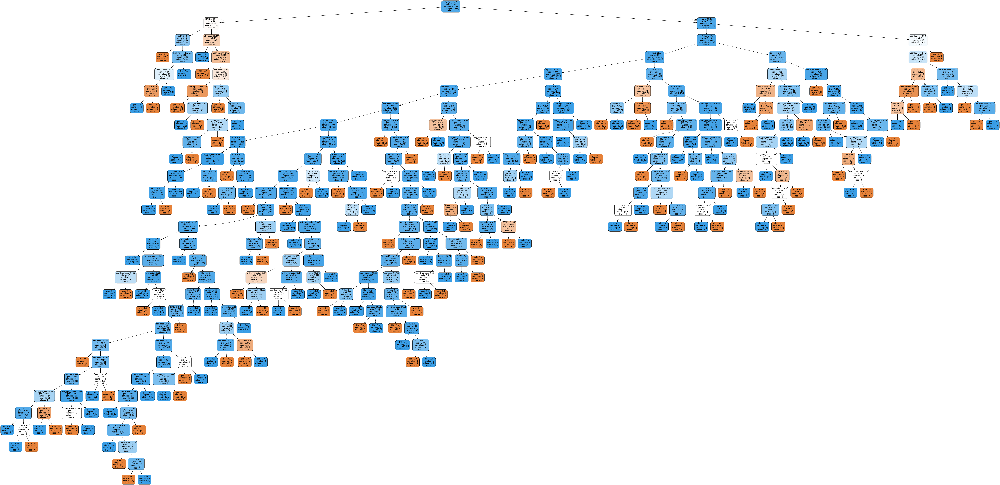

In [372]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
col_names = (fit_data.columns)
X = (fit_data.drop(['Loan Amount'],1))
y = (fit_data['Loan Amount'])
feature_cols = X.columns
fit_data.columns
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('./mortgage_dt.png')
Image(graph.create_png())

In Scikit-learn, optimization of decision tree classifier performed by only pre-pruning. Maximum depth of the tree can be used as a control variable for pre-pruning.

We can plot a decision tree on the same data with max_depth=3. Other than pre-pruning parameters, We can also try other attribute selection measure such as entropy.

In [373]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8974700399467377


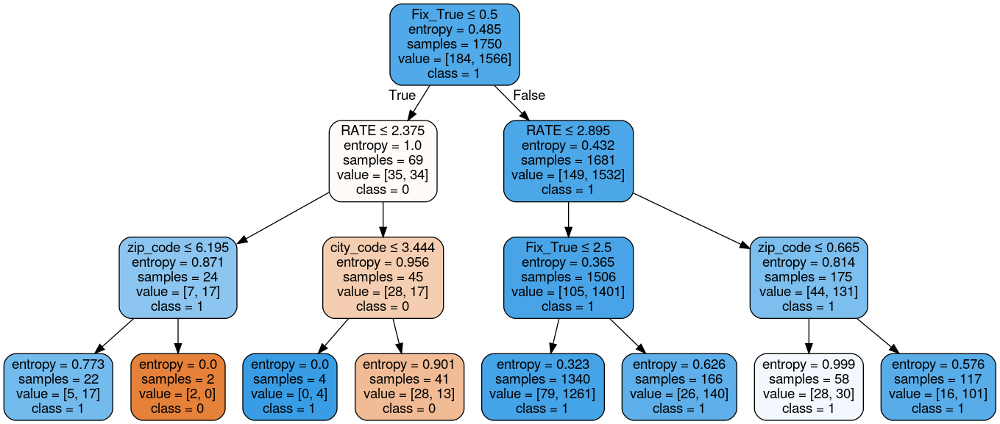

In [374]:
#Visualizing Decision Trees
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('./mortgage_dt.png')
Image(graph.create_png())

Plotted a decision tree on the same data with max_depth=3. Easy to visualize.

Decision tree model accuracy has also improved.